In [1]:
import utils as ut
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score,mean_squared_error
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

# SA STEP1

In [20]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
path='../../dvm-dos-tem/mads_calibration/results/'
params='sample_matrix_STP1-MD3.csv'
model='rsults_STP1-MD3.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [21]:
df_param

,cmax,cmax.1,cmax.2,cmax.3
0,5.616784,363.247266,1419.377317,1.291432
1,3.159748,94.886245,303.228195,1.768840
2,8.164372,281.311993,241.121108,1.953962
3,10.765399,113.912689,508.172086,0.550375
4,4.826361,219.409787,922.427905,0.742797
...,...,...,...,...
995,10.764510,314.261539,578.551160,0.626531
996,10.595196,356.386996,364.967916,1.026242
997,5.199794,336.224132,345.364791,0.599846
998,9.866175,59.530917,1022.779356,1.012052


In [22]:
df_model

,0,1,2,3
0,1.464479,112.104530,1388.279644,0.962620
1,0.818066,29.687531,262.470441,1.313684
2,2.134833,86.333321,210.398090,1.464540
3,2.795366,33.375881,439.170642,0.401113
4,1.236244,64.024106,879.823759,0.539894
...,...,...,...,...
996,2.753972,109.333246,315.420277,0.754667
997,1.345594,103.041133,298.945751,0.438677
998,2.540545,17.280731,984.211058,0.739310
999,1.333296,51.349628,1051.732923,0.372787


In [23]:
targets='GPP'
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

TypeError: spaghetti_match_plot() missing 1 required positional argument: 'df_y'

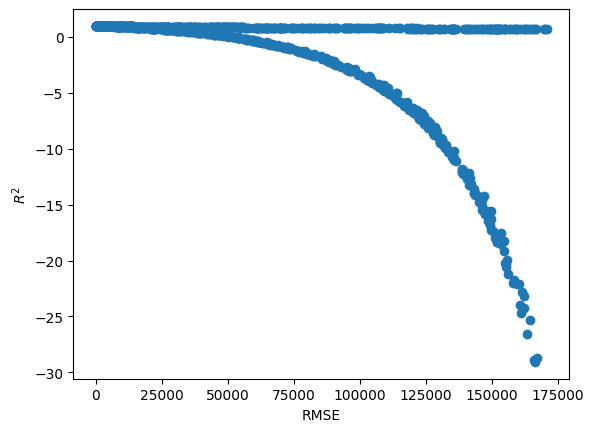

In [ ]:
ut.plot_r2_rmse(df_model)

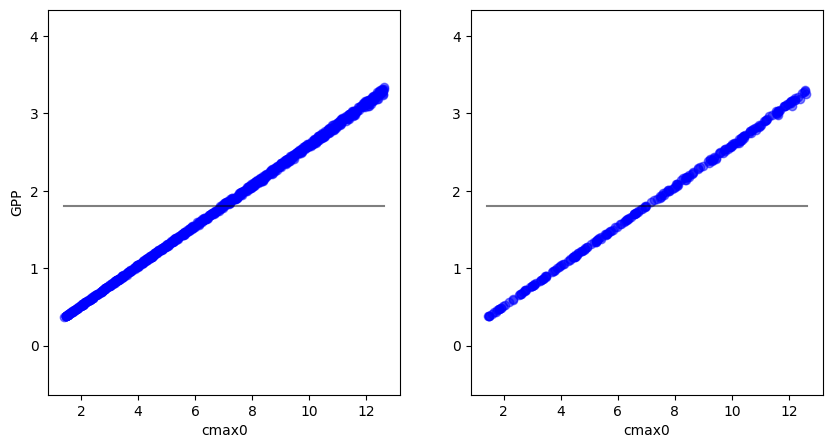

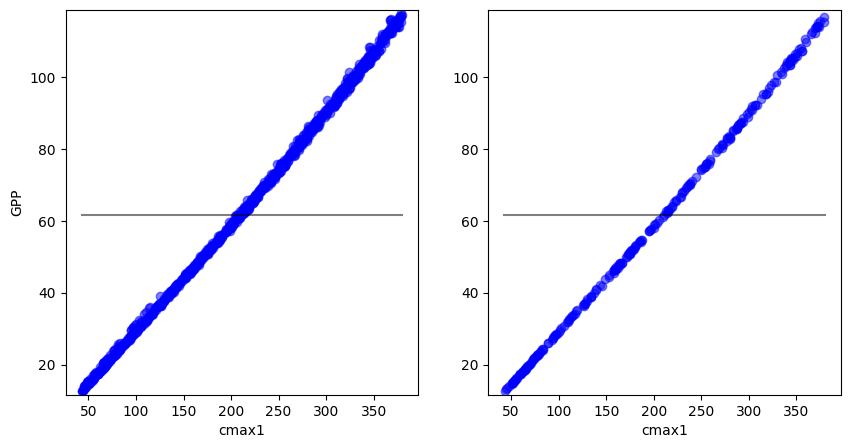

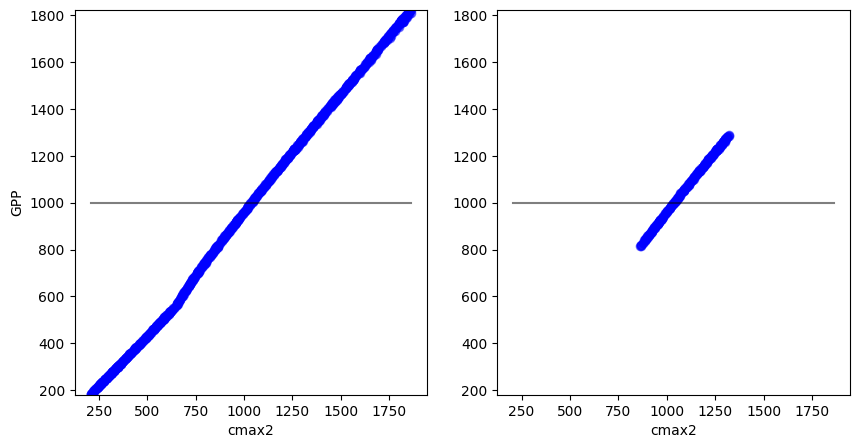

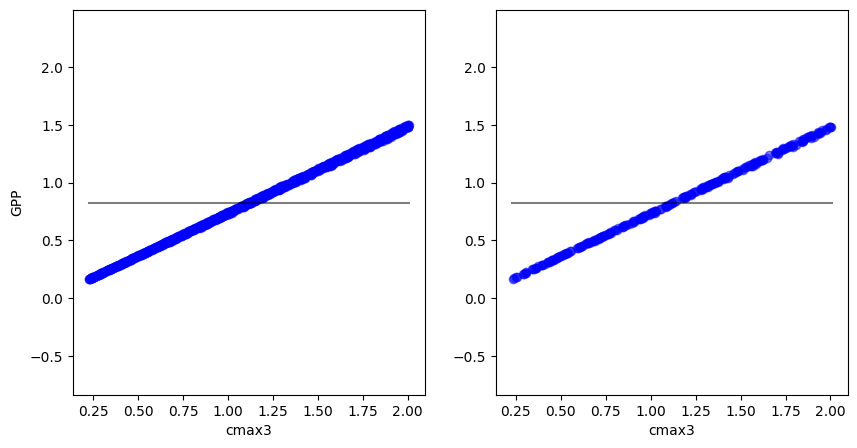

In [ ]:
# dfp=df_param.drop(df_param.iloc[0,:].name) # try dropping param name row
# obs=results. iloc[:-1,:]
# tar=results. iloc[-1:,:]

for i in range(4):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='cmax'+str(i),ylabel='GPP')

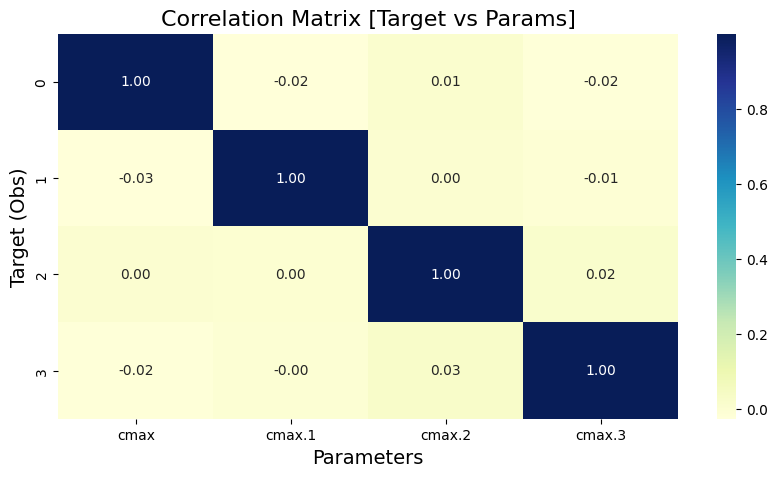

In [ ]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

# SA STEP 2

.8 variation around initial guess for param range

In [ ]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'

params='sample_matrix_STEP2-MD3-CR-noprior.csv'
params1='sample_matrix_STEP2-MD3-CR-noprior_2.csv'
model='results_STEP2-MD3-CR-noprior.txt'
model1='results_STEP2-MD3-CR-noprior_2.txt'

p = pd.read_csv(path_SA+params)
p1 = pd.read_csv(path_SA+params1)
df_param = pd.concat([p, p1], axis=0, ignore_index=True)

m = pd.read_csv(path_SA+model,header=None)
m1 = pd.read_csv(path_SA+model1,header=None)
df_model = pd.concat([m.iloc[0:-1,:], m1], axis=0, ignore_index=True)

In [ ]:
!cat ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP2-MD3-CR-noprior.csv

name,bounds,initial,cmtnum,pftnum
nmax,"[0.6199999999999997, 5.58]",3.1,3,0
nmax,"[0.5, 4.5]",2.5,3,1
nmax,"[1.3999999999999995, 12.600000000000001]",7.0,3,2
nmax,"[0.21999999999999997, 1.9800000000000002]",1.1,3,3
krb(0),"[-1.2399999999999993, -11.16]",-6.2,3,0
krb(0),"[-0.69, -6.210000000000001]",-3.45,3,1
krb(0),"[-0.69, -6.210000000000001]",-3.45,3,2
krb(0),"[-1.0099999999999998, -9.09]",-5.05,3,3
krb(1),"[-1.0359999999999996, -9.324]",-5.18,3,0
krb(1),"[-0.8899999999999997, -8.010000000000002]",-4.45,3,1
krb(1),"[-1.2699999999999996, -11.43]",-6.35,3,2
krb(2),"[-1.6399999999999997, -14.759999999999998]",-8.2,3,0
krb(2),"[-1.2599999999999998, -11.34]",-6.3,3,1
krb(2),"[-1.0999999999999996, -9.9]",-5.5,3,2


In [ ]:
xparams, ymodel = ut.get_params(df_param,df_model,r2lim=0.97)
xparams.std()

nmax        1.373949
nmax.1      1.018689
nmax.2      1.644447
nmax.3      0.512647
krb(0)      3.016087
krb(0).1    1.661997
krb(0).2    1.570393
krb(0).3    2.394026
krb(1)      2.444639
krb(1).1    2.215751
krb(1).2    2.038056
krb(2)      3.451516
krb(2).1    2.672093
krb(2).2    0.881955
dtype: float64

In [ ]:
xparams.min()

nmax         0.743859
nmax.1       0.726460
nmax.2       2.981704
nmax.3       0.289085
krb(0)     -10.911050
krb(0).1    -6.130093
krb(0).2    -6.154205
krb(0).3    -9.048520
krb(1)      -9.185928
krb(1).1    -7.790011
krb(1).2   -11.403817
krb(2)     -14.723032
krb(2).1   -11.288671
krb(2).2    -4.953519
dtype: float64

In [ ]:
xparams.max()

nmax         5.440353
nmax.1       4.316527
nmax.2      11.666315
nmax.3       1.958296
krb(0)      -1.680401
krb(0).1    -0.724135
krb(0).2    -0.791285
krb(0).3    -1.608772
krb(1)      -1.080332
krb(1).1    -0.925782
krb(1).2    -5.075457
krb(2)      -2.085371
krb(2).1    -1.403102
krb(2).2    -1.664390
dtype: float64

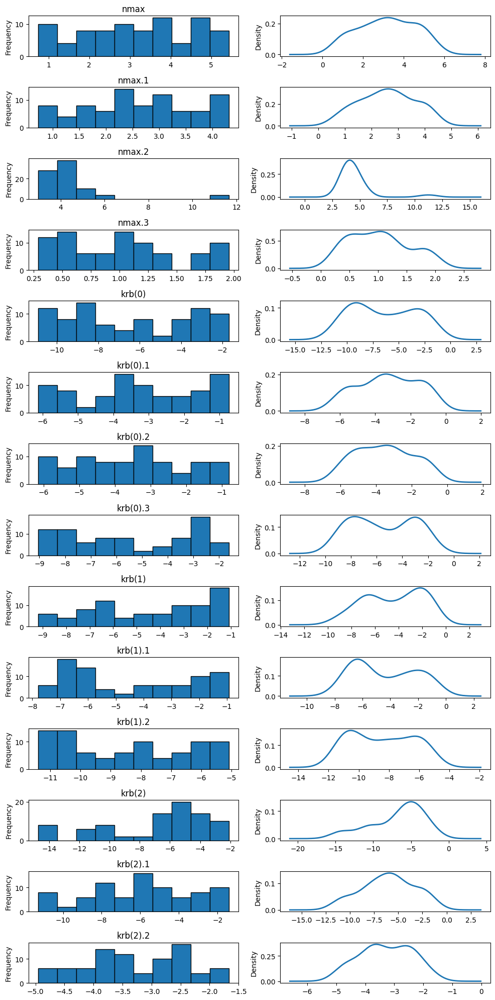

In [ ]:
ut.plot_hist_dist(xparams)

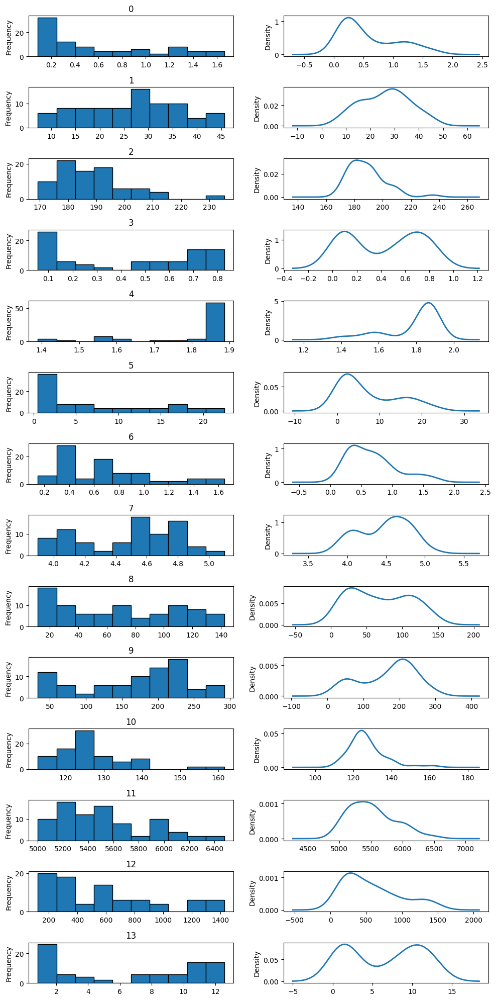

In [ ]:
ut.plot_hist_dist(ymodel)

In [ ]:
len(xparams)

84

<Axes: xlabel='Parameters', ylabel='Targets'>

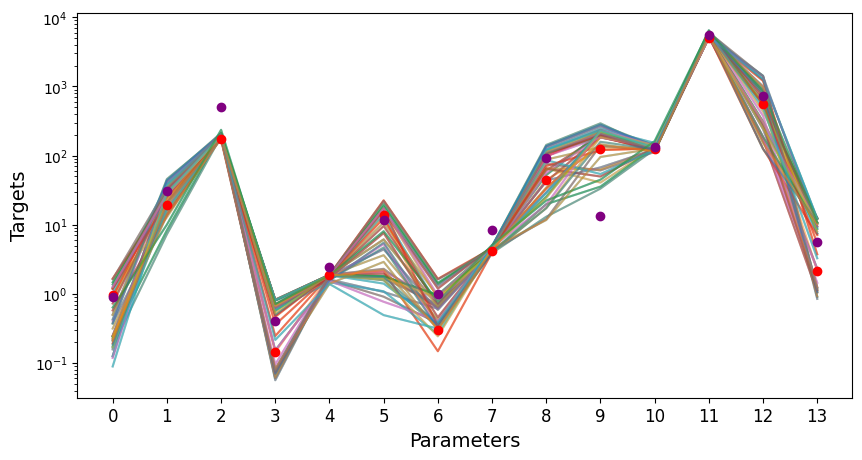

In [ ]:
ut.spaghetti_match_plot(xparams,ymodel,logy=True)
df_model.iloc[-1,:].plot(logy=True, style="o", color='purple')

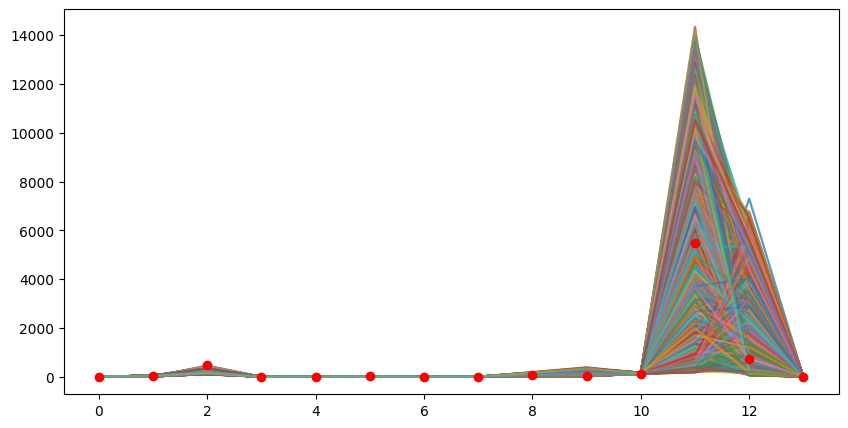

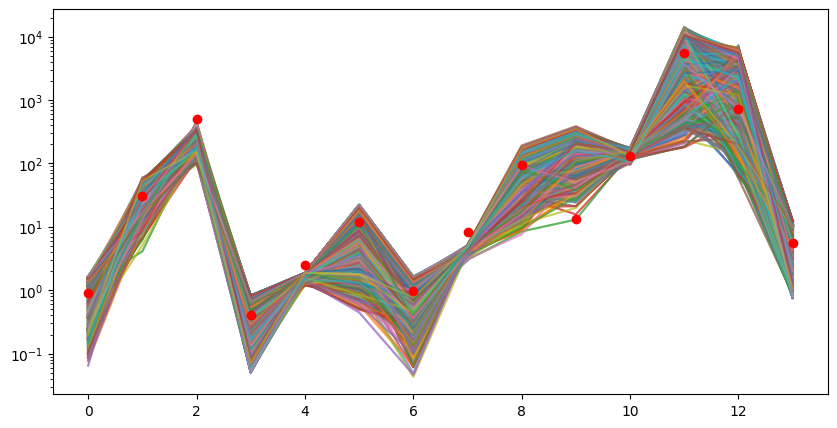

In [ ]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

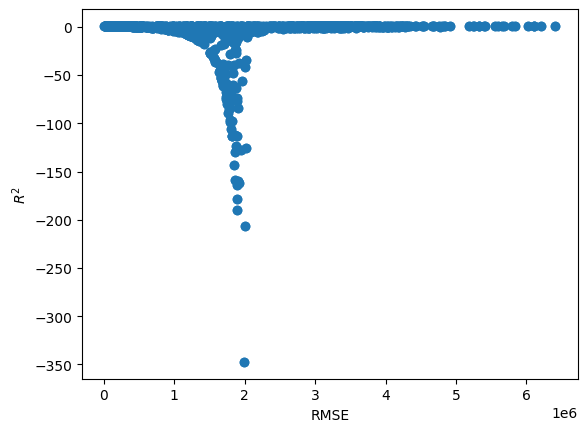

In [ ]:
rmse=ut.plot_r2_rmse(df_model)

In [ ]:
for i in range(4,13):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='krb'+str(i),ylabel='VEGC')

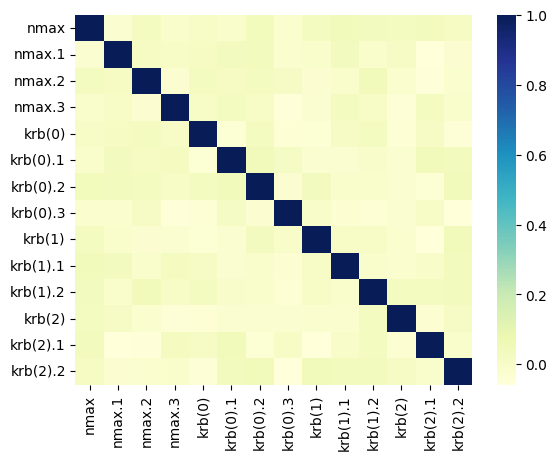

In [ ]:
corr_param=df_param.corr()
high_corr = corr_param[corr_param > 0.4]

sns.heatmap(corr_param, cmap="YlGnBu")
plt.show()

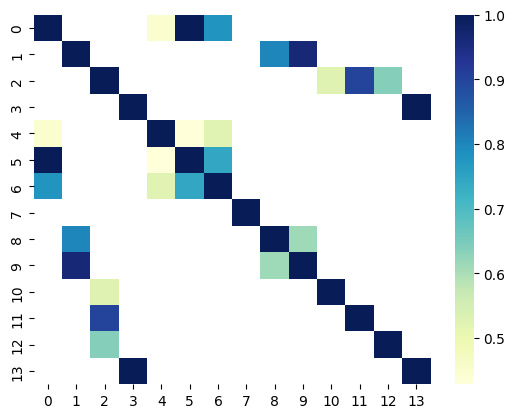

In [ ]:
corr_model=df_model.corr()
high_corr = corr_model[corr_model > 0.4]

sns.heatmap(high_corr, cmap="YlGnBu")
plt.show()

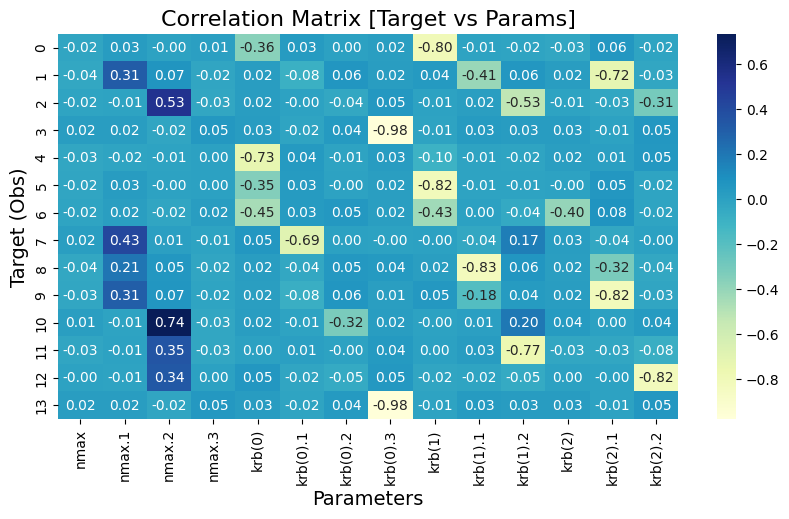

In [ ]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

STEP2-CR:NPP/VEGC model score on training data: 0.9996245550178129
STEP2-CR:NPP/VEGC model score on testing data: 0.9959379017224955


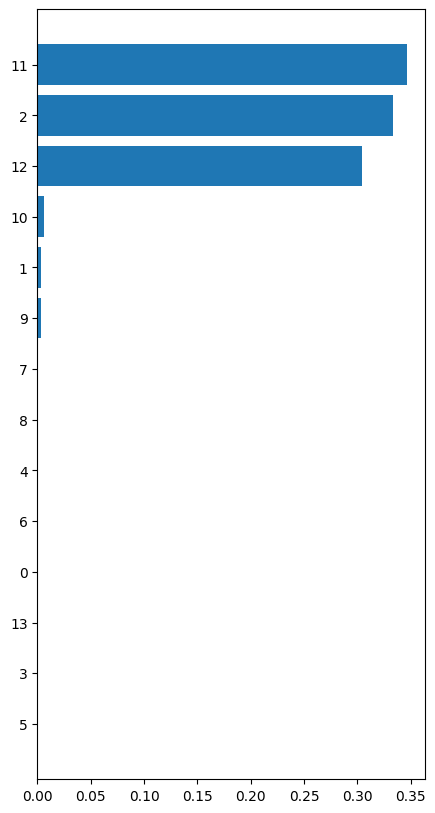

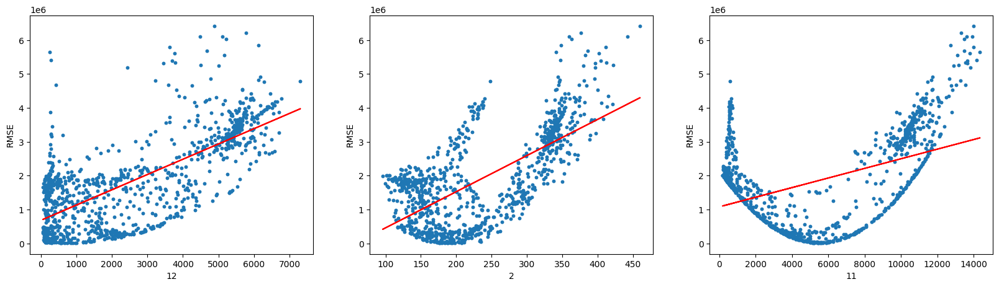

In [ ]:
ut.find_important_features(df_model.iloc[0:-1,:],rmse,1,'STEP2-CR:NPP/VEGC')

STEP2-CR:NPP/VEGC model score on training data: 0.9943519289015458
STEP2-CR:NPP/VEGC model score on testing data: 0.9635920724767656


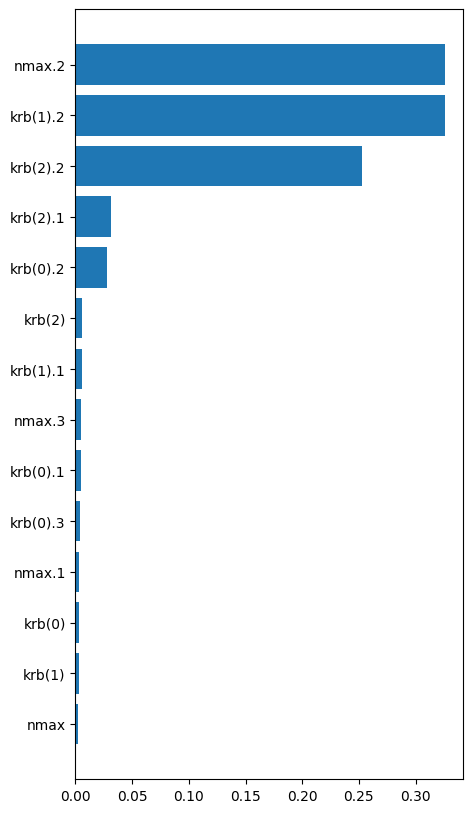

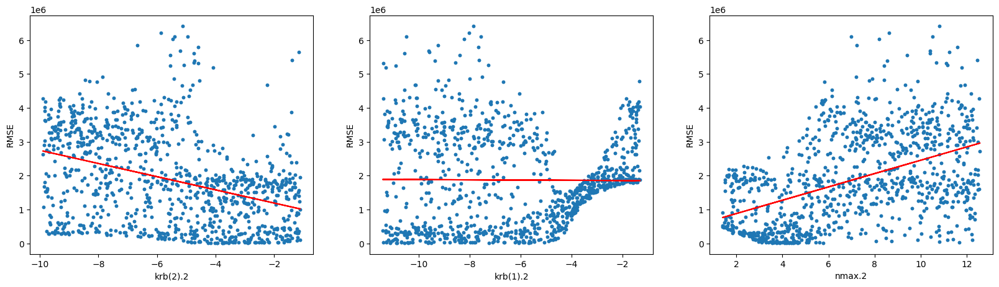

In [ ]:
ut.find_important_features(df_param,rmse,1,'STEP2-CR:NPP/VEGC')

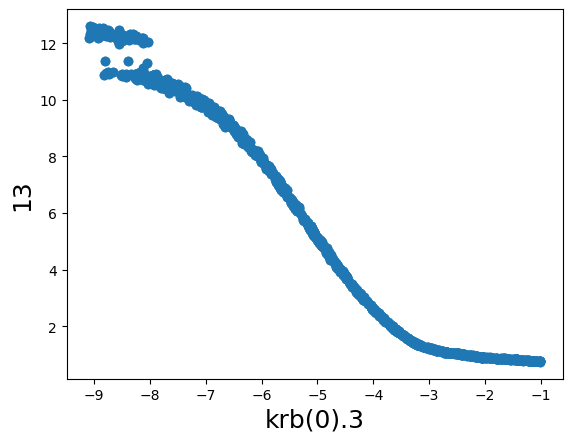

In [ ]:
plt.scatter( df_param['krb(0).3'],df_model.iloc[:-1,13])
plt.xlabel('krb(0).3',fontsize=18)
plt.ylabel('13',fontsize=18);

(-0.2534432232379913, 13.60780448913574)

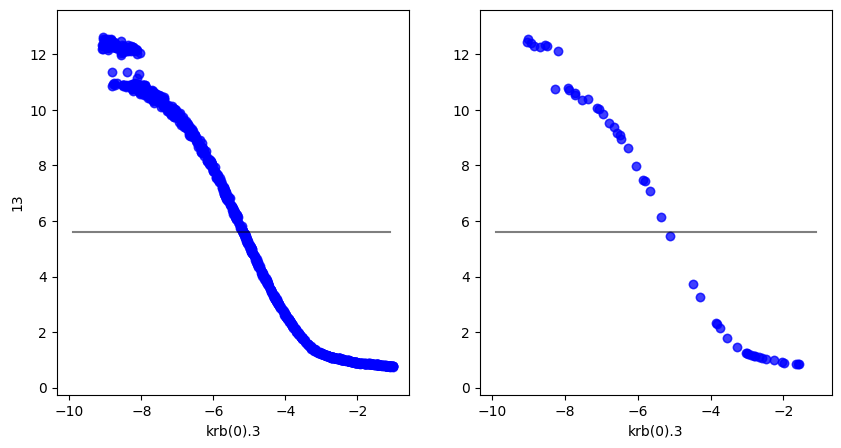

In [ ]:
x=df_param
y=df_model

tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

ax1.plot(x['krb(0).3'],y.iloc[:-1,13],'o',alpha=0.5,color='b')
ax1.set_xlabel('krb(0).3')
ax1.set_ylabel('13')
ax1.set_ylim([min(y.iloc[:,13])-1, max(y.iloc[:,13]+1)])
x1=min(x.iloc[:,13])
x2=max(x.iloc[:,13])
ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,13],alpha=0.5,color='black')

ax2.plot(tight_params['krb(0).3'],tight_model.iloc[:,13],'o',alpha=0.5,color='b')
ax2.set_xlabel('krb(0).3')
ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,13],alpha=0.5,color='black')
ax2.set_ylim([min(y.iloc[:,13])-1, max(y.iloc[:,13])+1])

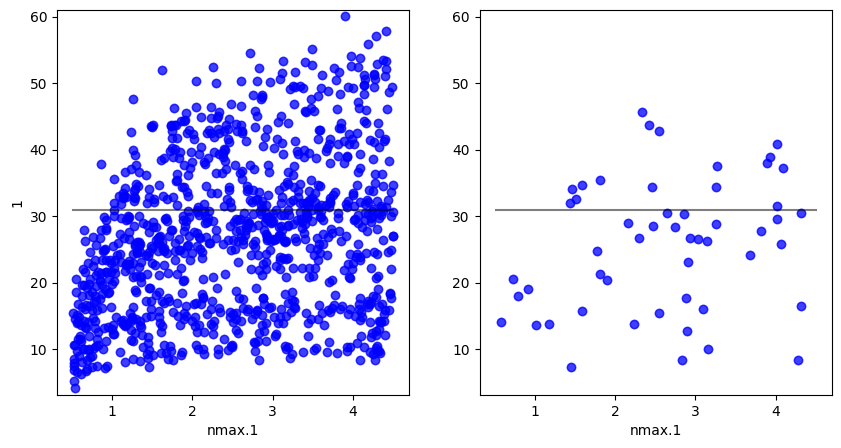

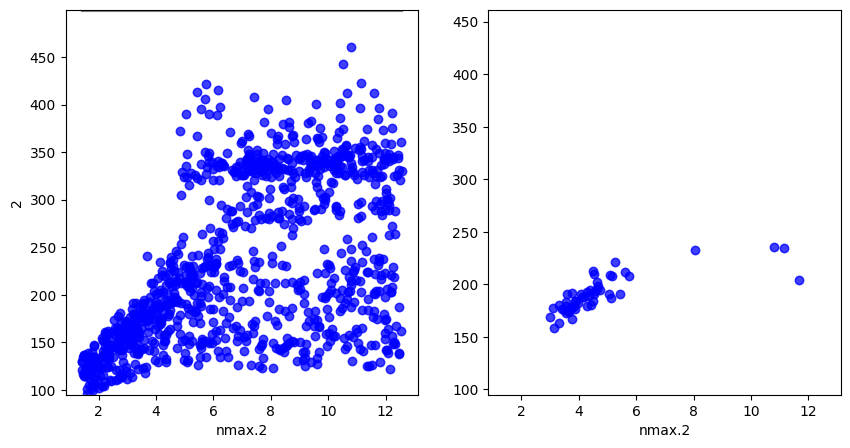

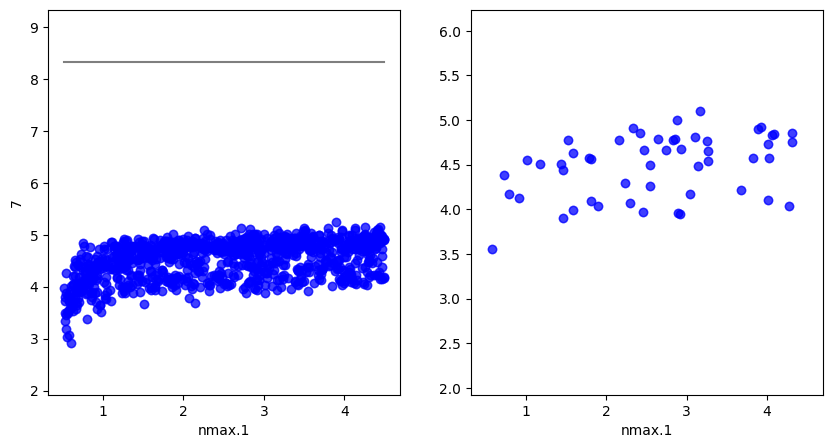

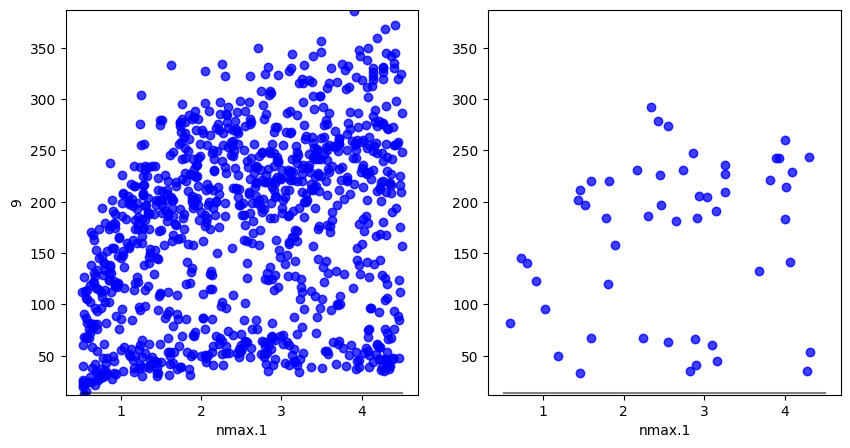

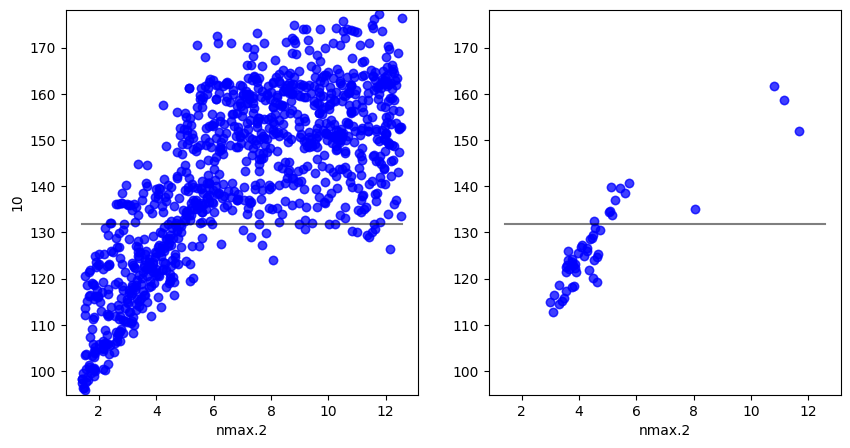

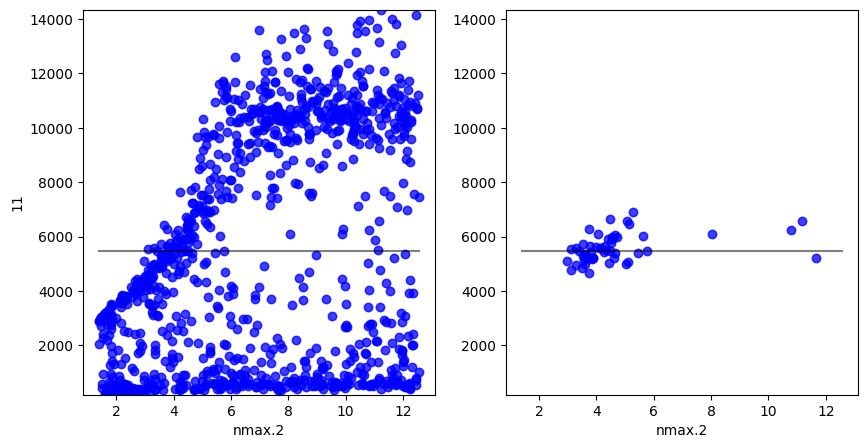

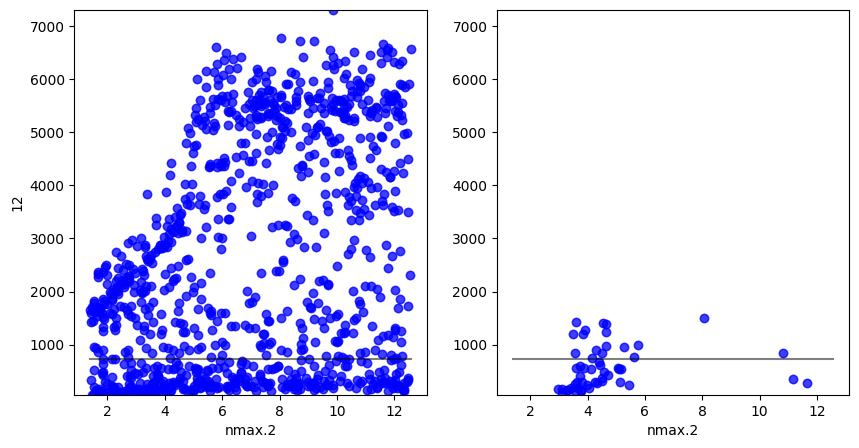

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = 0.30
corr_mask = corr_mp > corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

/tmp/ipykernel_3004/2076124885.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))


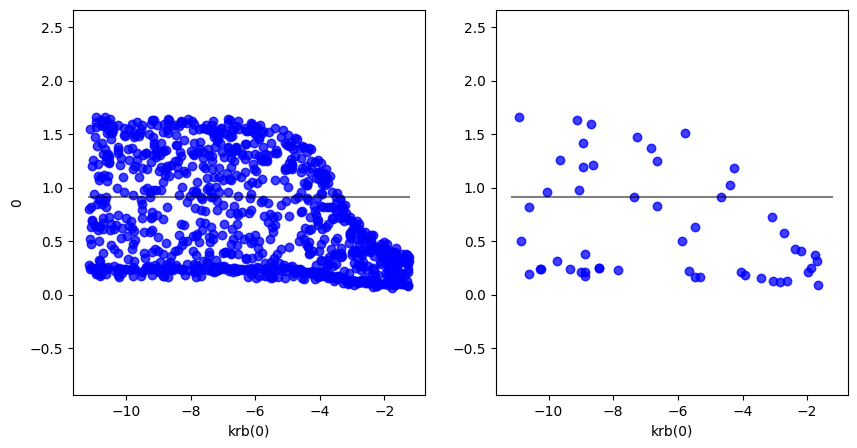

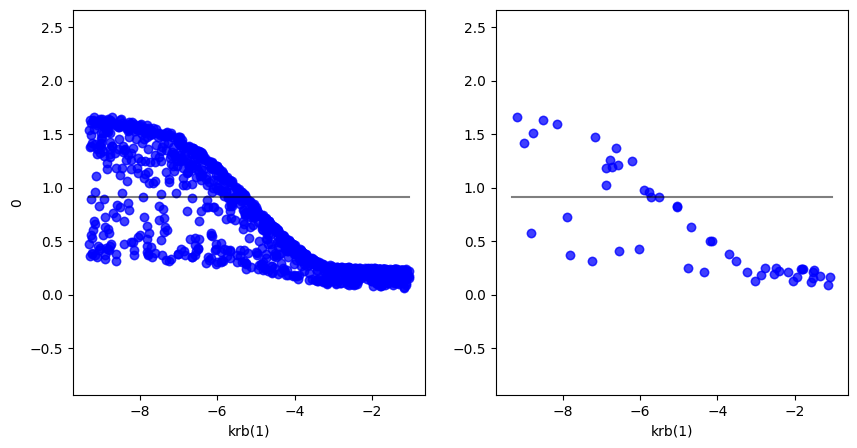

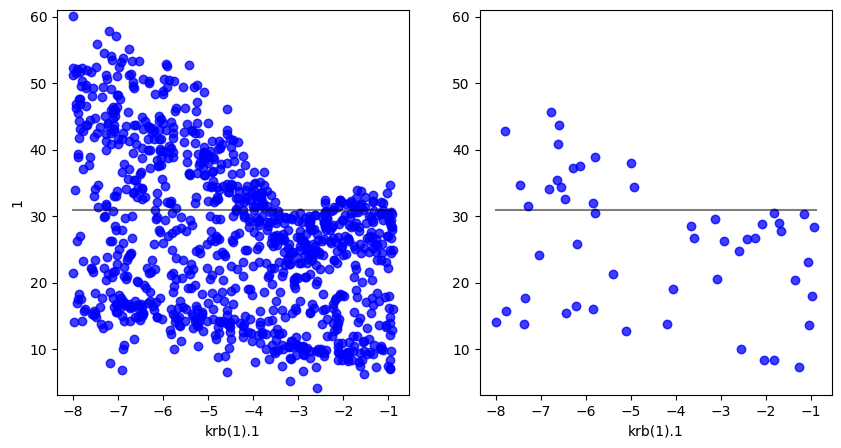

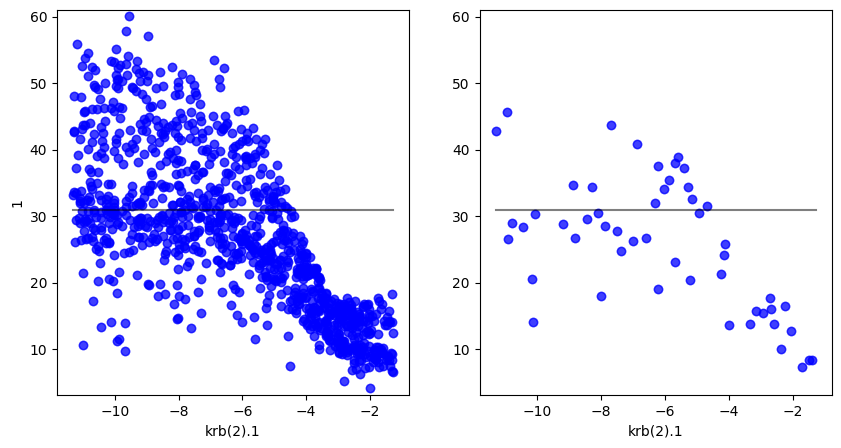

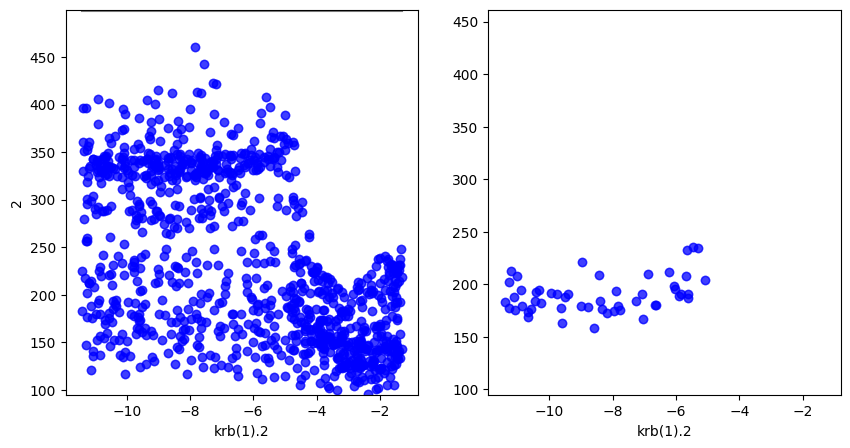

...

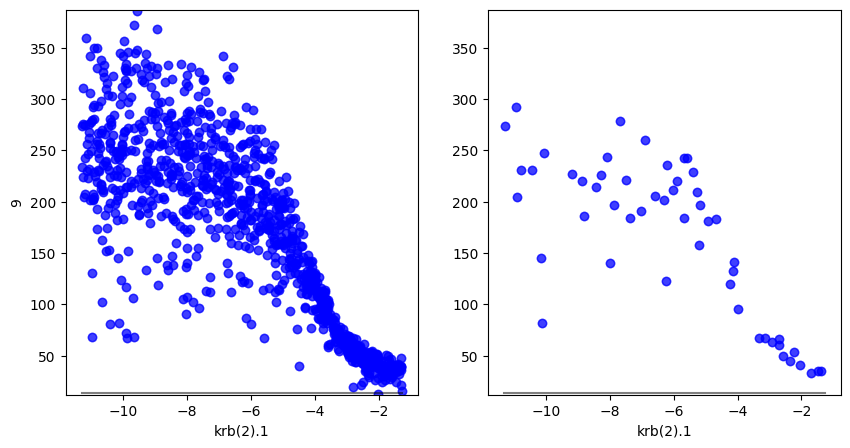

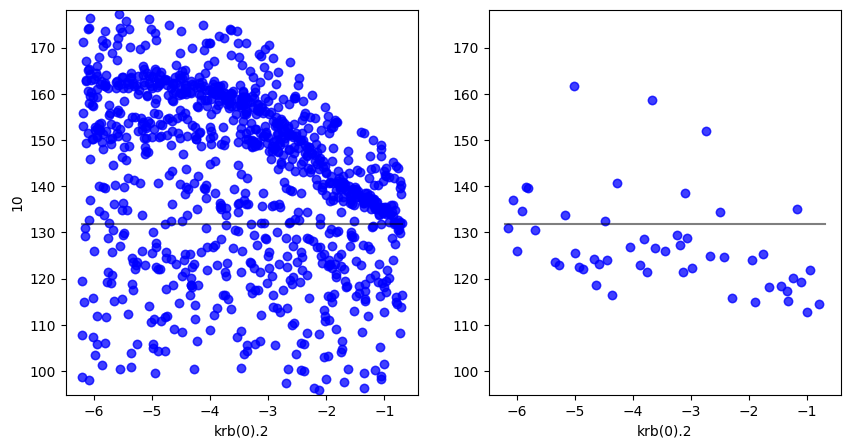

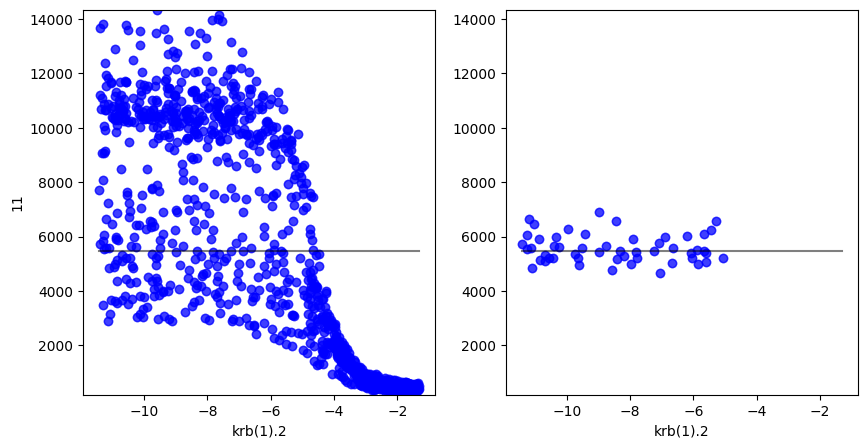

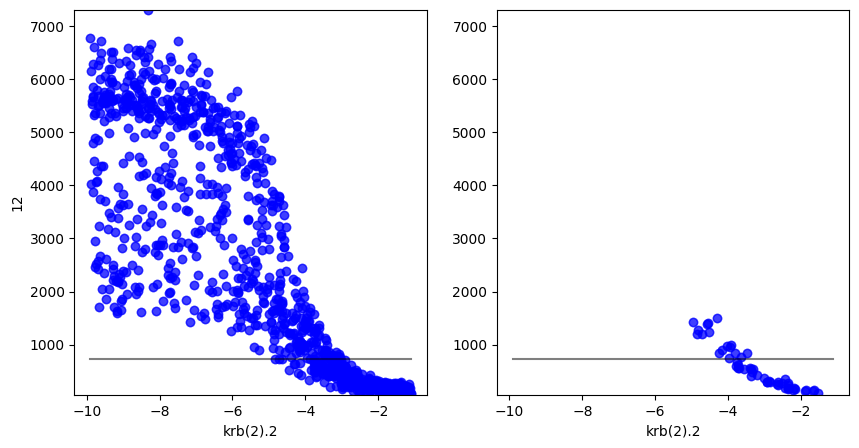

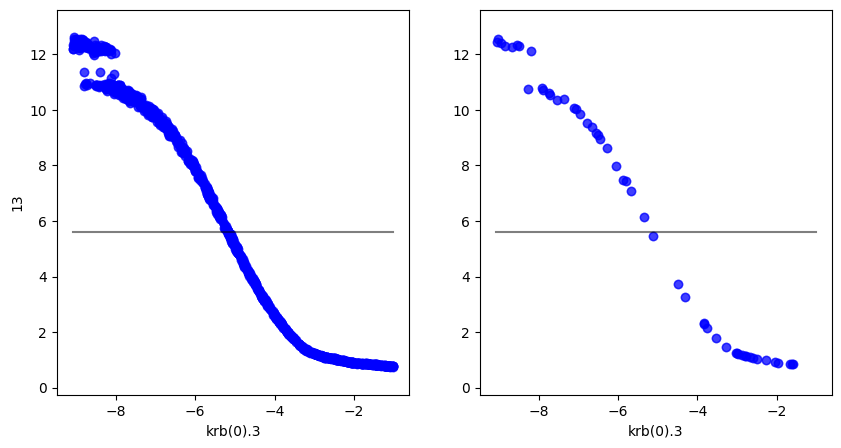

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = -0.30
corr_mask = corr_mp < corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

# SA STEP2 nb1

Based on above SA, using most important param-target relationships. (obs,2,11,12 most dominant)
This time, obs 2 and 12 are corr and 3 and 13 highly corr. (2 and 11 only slight corr)
didn't improve the 11,12 match by much, however match for other targets became worse (targets not in sphaghetti).
Similar corr patterns in matrices, Some improvement in error (more runs r2>.95)

In [ ]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'

params='sample_matrix_STEP2-MD3-CR_nb1.csv'
model='results_STEP2-MD3-CR_nb1.txt'

df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [ ]:
!cat ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP2-MD3-CR_nb1.csv

name,bounds,initial,cmtnum,pftnum
nmax,"[0.6199999999999997, 5.58]",3.1,3,0
nmax,"[0.5, 4.5]",2.5,3,1
nmax,"[3, 6]",7.0,3,2
nmax,"[0.21999999999999997, 1.9800000000000002]",1.1,3,3
krb(0),"[-10, -4]",-6.2,3,0
krb(0),"[-6.210000000000001, -0.69]",-3.45,3,1
krb(0),"[-6.210000000000001, -0.69]",-3.45,3,2
krb(0),"[-7, -3]",-5.05,3,3
krb(1),"[-10, -5]",-5.18,3,0
krb(1),"[-0.8899999999999997, -8.010000000000002]",-4.45,3,1
krb(1),"[-8.010000000000002, -0.8899999999999997]",-6.35,3,2
krb(2),"[11.43, -1.2699999999999996]",-8.2,3,0
krb(2),"[-14.759999999999998, -1.6399999999999997]",-6.3,3,1
krb(2),"[-5, 2]",-5.5,3,2


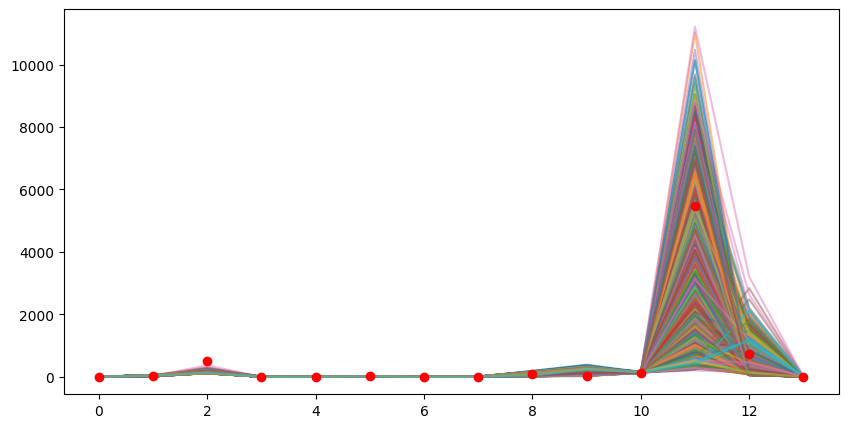

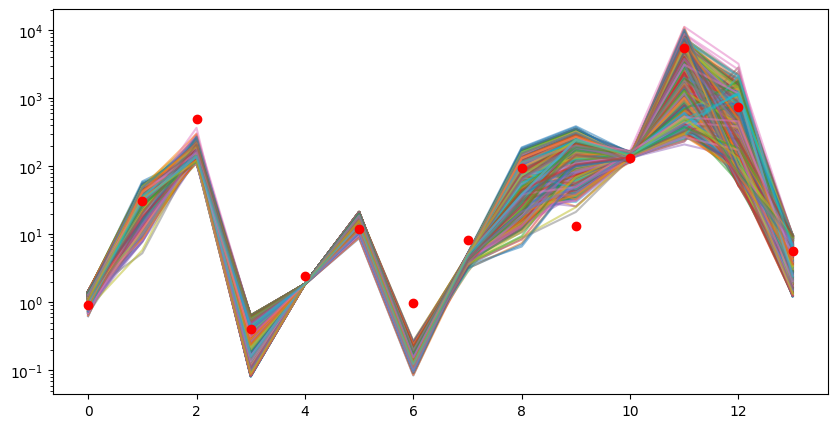

In [ ]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

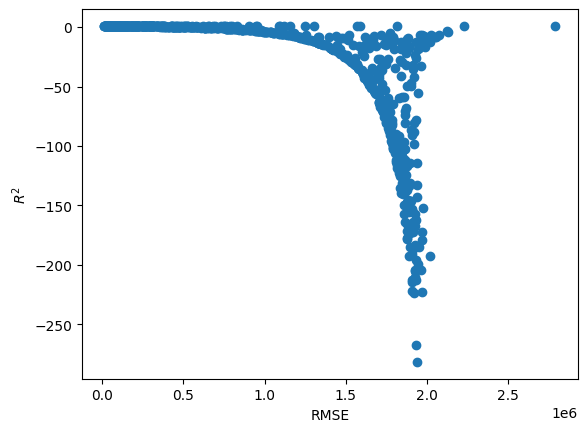

In [ ]:
rmse=ut.plot_r2_rmse(df_model)

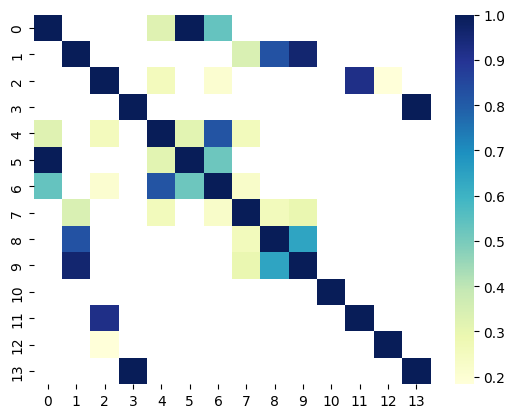

In [ ]:
corr_model=df_model.corr()
high_corr = corr_model[corr_model > 0.1]

sns.heatmap(high_corr, cmap="YlGnBu")
plt.show()

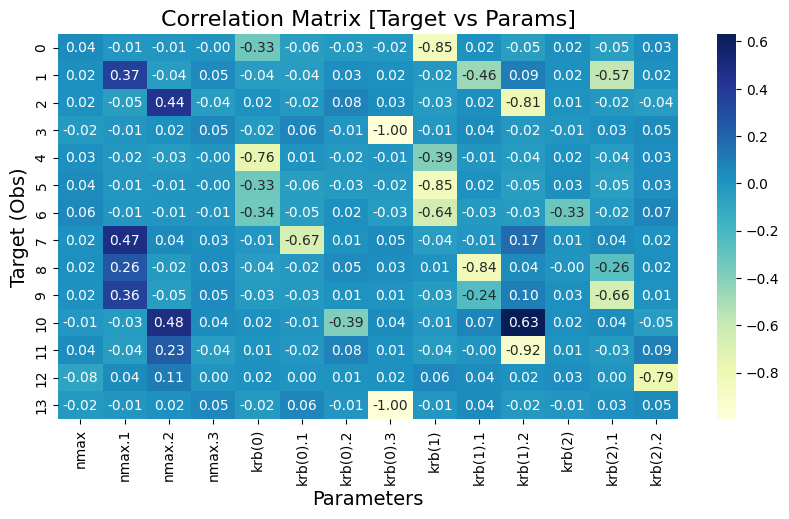

In [ ]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

STEP2-CR:NPP/VEGC model score on training data: 0.9997161157527593
STEP2-CR:NPP/VEGC model score on testing data: 0.9901550909062246


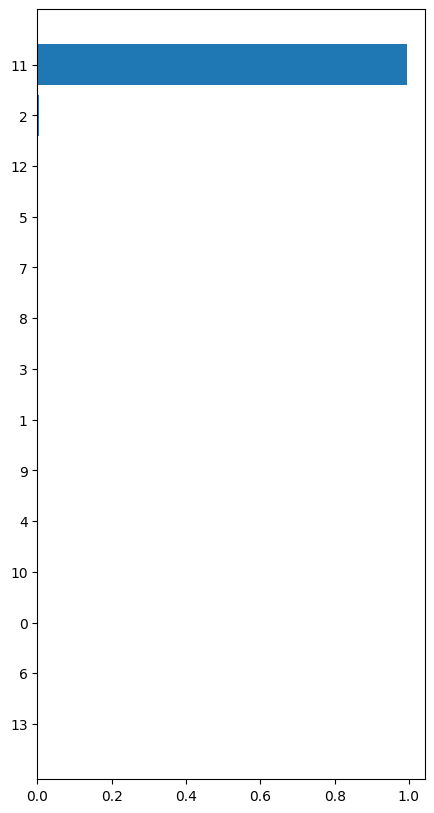

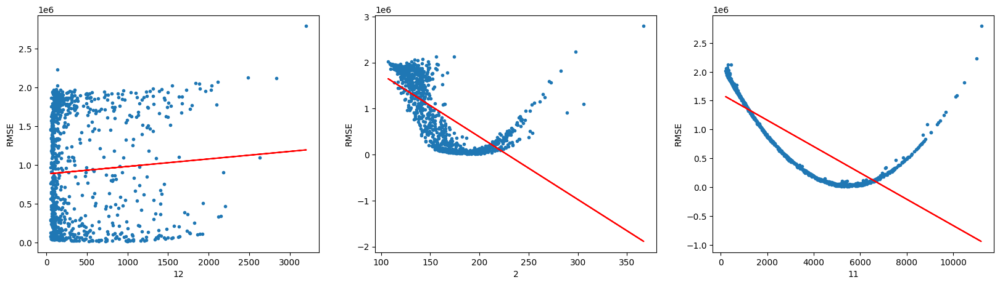

In [ ]:
ut.find_important_features(df_model.iloc[0:-1,:],rmse,1,'STEP2-CR:NPP/VEGC')

STEP2-CR:NPP/VEGC model score on training data: 0.9970319618052879
STEP2-CR:NPP/VEGC model score on testing data: 0.8979678597968952


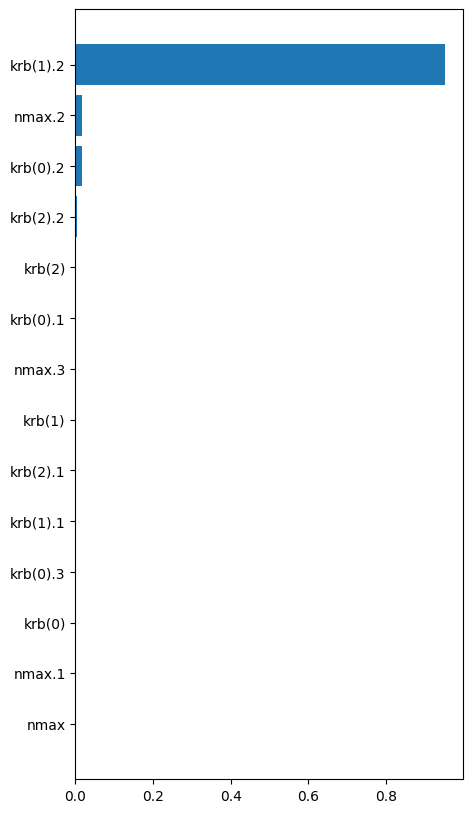

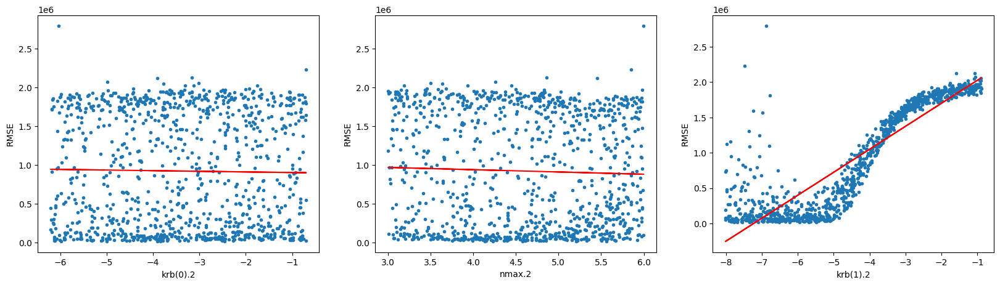

In [ ]:
ut.find_important_features(df_param,rmse,1,'STEP2-CR:NPP/VEGC')

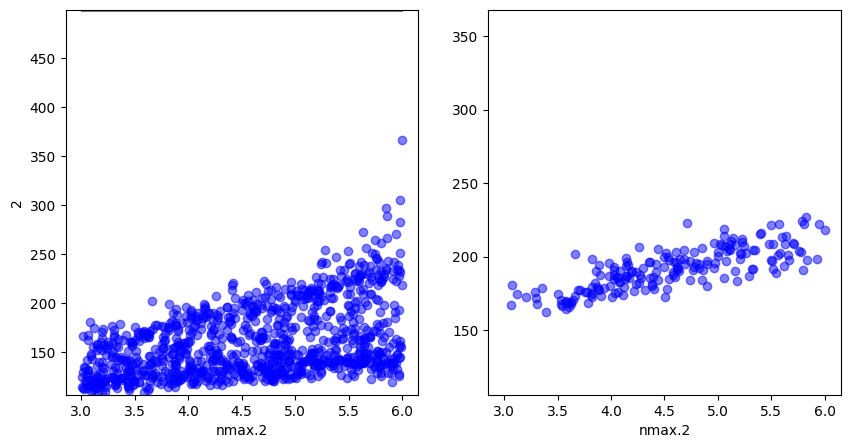

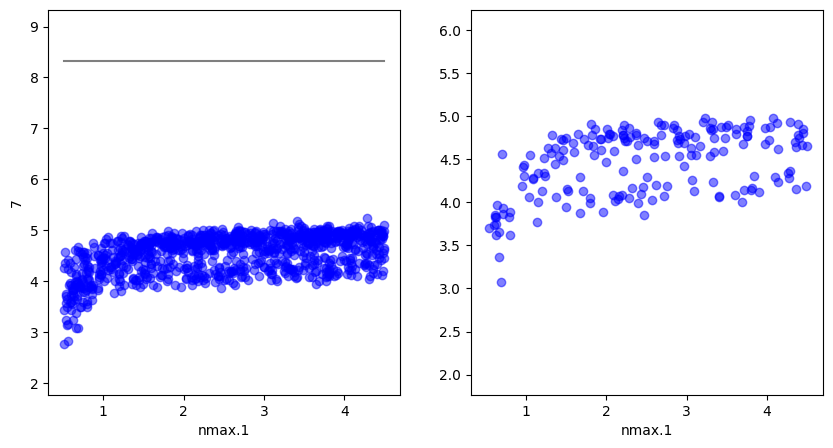

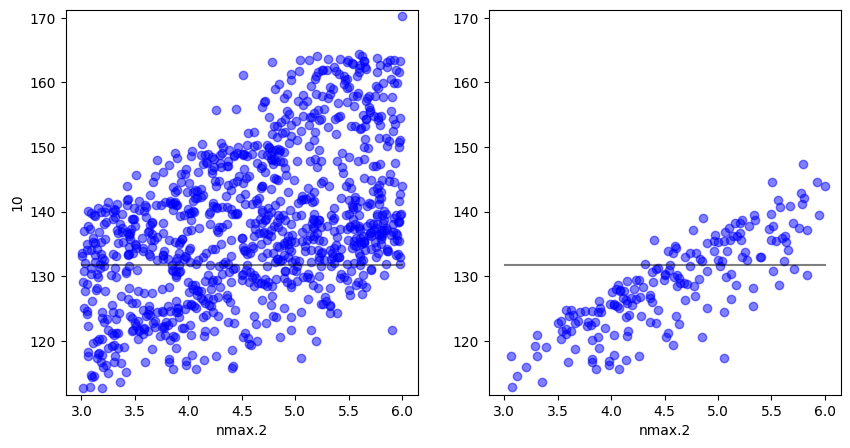

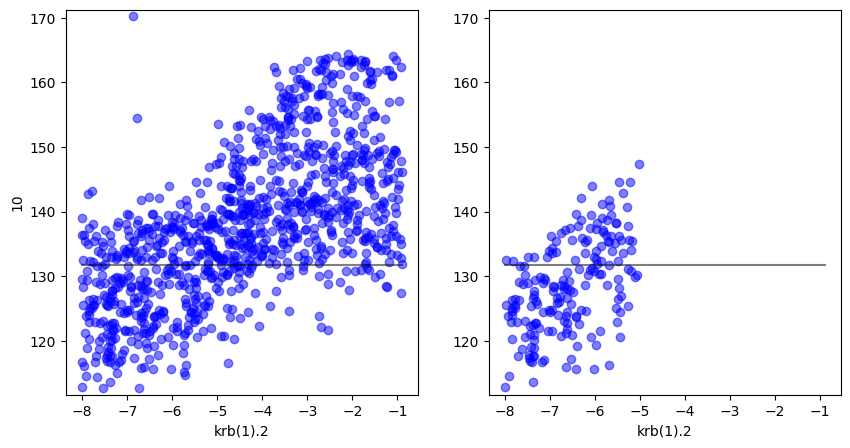

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = 0.40
corr_mask = corr_mp > corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

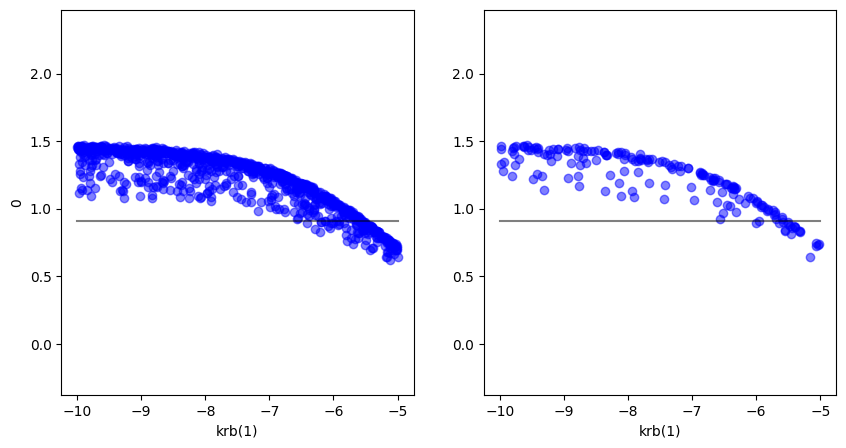

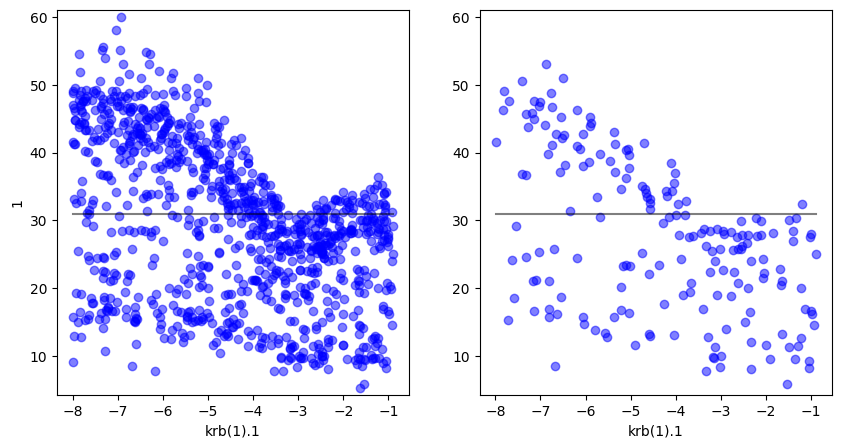

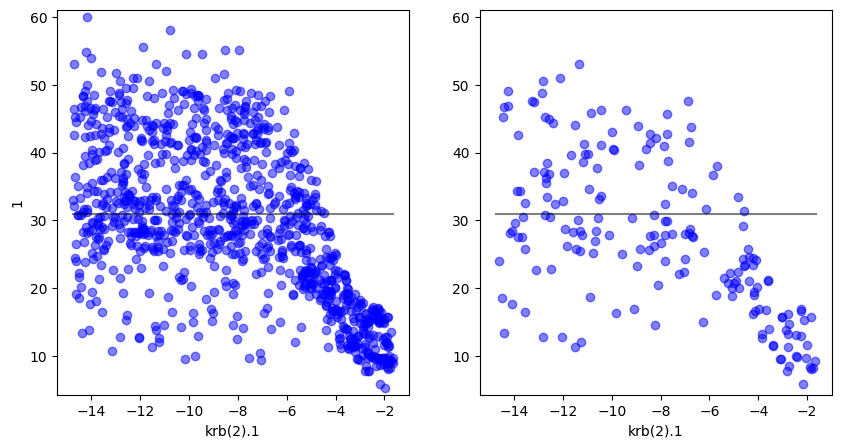

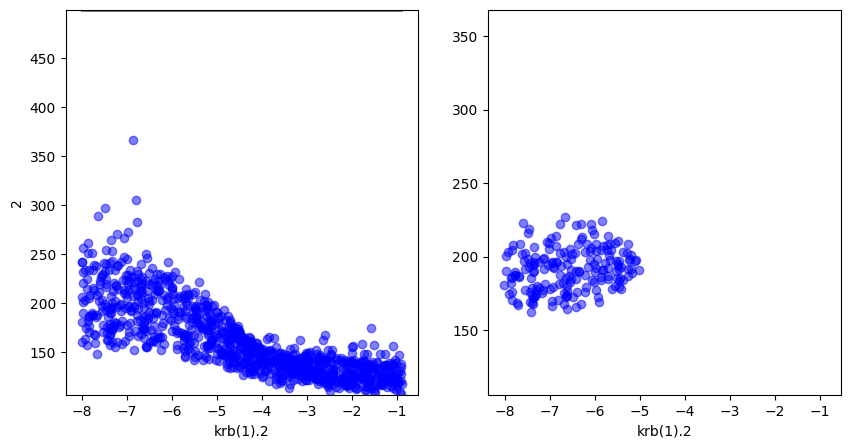

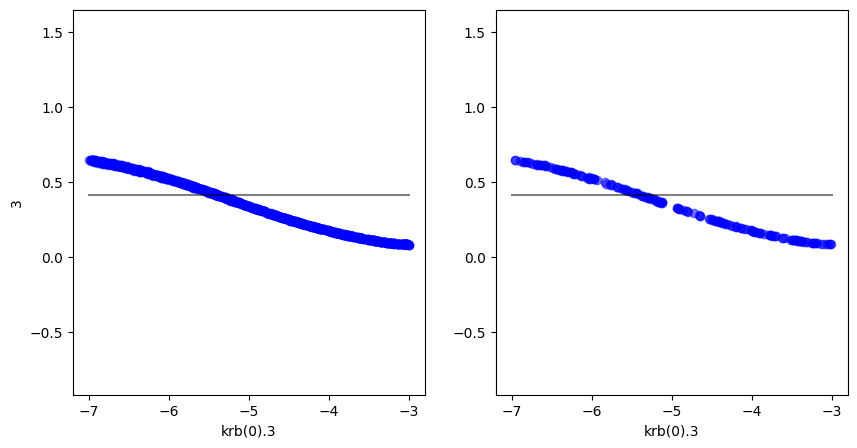

...

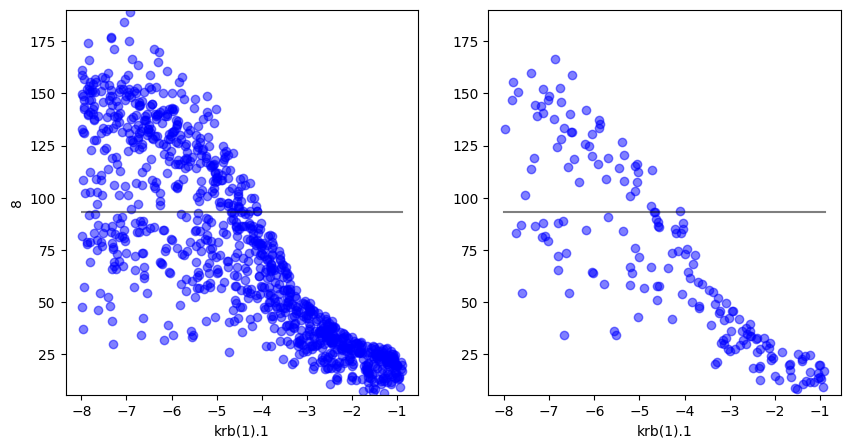

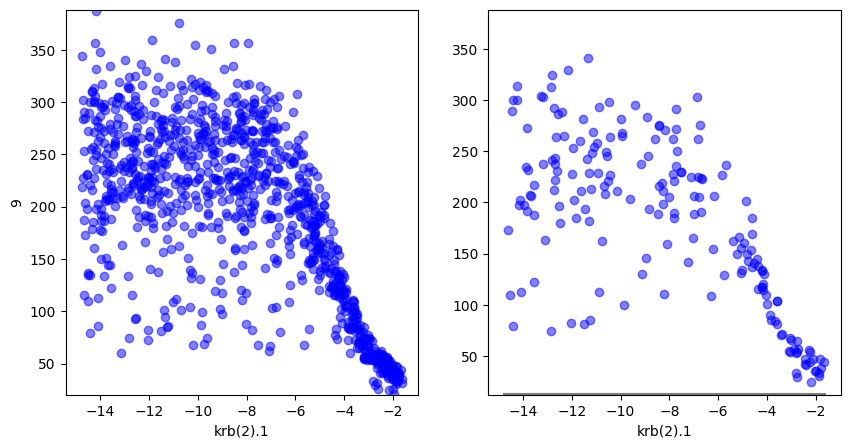

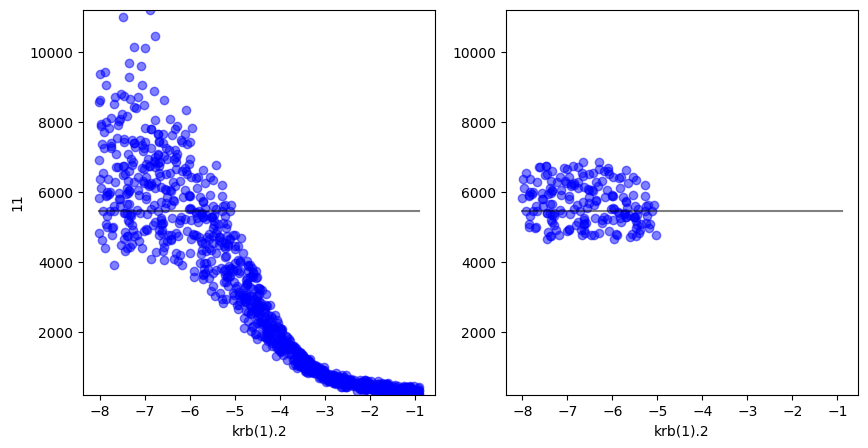

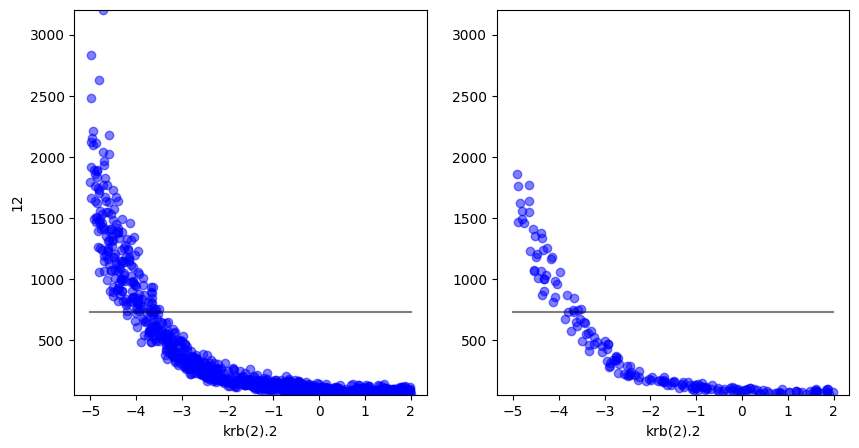

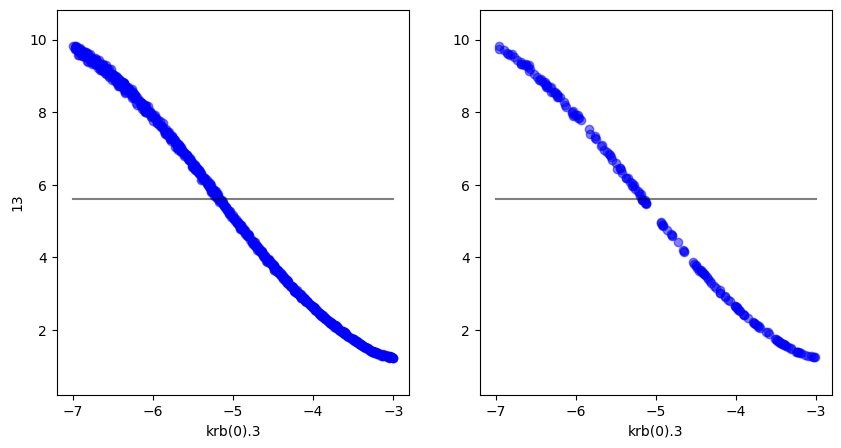

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = -0.40
corr_mask = corr_mp < corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

# SA STEP2 nb2

Does not improve matches to targets (or error) overall
further restricting ranges just limits the number of important params/obs, and significantly clarifies krb(1).2 relationship
Note that Obs 2 and 9 cannot be well matched with a low overall r2, however first pass SA showed 2 to be significant. Do we want to try matching this and sacrifice overall error?

Used row 283 in params to update csv file - it has r2 <.99, looks okay in matchplot (doesn't completely miss anythin other than obs9)

In [ ]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'

params='sample_matrix_STEP2-MD3-CR_nb2.csv'
model='results_STEP2-MD3-CR_nb2.txt'

df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [ ]:
!cat ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP2-MD3-CR_nb2.csv

name,bounds,initial,cmtnum,pftnum
nmax,"[0.6199999999999997, 5.58]",3.1,3,0
nmax,"[0.5, 4.5]",2.5,3,1
nmax,"[3, 6]",7.0,3,2
nmax,"[0.21999999999999997, 1.9800000000000002]",1.1,3,3
krb(0),"[-10, -4]",-6.2,3,0
krb(0),"[-6.210000000000001, -0.69]",-3.45,3,1
krb(0),"[-6.210000000000001, -0.69]",-3.45,3,2
krb(0),"[-7, -3]",-5.05,3,3
krb(1),"[-10, -5]",-5.18,3,0
krb(1),"[-0.8899999999999997, -8.010000000000002]",-4.45,3,1
krb(1),"[-8.010000000000002, -0.8899999999999997]",-6.35,3,2
krb(2),"[11.43, -1.2699999999999996]",-8.2,3,0
krb(2),"[-14.759999999999998, -1.6399999999999997]",-6.3,3,1
krb(2),"[-5, 2]",-5.5,3,2


In [ ]:
xparams, ymodel = ut.get_params(df_param,df_model,r2lim=0.99)
# xparams.std()

In [ ]:
xparams

,nmax,nmax.1,nmax.2,nmax.3,krb(0),krb(0).1,krb(0).2,krb(0).3,krb(1),krb(1).1,krb(1).2,krb(2),krb(2).1,krb(2).2
56,2.825244,3.599399,5.219465,1.167132,-9.476036,-1.098031,-3.695074,-5.546665,-6.852163,-5.687726,-6.509902,0.800877,-10.956025,-3.693213
135,0.805264,2.501058,5.563269,1.254835,-8.338777,-4.014800,-2.454934,-3.436752,-9.794668,-1.399356,-5.695633,8.473698,-11.284107,-3.451110
170,0.983228,2.899472,4.579496,1.128570,-4.761044,-5.075428,-5.984932,-4.310914,-8.274213,-1.015240,-6.220217,7.501550,-6.667080,-3.791899
283,2.771688,1.935882,4.617267,1.622320,-4.945415,-3.995210,-3.837251,-6.407289,-9.762262,-5.455451,-7.551204,2.110357,-7.687137,-3.609919
293,1.303416,0.666899,4.138879,1.316060,-9.328961,-4.480430,-3.903961,-6.362160,-7.469631,-1.496724,-7.678788,4.828091,-11.507592,-4.332383
352,0.762084,2.967399,4.234309,1.842429,-7.002626,-2.296457,-5.001846,-3.956106,-6.395223,-7.327062,-7.769190,5.746741,-5.849481,-4.333853
643,2.015141,2.564021,5.205041,0.386592,-8.219820,-1.095050,-3.841239,-3.244521,-5.042997,-4.639818,-5.959127,1.387135,-12.669843,-3.235672
832,4.850448,2.426889,4.359988,1.601493,-9.441157,-1.338638,-2.506834,-3.498954,-5.027612,-4.578192,-7.345973,9.315147,-10.514129,-4.275129


<Axes: xlabel='Parameters', ylabel='Targets'>

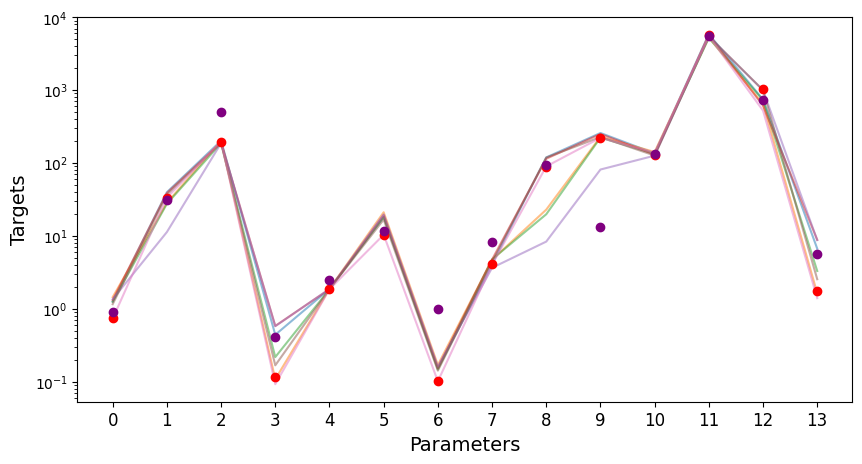

In [ ]:
ut.spaghetti_match_plot(xparams,ymodel.iloc[:,:],logy=True)
df_model.iloc[-1,:].plot(logy=True, style="o", color='purple')

In [ ]:
ymodel

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
56,1.256297,39.719095,202.060698,0.440150,1.868130,18.249168,0.152158,4.085801,119.306327,258.125452,135.597285,5848.270459,740.764026,6.679622
135,1.446285,28.445887,201.189348,0.107998,1.873215,21.107723,0.169449,4.714079,22.929118,228.957921,141.828508,5294.467188,642.226837,1.636415
170,1.251169,27.571655,187.306785,0.217610,1.852991,18.179850,0.146947,4.766948,19.812908,222.985205,133.660153,5203.950830,729.763342,3.301371
283,1.320223,38.691746,191.573576,0.581513,1.857479,19.214981,0.154299,4.734827,114.519545,250.375044,130.167485,5793.421338,611.257635,8.823417
293,1.354373,11.290963,187.146835,0.577118,1.870812,19.721335,0.161109,3.651871,8.354334,81.406624,126.250421,5447.186182,994.347998,8.756729
352,1.156606,36.677976,189.515492,0.167726,1.863847,16.751204,0.141817,4.417081,118.867014,227.172685,126.546479,5451.061523,1000.834937,2.544447
643,0.733162,33.383698,198.125052,0.092289,1.858338,10.379707,0.101344,4.029503,89.817310,222.203214,138.304094,5514.910352,523.135358,1.398249
832,0.736488,33.141281,196.333654,0.115363,1.858609,10.427063,0.102101,4.097658,88.243822,220.863718,127.117658,5651.950098,1033.928210,1.748487


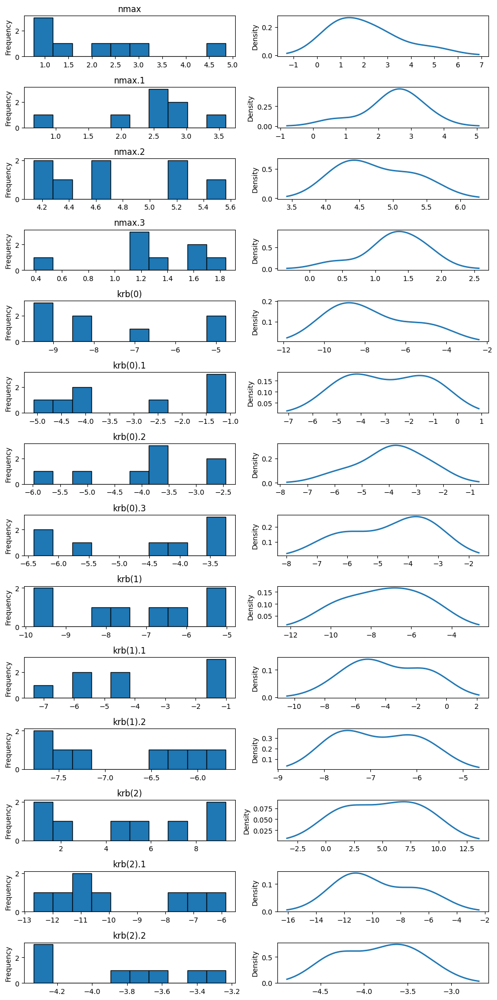

In [ ]:
ut.plot_hist_dist(xparams)

In [ ]:
xparams.min()

nmax         0.649764
nmax.1       0.538093
nmax.2       3.077196
nmax.3       0.256673
krb(0)      -9.931760
krb(0).1    -6.200878
krb(0).2    -6.134904
krb(0).3    -6.961219
krb(1)      -9.986645
krb(1).1    -7.982340
krb(1).2    -8.009109
krb(2)      -1.142003
krb(2).1   -14.612545
krb(2).2    -4.884948
dtype: float64

In [ ]:
xparams.max()

nmax         5.493784
nmax.1       4.492520
nmax.2       5.923598
nmax.3       1.961265
krb(0)      -4.093712
krb(0).1    -0.719310
krb(0).2    -0.697430
krb(0).3    -3.012756
krb(1)      -5.027612
krb(1).1    -0.899397
krb(1).2    -5.075328
krb(2)      11.186026
krb(2).1    -1.772208
krb(2).2     1.981237
dtype: float64

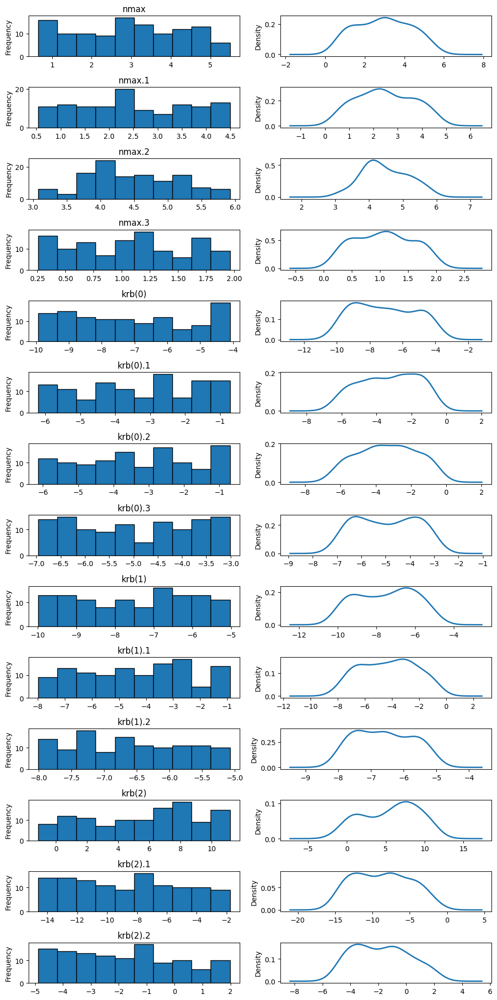

In [ ]:
ut.plot_hist_dist(xparams)

In [ ]:
len(xparams)

117

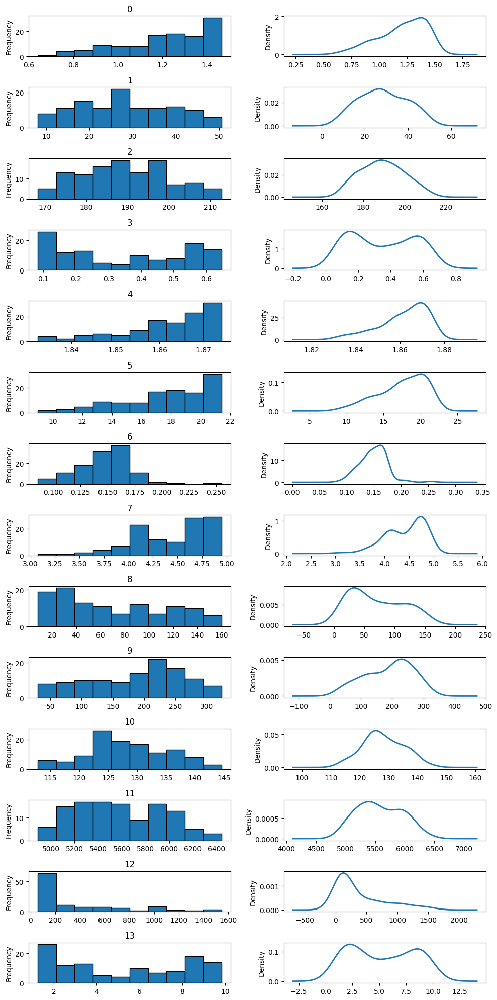

In [ ]:
ut.plot_hist_dist(ymodel)

<Axes: xlabel='Parameters', ylabel='Targets'>

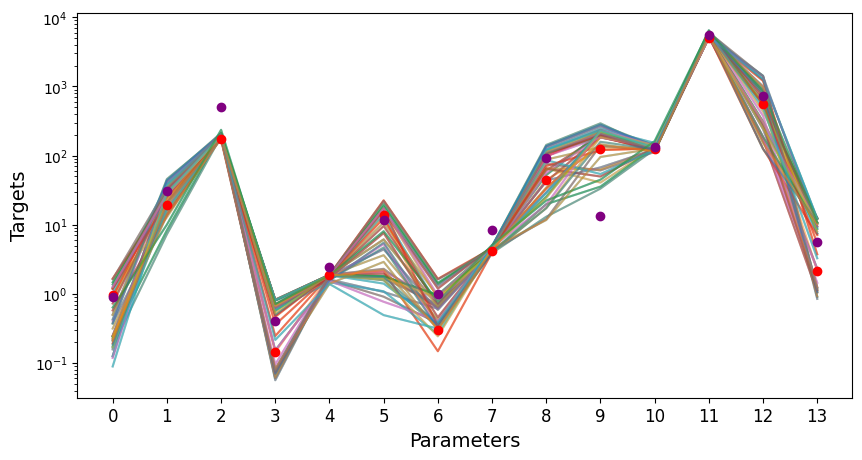

In [ ]:
ut.spaghetti_match_plot(xparams,ymodel,logy=True)
df_model.iloc[-1,:].plot(logy=True, style="o", color='purple')

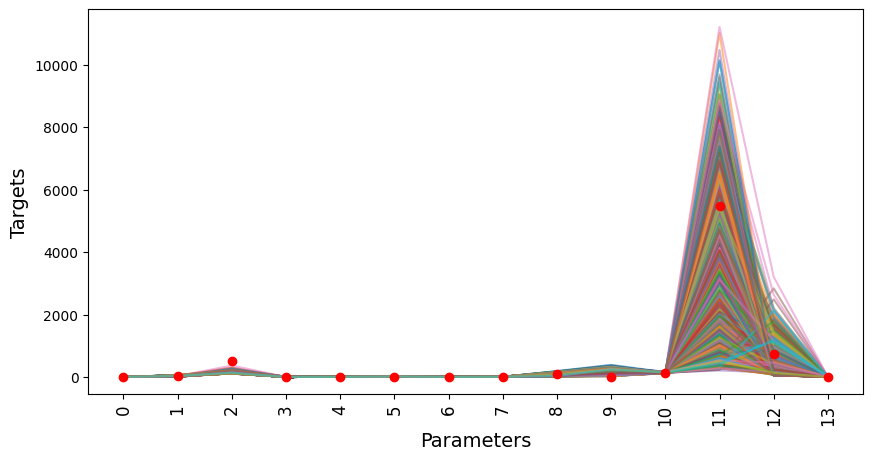

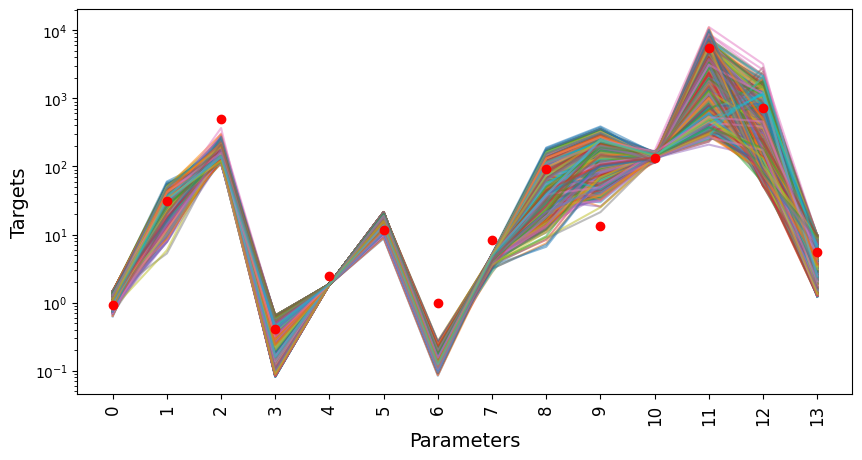

In [ ]:
ut.spaghetti_match_plot(df_param,df_model)
ut.spaghetti_match_plot(df_param,df_model,logy=True)

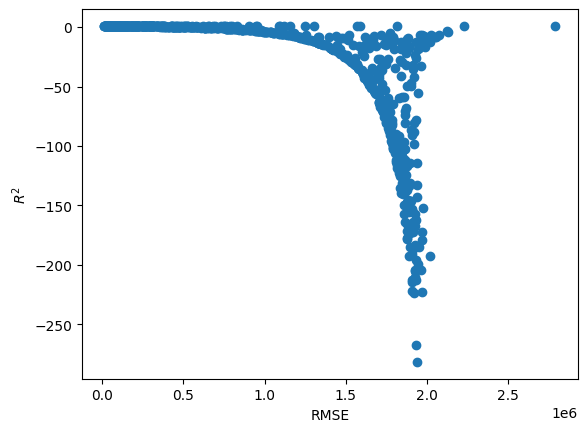

In [ ]:
rmse=ut.plot_r2_rmse(df_model)

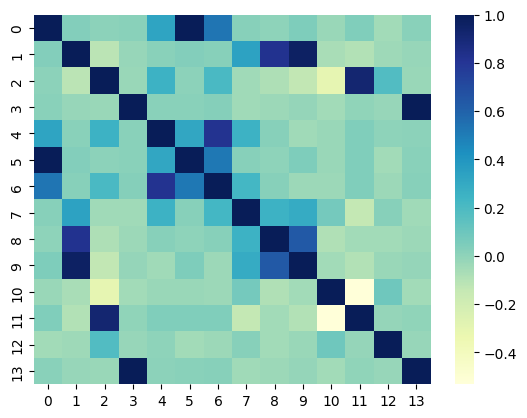

In [ ]:
corr_model=df_model.corr()
high_corr = corr_model[corr_model > 0.1]

sns.heatmap(corr_model, cmap="YlGnBu")
plt.show()

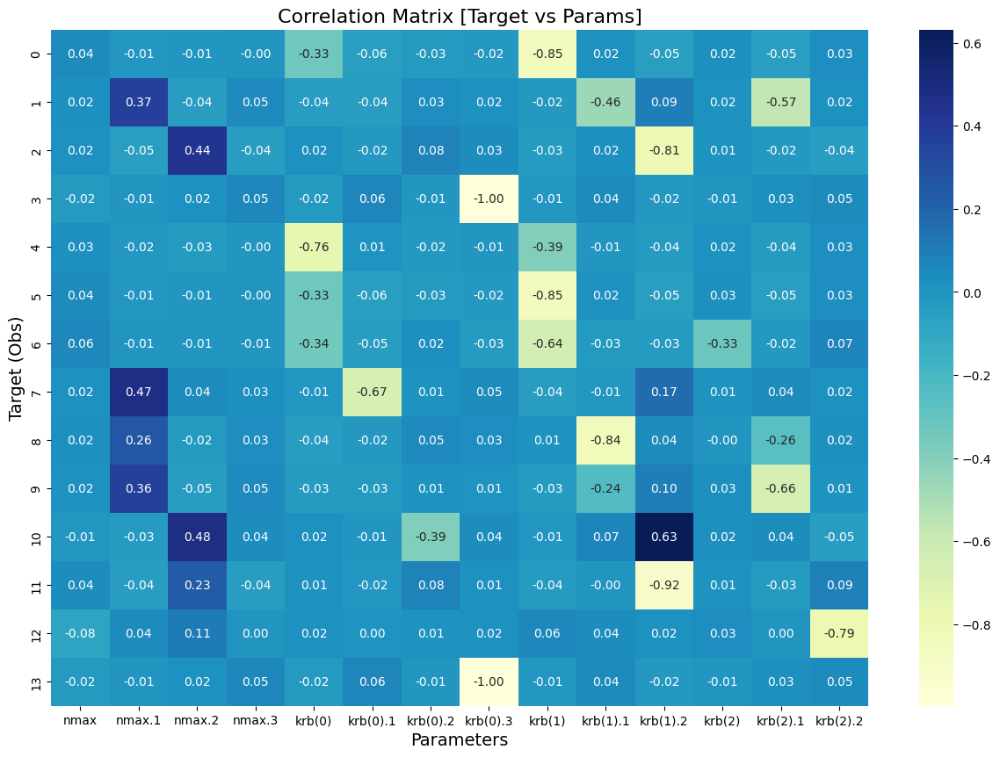

In [ ]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

STEP2-CR:NPP/VEGC model score on training data: 0.9996768328172881
STEP2-CR:NPP/VEGC model score on testing data: 0.9903566404317681


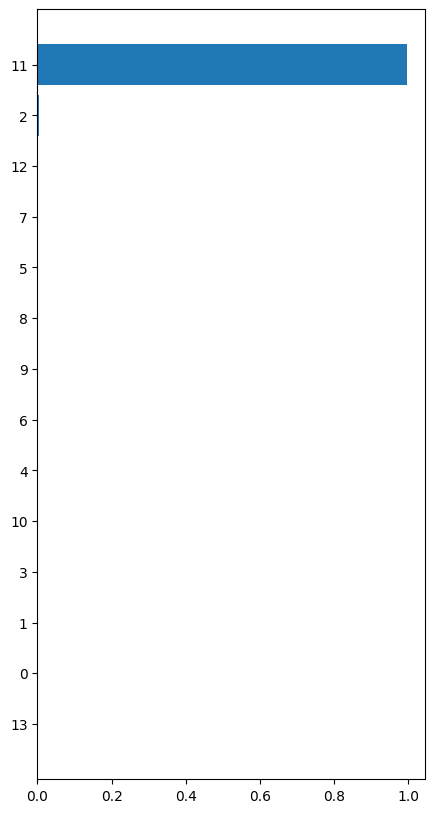

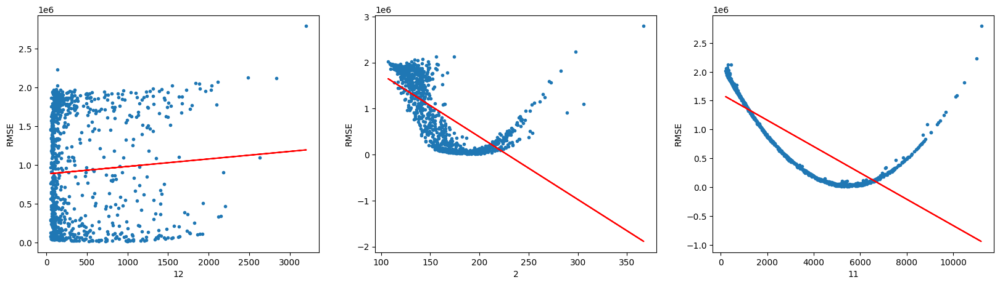

In [ ]:
ut.find_important_features(df_model.iloc[0:-1,:],rmse,1,'STEP2-CR:NPP/VEGC')

STEP2-CR:NPP/VEGC model score on training data: 0.99711894845775
STEP2-CR:NPP/VEGC model score on testing data: 0.8974998933005469


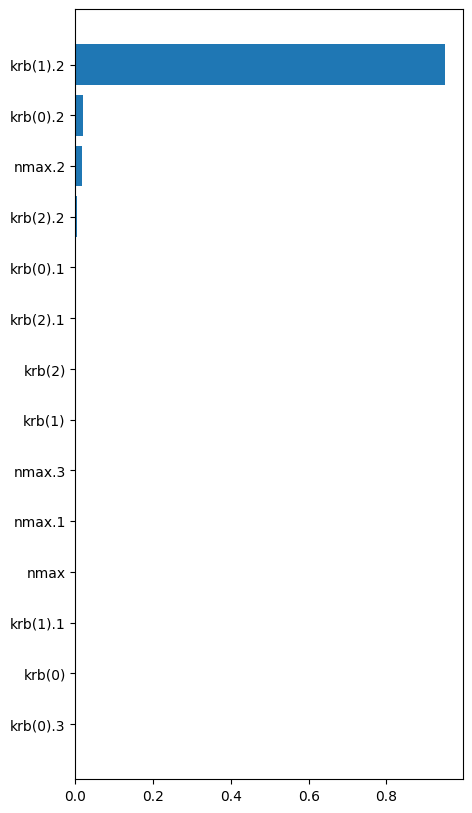

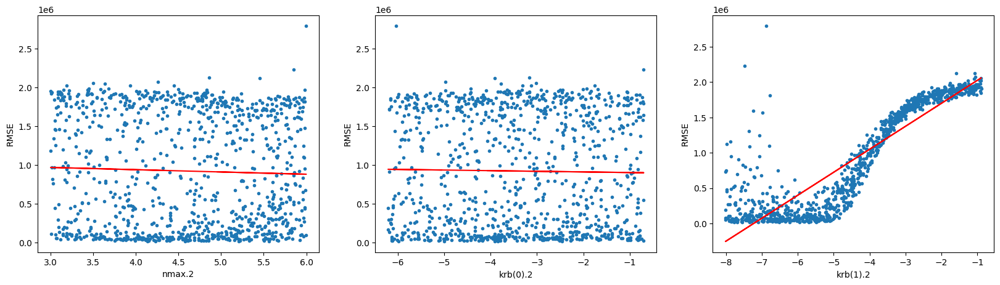

In [ ]:
ut.find_important_features(df_param,rmse,1,'STEP2-CR:NPP/VEGC')

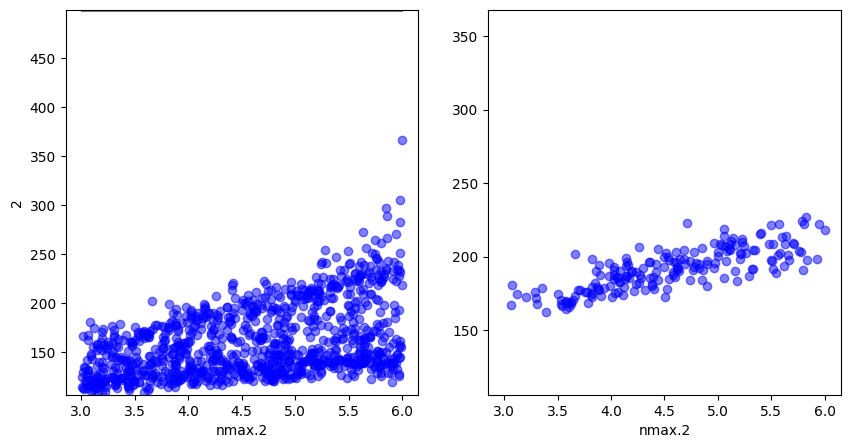

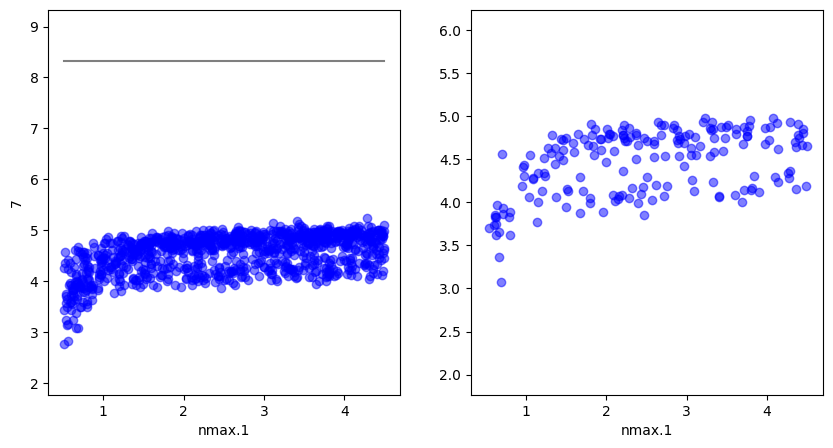

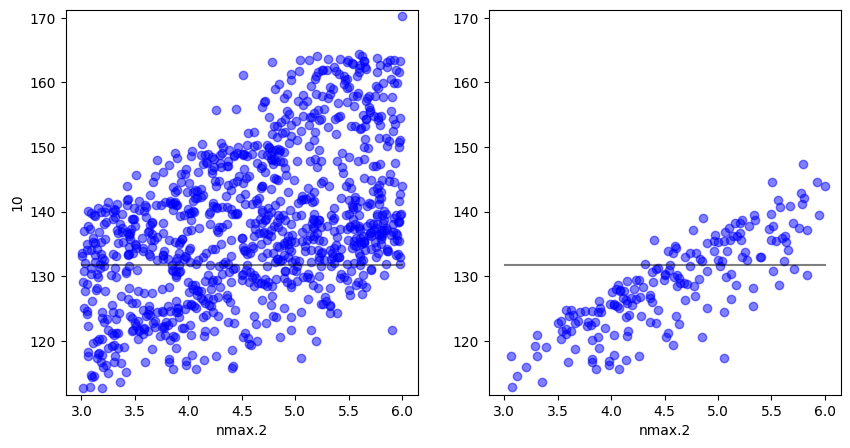

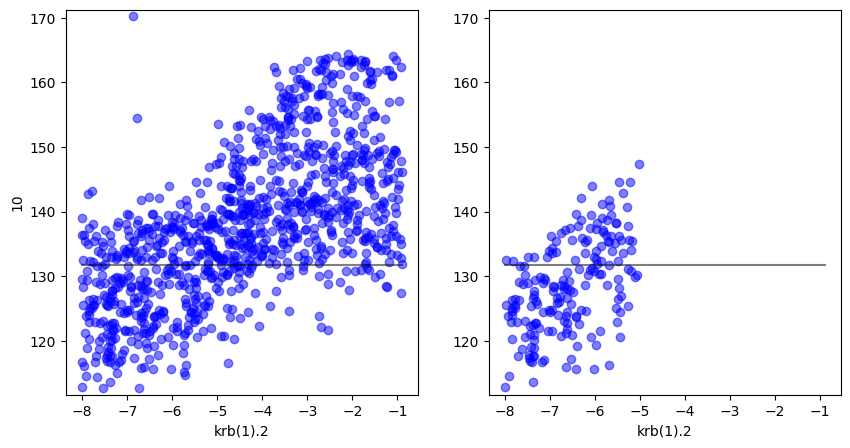

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = 0.40
corr_mask = corr_mp > corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

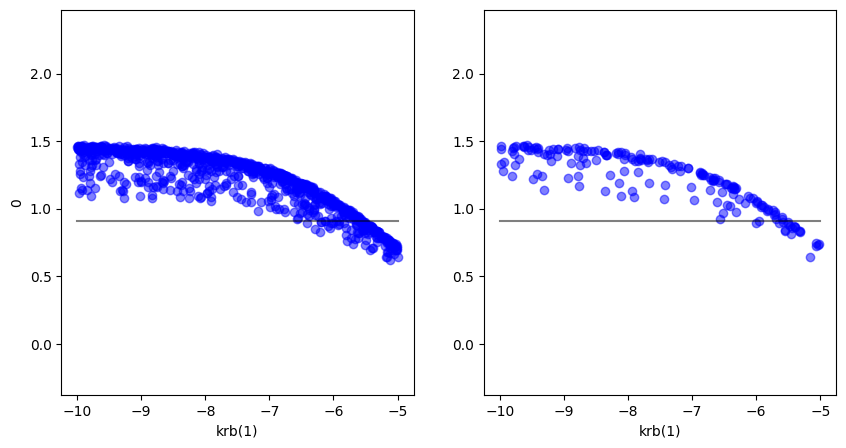

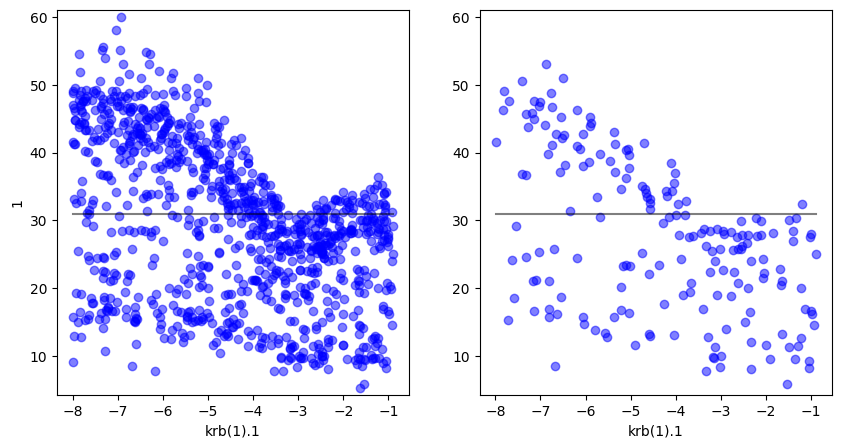

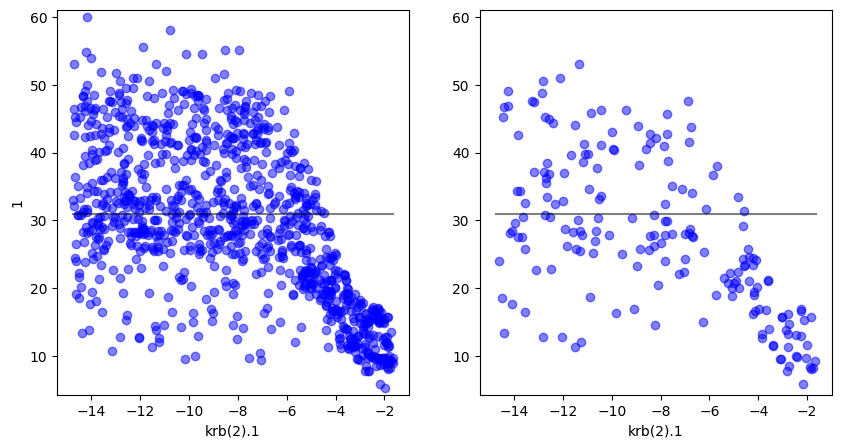

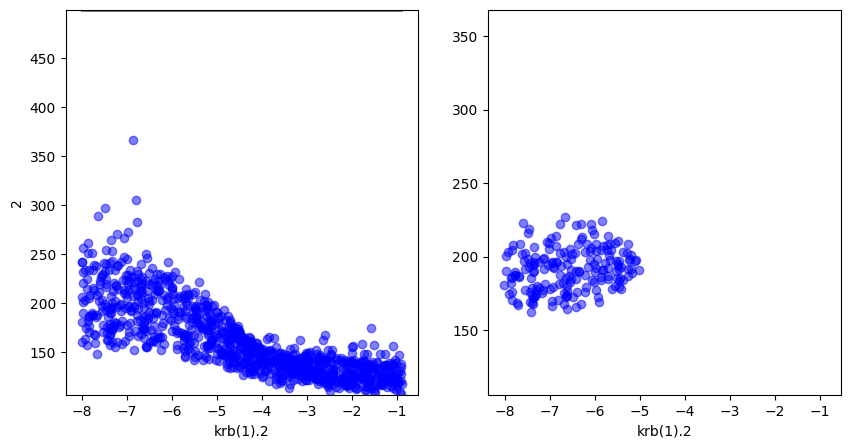

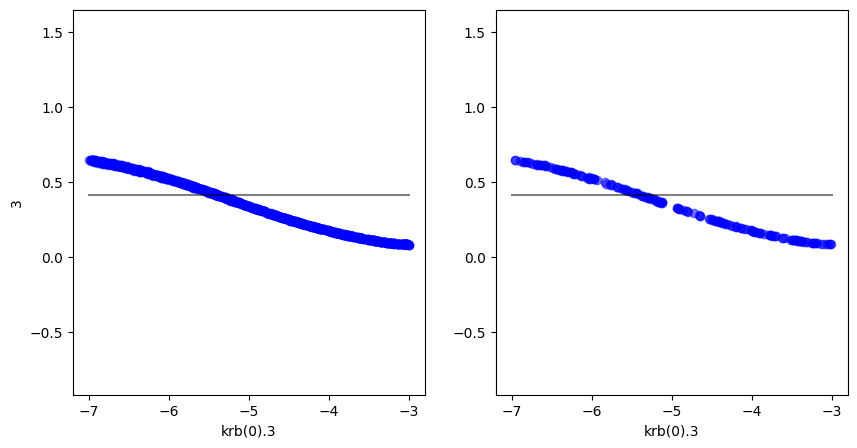

...

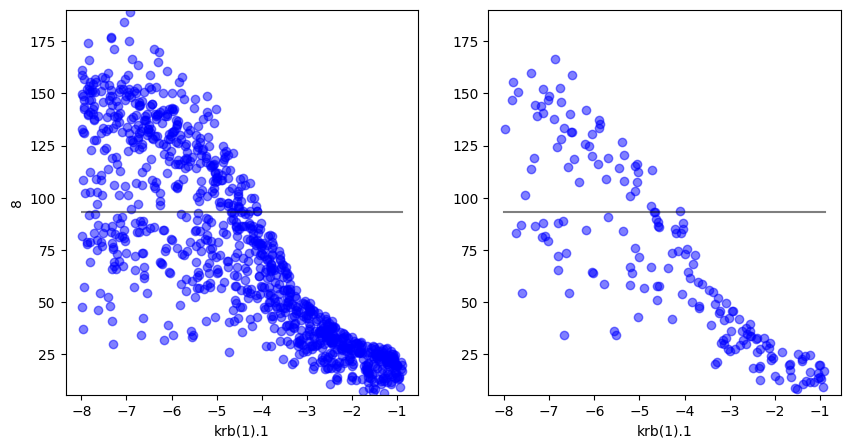

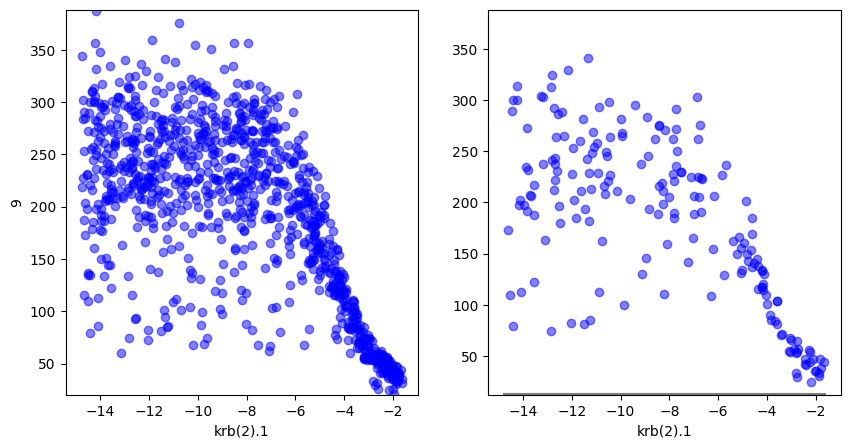

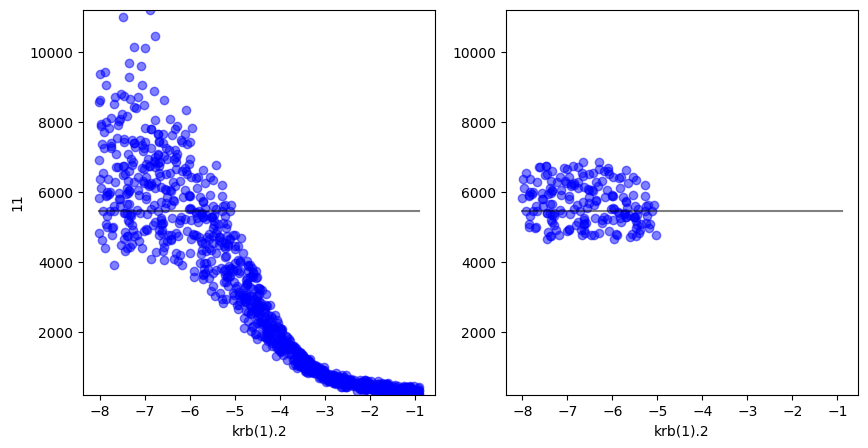

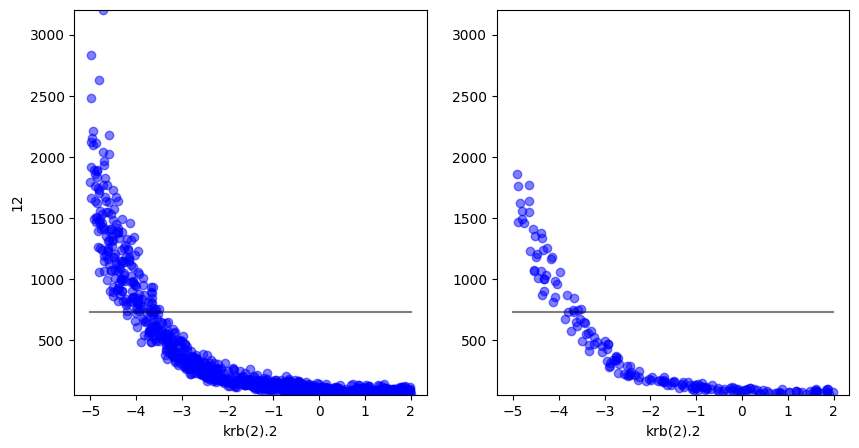

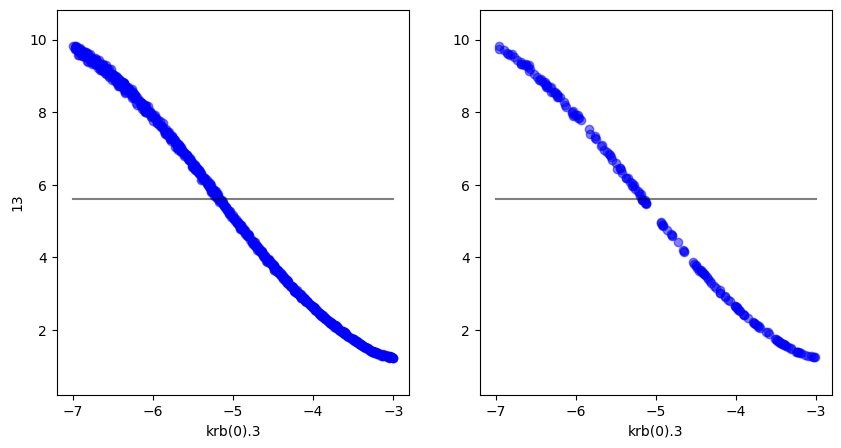

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = -0.40
corr_mask = corr_mp < corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

# SA STEP2 prior guided (AC3) test

In [ ]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
params='sample_matrix_AC3-STEP2-MD3-CR.csv'
model='results_AC3-STEP2-MD3-CR.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

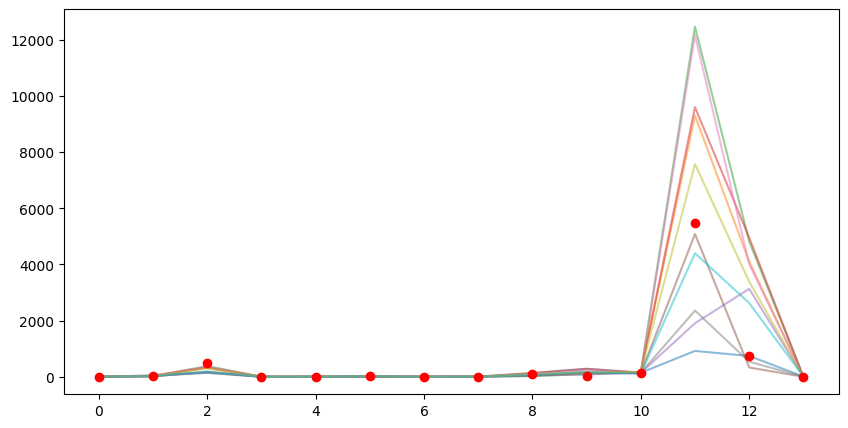

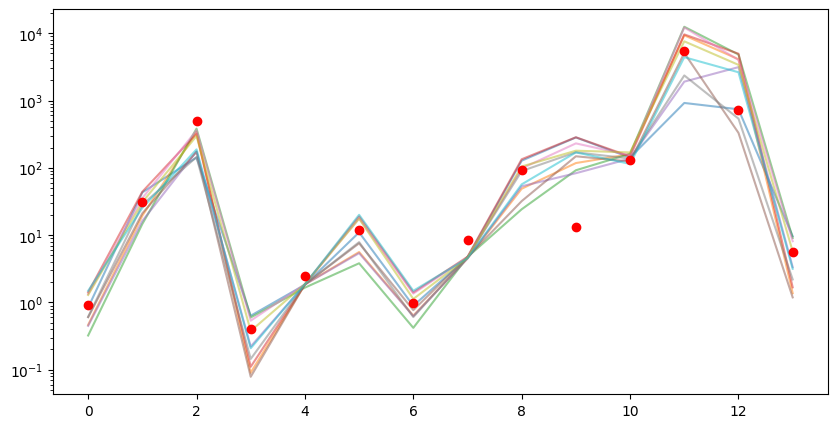

In [ ]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

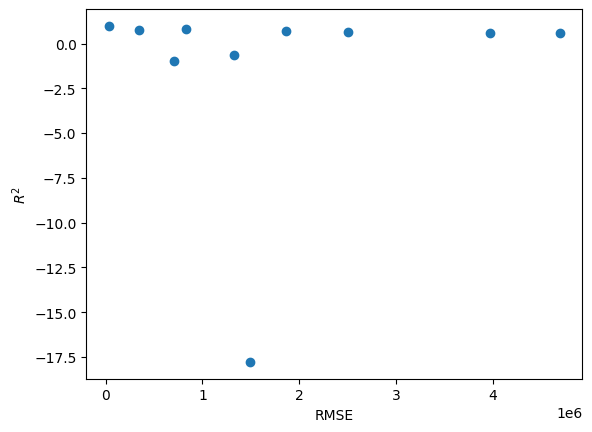

In [ ]:
ut.plot_r2_rmse(df_model)

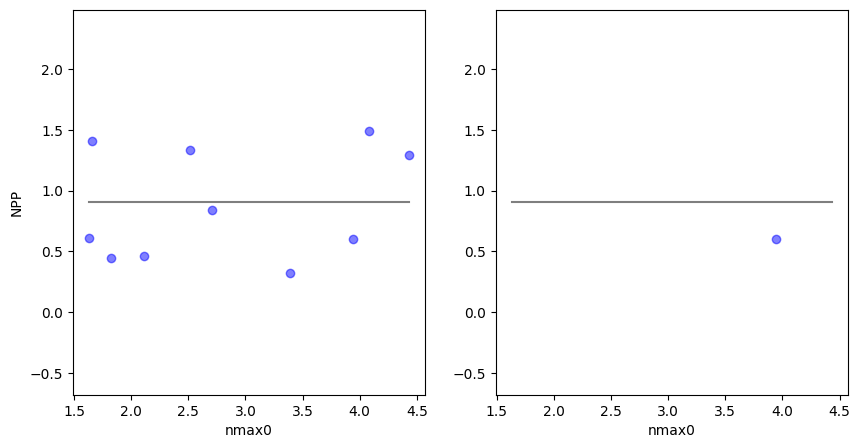

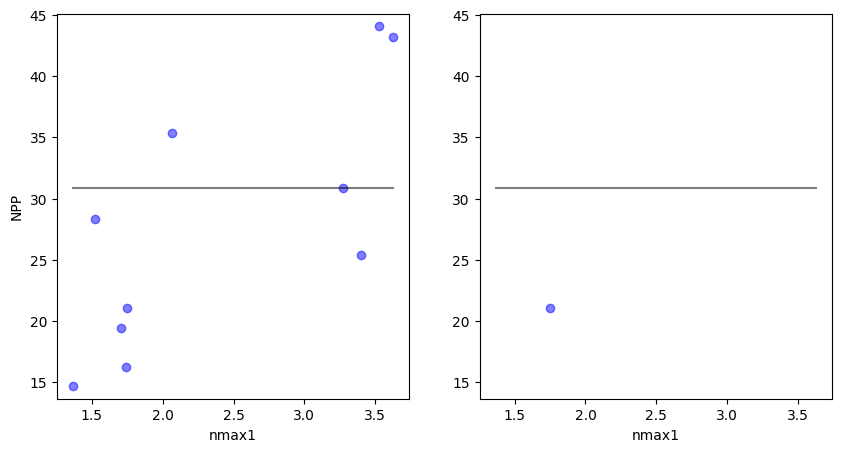

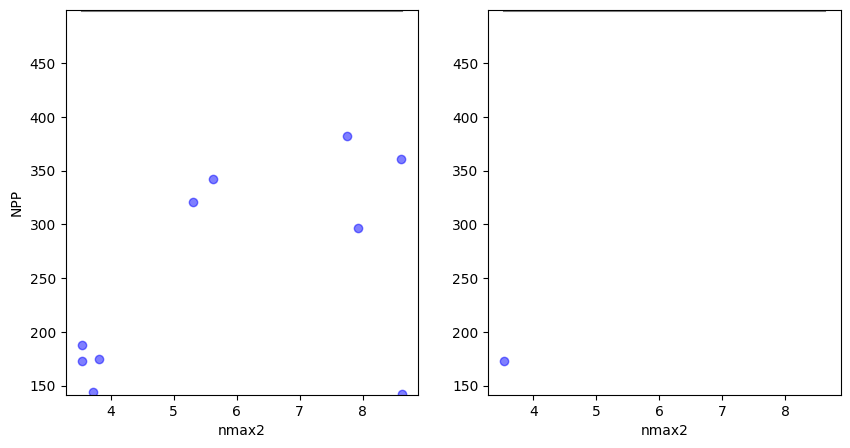

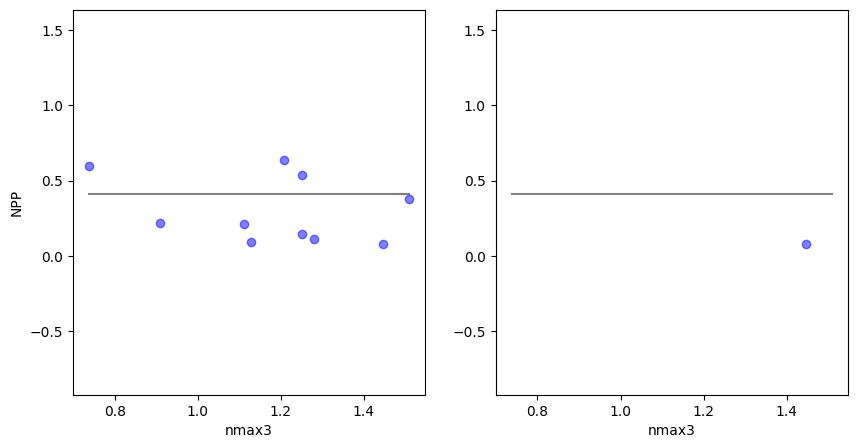

In [ ]:
for i in range(4):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='nmax'+str(i),ylabel='NPP')

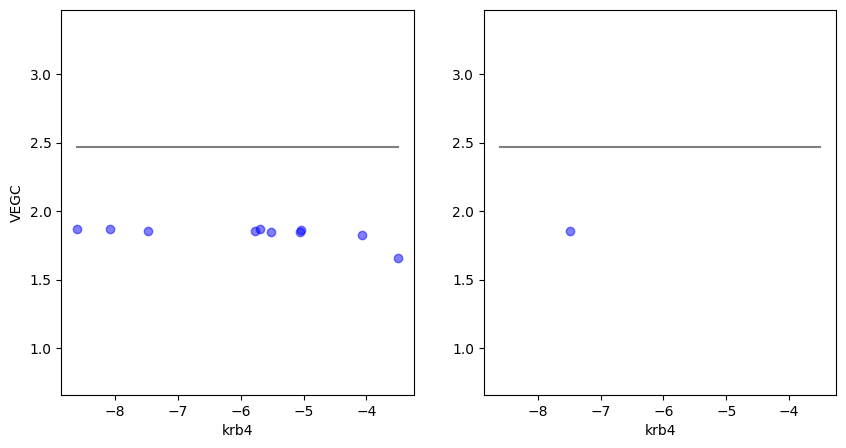

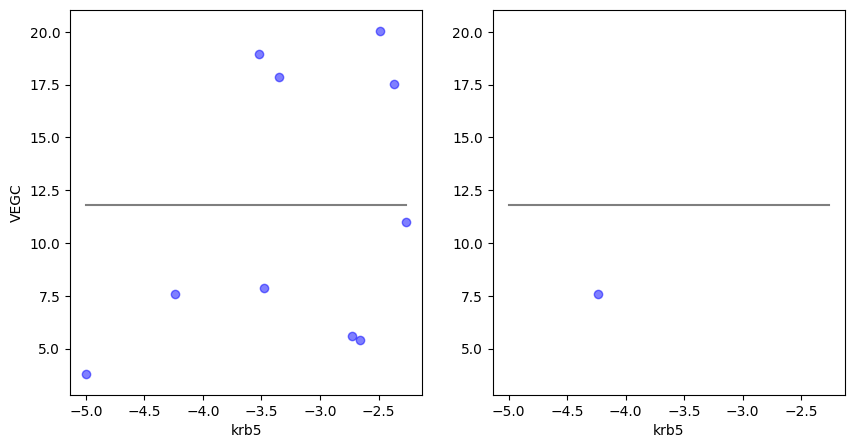

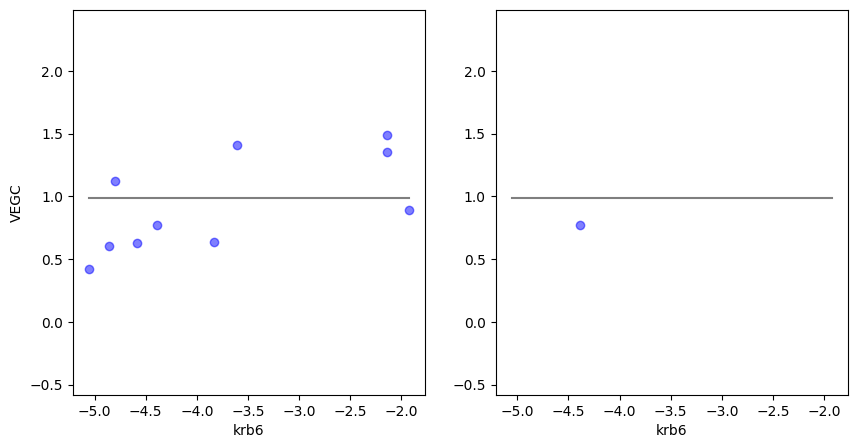

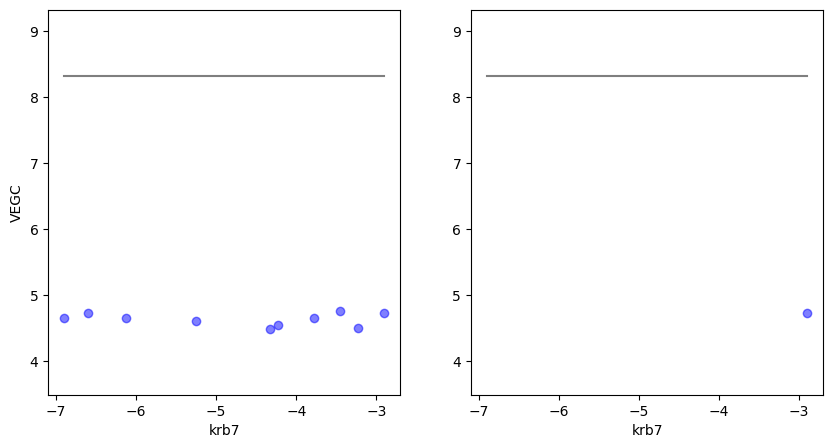

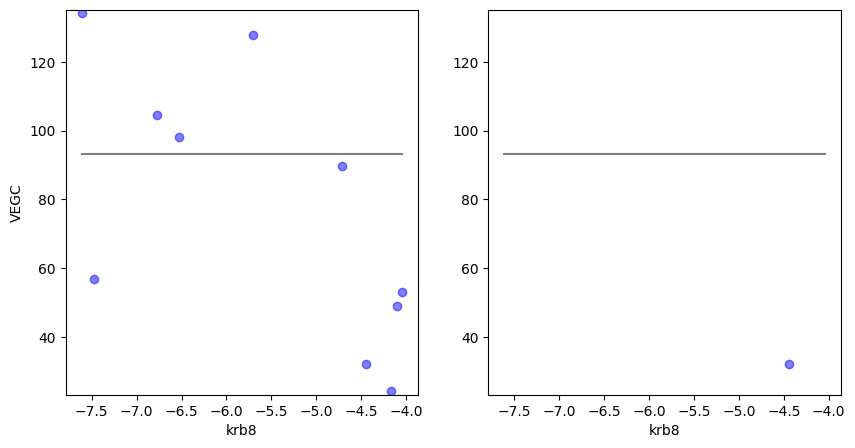

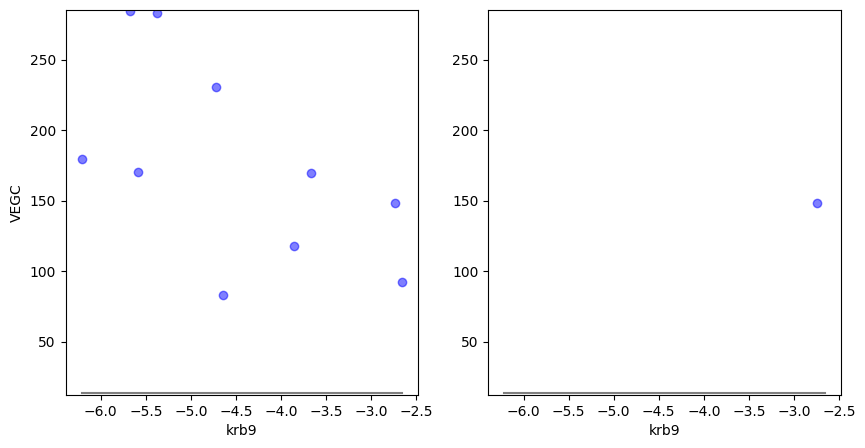

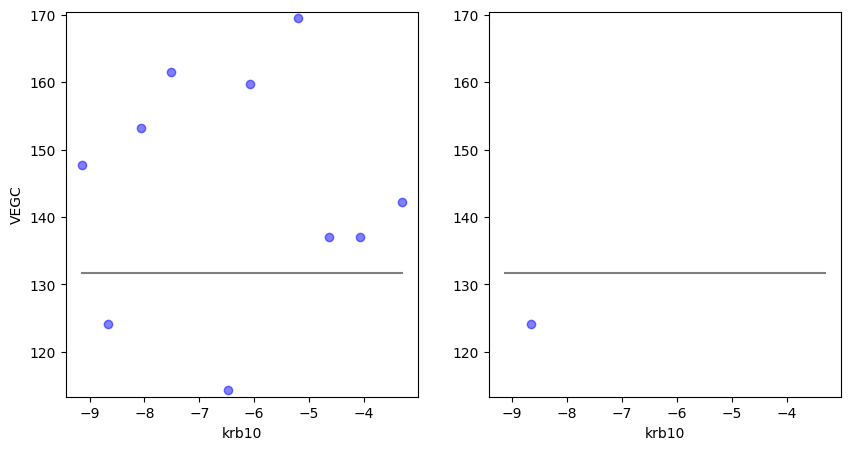

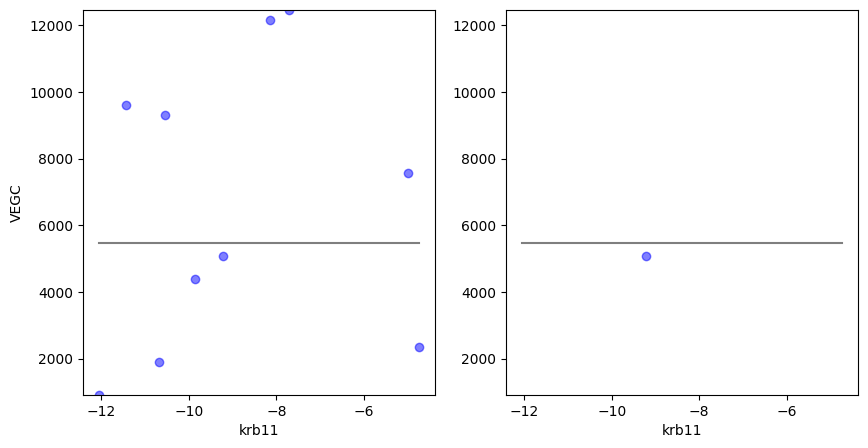

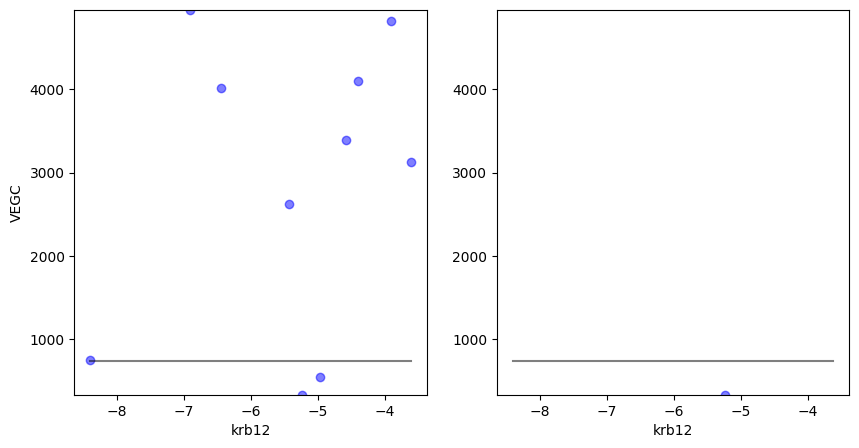

In [ ]:
for i in range(4,13):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='krb'+str(i),ylabel='VEGC')

# SA STEP 3

.8 variation around initial guess for parameter range.
obs 2, 1l, 12 still correlated, but less so. 2, 11, and 12 are still matching the same with addition of cfall.
Doesn't improve matches for previous VEGN or NPP targets, shows similar pattern. 
But, importance shows addition of params/targets that have greater importance to the model

In [2]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
params='sample_matrix_STEP3-MD3-CR.csv'
model='results_STEP3-MD3-CR.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [7]:
!cat ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP3-MD3-CR.csv

cat: ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP3-MD3-CR.csv: No such file or directory


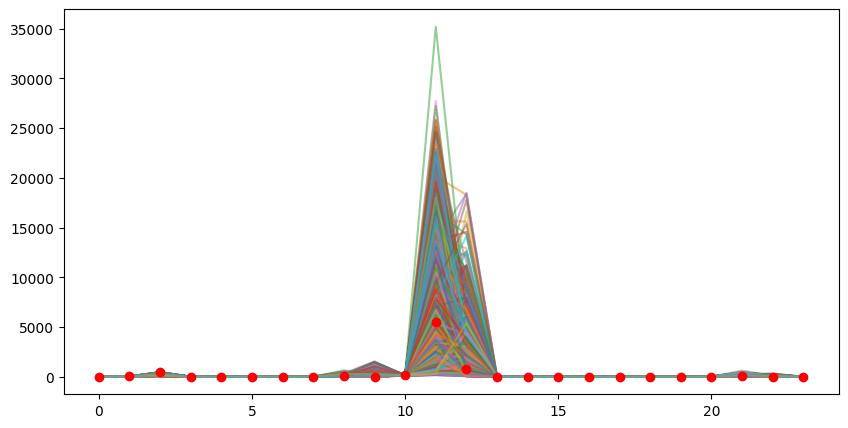

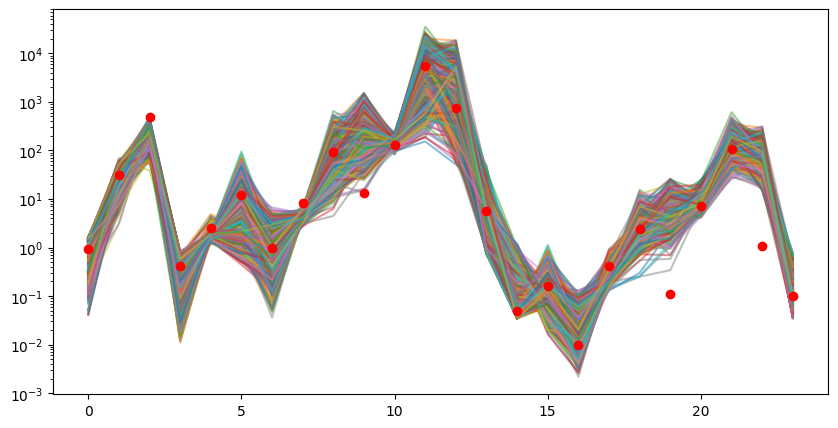

In [ ]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

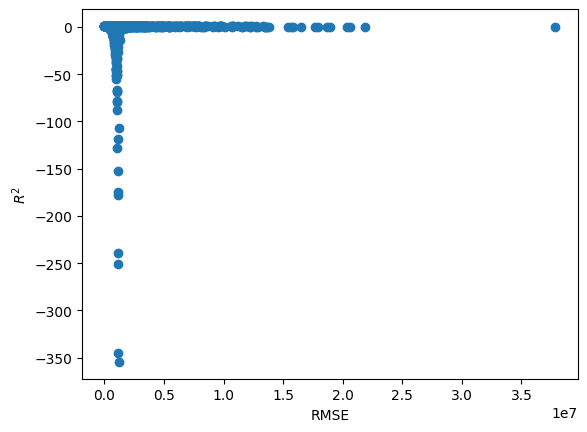

In [ ]:
rmse=ut.plot_r2_rmse(df_model)

In [3]:
xparams, ymodel = ut.get_params(df_param,df_model,r2lim=0.97)
xparams.std()

nmax          1.535227
nmax.1        1.171180
nmax.2        3.376685
nmax.3        0.525046
krb(0)        2.813571
krb(0).1      1.523267
krb(0).2      1.526772
krb(0).3      2.412395
krb(1)        2.394413
krb(1).1      2.000991
krb(1).2      1.845438
krb(2)        3.923389
krb(2).1      2.849490
krb(2).2      1.515763
cfall(0)      0.000876
cfall(0).1    0.023306
cfall(0).2    0.028924
cfall(0).3    0.002539
cfall(1)      0.002716
cfall(1).1    0.003306
cfall(1).2    0.000591
cfall(2)      0.003286
cfall(2).1    0.003649
cfall(2).2    0.000600
nfall(0)      0.005072
nfall(0).1    0.012371
nfall(0).2    0.003437
nfall(1)      0.000480
nfall(1).1    0.000461
nfall(1).2    0.003649
nfall(2)      0.005284
nfall(2).1    0.003298
nfall(2).2    0.003670
dtype: float64

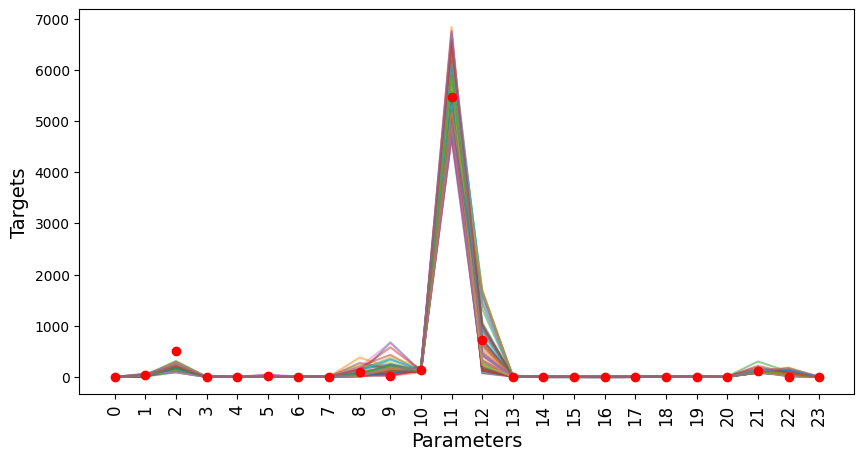

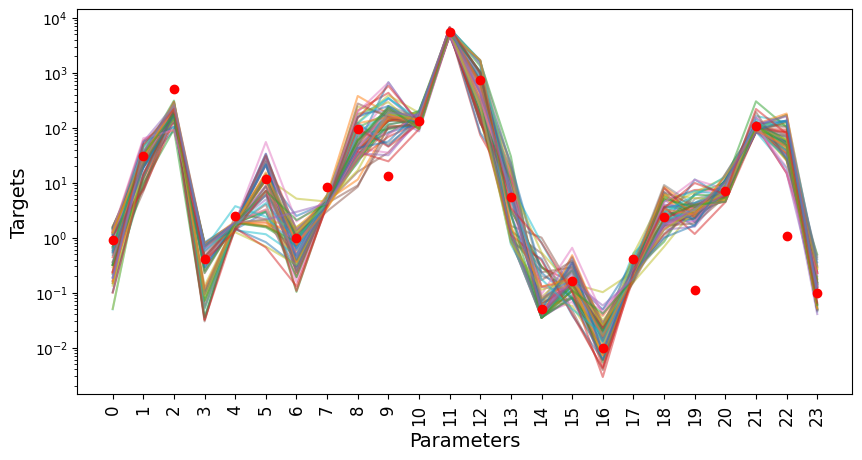

In [3]:
ut.spaghetti_match_plot_r2(df_param,df_model,r2lim=0.95)
ut.spaghetti_match_plot_r2(df_param,df_model,r2lim=0.95, logy=True)


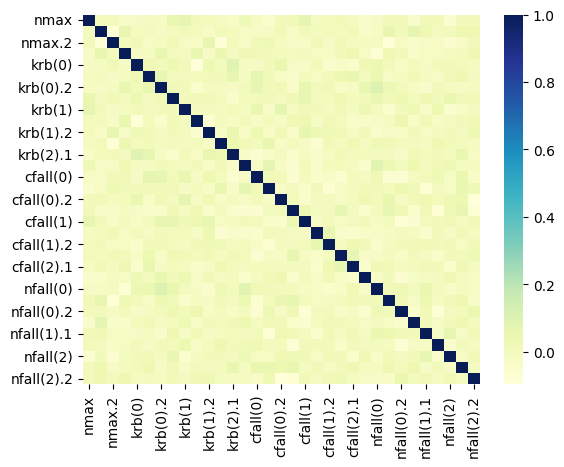

In [ ]:
corr_param=df_param.corr()
high_corr = corr_param[corr_param > 0.4]

sns.heatmap(corr_param, cmap="YlGnBu")
plt.show()

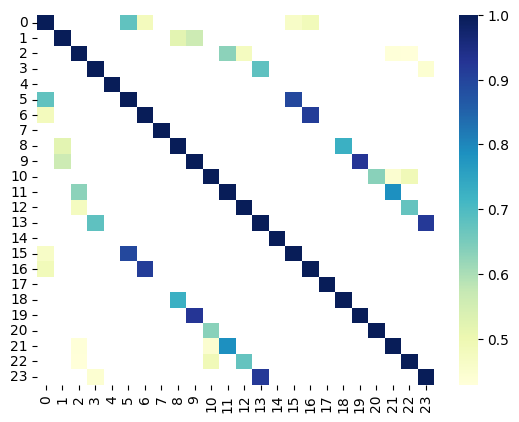

In [ ]:
corr_model=df_model.corr()
high_corr = corr_model[corr_model > 0.4]

sns.heatmap(high_corr, cmap="YlGnBu")
plt.show()

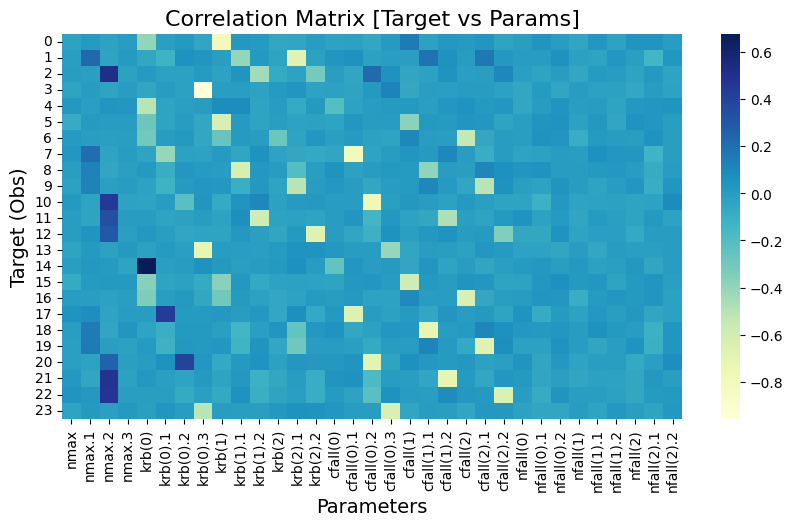

In [ ]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

STEP2-CR:NPP/VEGC model score on training data: 0.9876386022206081
STEP2-CR:NPP/VEGC model score on testing data: 0.9604313678194601


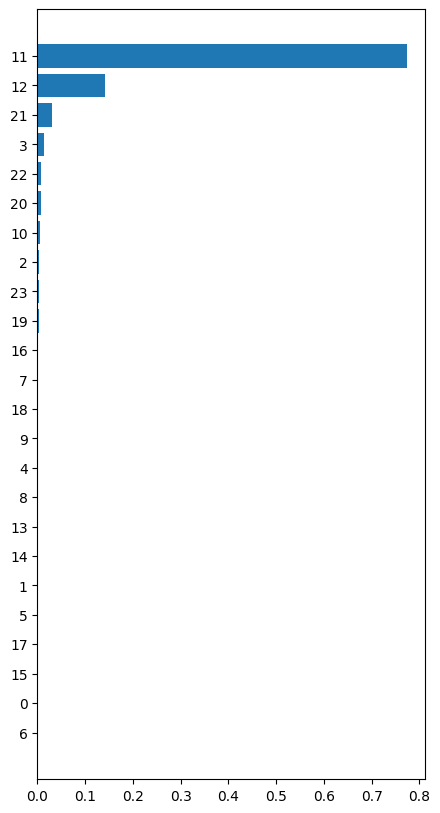

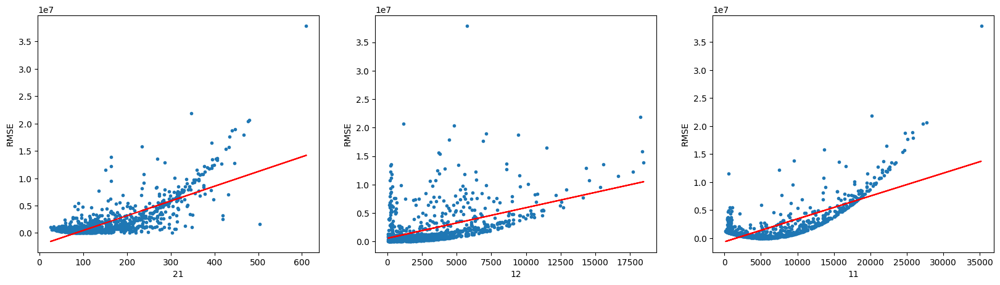

In [ ]:
ut.find_important_features(df_model.iloc[0:-1,:],rmse,1,'STEP2-CR:NPP/VEGC')

STEP2-CR:NPP/VEGC model score on training data: 0.9429510273094865
STEP2-CR:NPP/VEGC model score on testing data: 0.685408348392368


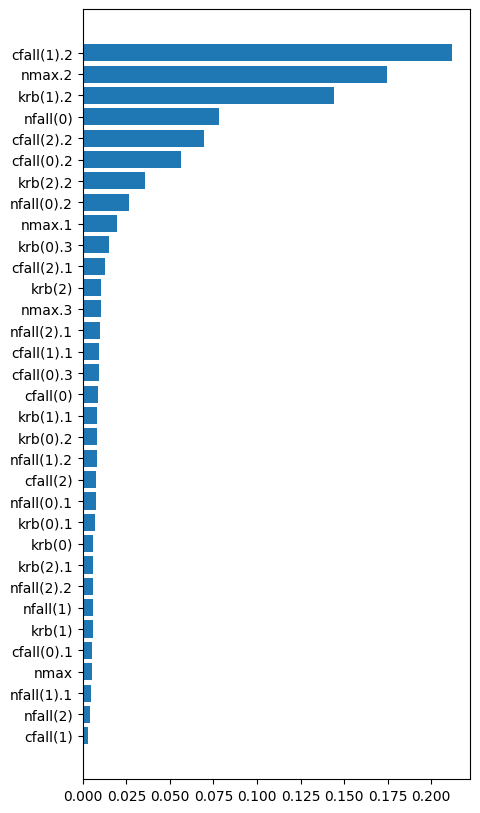

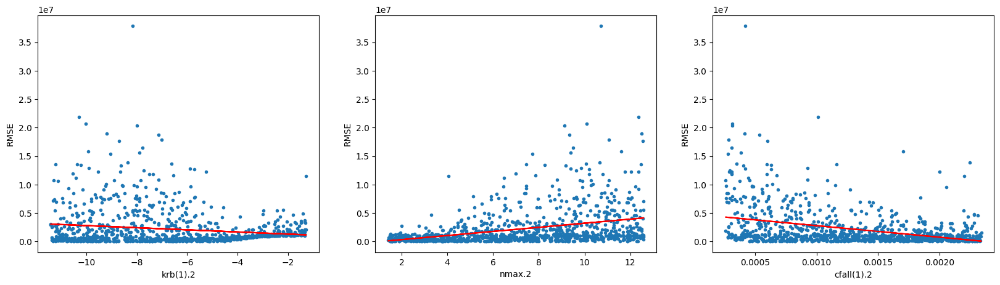

In [ ]:
ut.find_important_features(df_param,rmse,1,'STEP2-CR:NPP/VEGC')

In [ ]:
# for i in range(4):
#     ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='nmax'+str(i),ylabel='NPP')

In [ ]:
# for i in range(4,14):
#     ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='krb'+str(i),ylabel='VEGC')

In [ ]:
# for i in range(14,24):
#     ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='cfall'+str(i),ylabel='VEGC')

In [ ]:
# for i in range(24,30):
#     ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='nfall'+str(i),ylabel='VEGN')

# SA STEP3 cfall + nfall

In [4]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
params='sample_matrix_STEP3-MD3-CR-cfall-nfall.csv'
model='results_STEP3-MD3-CR-cfall-nfall.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [12]:
!cat ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP3-MD3-CR-cfall-nfall.csv

name,bounds,initial,cmtnum,pftnum
cfall(0),"[0.00035999999999999986, 0.00324]",0.0018,3,0
cfall(0),"[0.010999999999999996, 0.099]",0.055,3,1
cfall(0),"[0.012799999999999999, 0.1152]",0.064,3,2
cfall(0),"[0.0010999999999999994, 0.009899999999999999]",0.0055,3,3
cfall(1),"[0.0010999999999999994, 0.009899999999999999]",0.0055,3,0
cfall(1),"[0.0014999999999999996, 0.0135]",0.0075,3,1
cfall(1),"[0.00026000000000000003, 0.00234]",0.0013,3,2
cfall(2),"[0.0013999999999999993, 0.0126]",0.007,3,0
cfall(2),"[0.0017000000000000001, 0.015300000000000001]",0.0085,3,1
cfall(2),"[0.00023999999999999998, 0.0021599999999999996]",0.0012,3,2
nfall(0),"[0.002199999999999999, 0.019799999999999998]",0.011,3,0
nfall(0),"[0.005599999999999997, 0.0504]",0.028,3,1
nfall(0),"[0.0015999999999999999, 0.0144]",0.008,3,2
nfall(1),"[0.00019999999999999998, 0.0018]",0.001,3,0
nfall(1),"[0.00019999999999999998, 0.0018]",0.001,3,1
nfall(1),"[0.0015999999999999999, 0.0144]",0.008,3,2
nfall(2),"[0.002199999999999999, 0.019

In [5]:
output_name = ['NPP0','NPP1','NPP2','NPP3',\
                'VEGC00','VEGC01','VEGC02','VEGC03','VEGC10','VEGC11','VEGC12',\
               'VEGC20','VEGC21','VEGC22',\
                'VEGN00','VEGN01','VEGN02','VEGN03','VEGN0','VEGN11','VEGN12',\
               'VEGN20','VEGN21','VEGN22']
df_model.columns = output_name

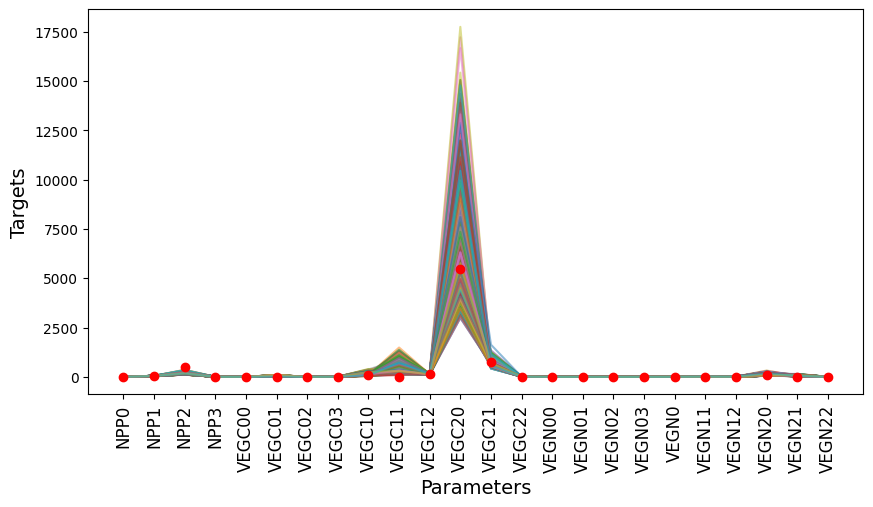

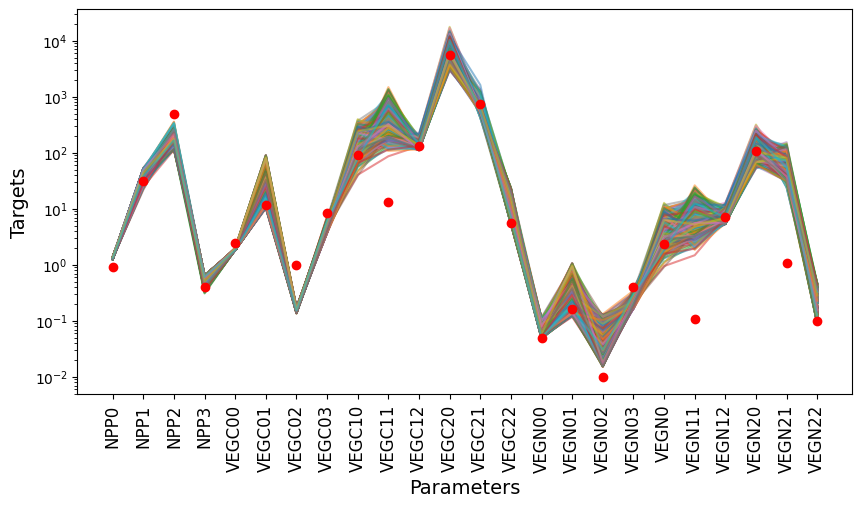

In [14]:
ut.spaghetti_match_plot(df_param, df_model)
ut.spaghetti_match_plot(df_param,df_model,logy=True)

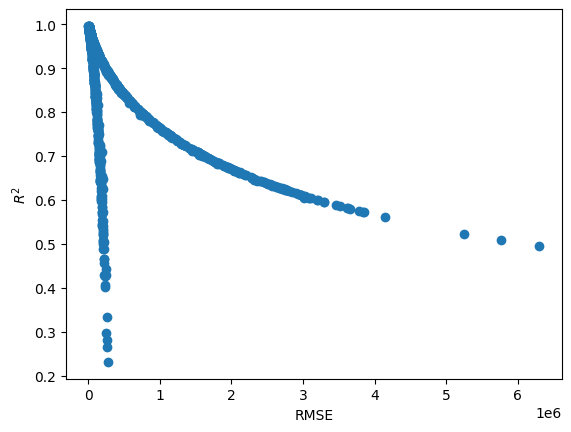

In [ ]:
rmse=ut.plot_r2_rmse(df_model)

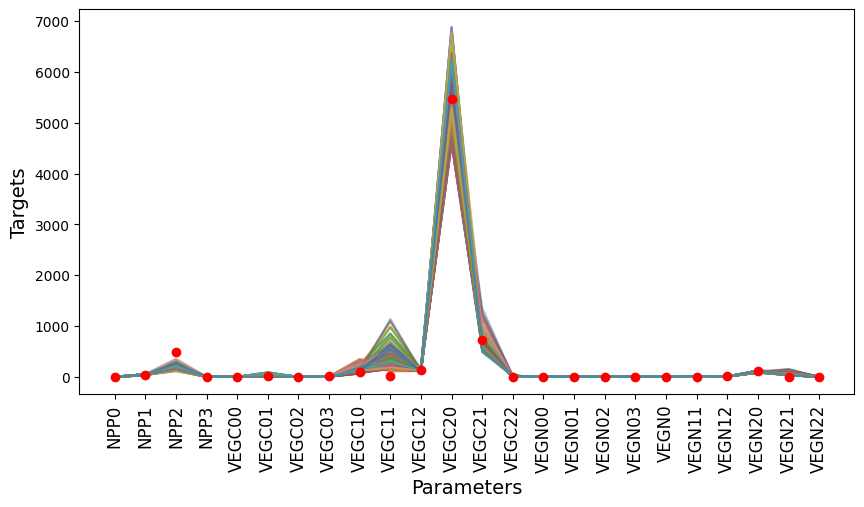

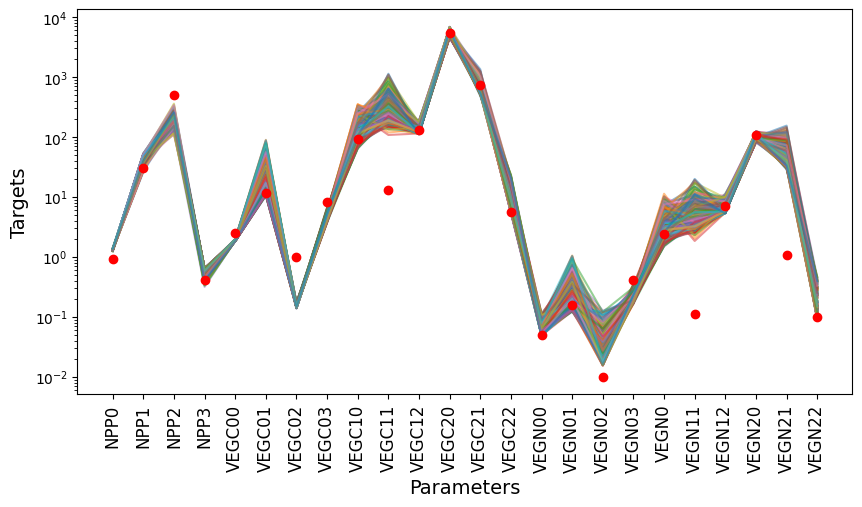

In [6]:
xparams, ymodel = ut.get_params(df_param,df_model,r2lim=0.97)
ut.spaghetti_match_plot_r2(df_param,df_model,r2lim=0.95)
ut.spaghetti_match_plot_r2(df_param,df_model,r2lim=0.95, logy=True)

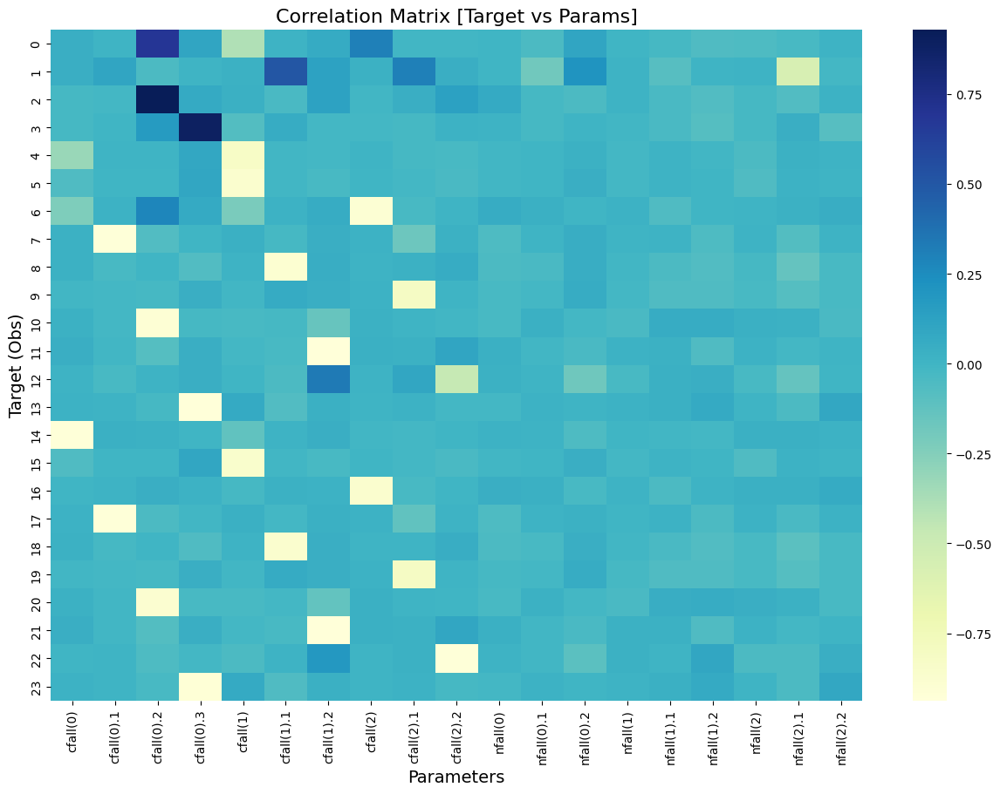

In [ ]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

STEP2-CR:NPP/VEGC model score on training data: 0.998914170892782
STEP2-CR:NPP/VEGC model score on testing data: 0.9996142073156438


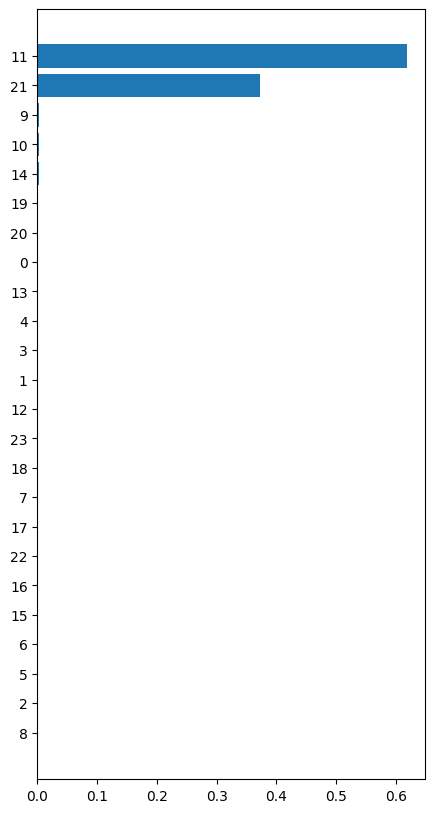

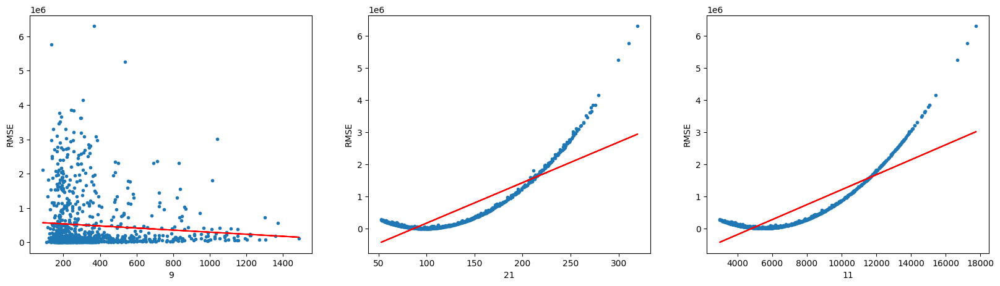

In [ ]:
ut.find_important_features(df_model.iloc[0:-1,:],rmse,1,'STEP2-CR:NPP/VEGC')

STEP2-CR:NPP/VEGC model score on training data: 0.9904040634136978
STEP2-CR:NPP/VEGC model score on testing data: 0.913023736194852


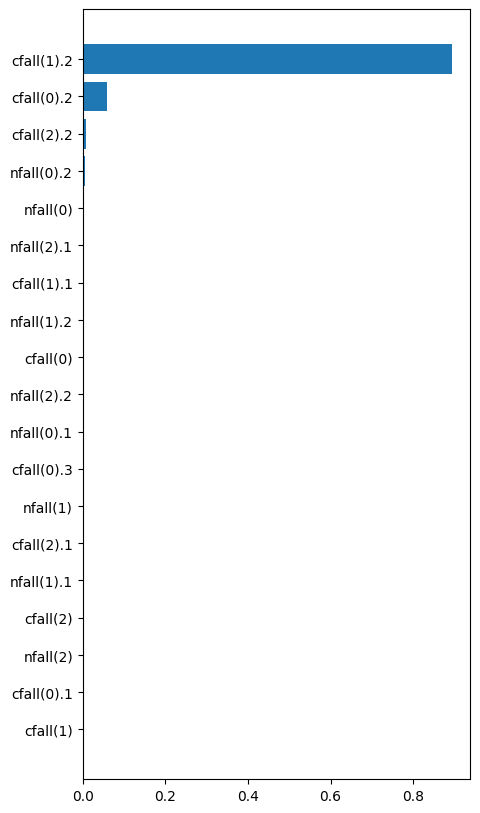

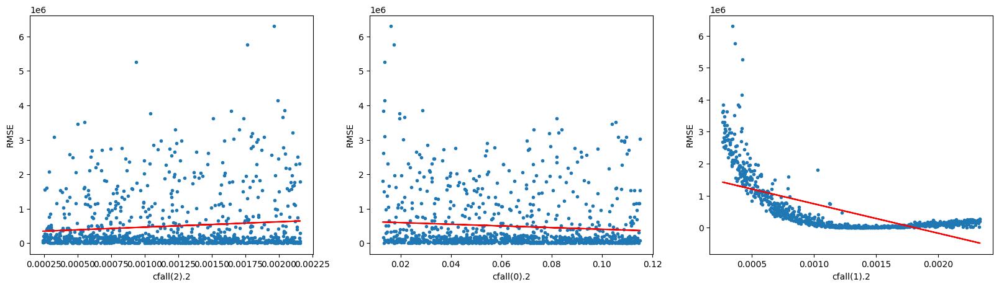

In [ ]:
ut.find_important_features(df_param,rmse,1,'STEP2-CR:NPP/VEGC')

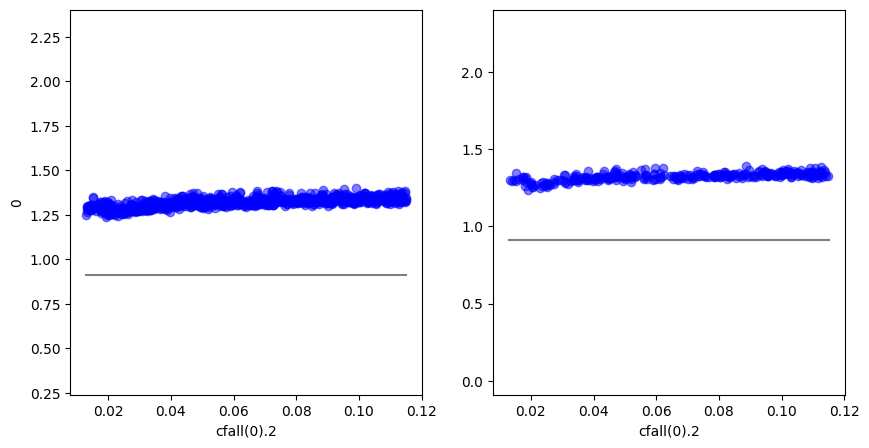

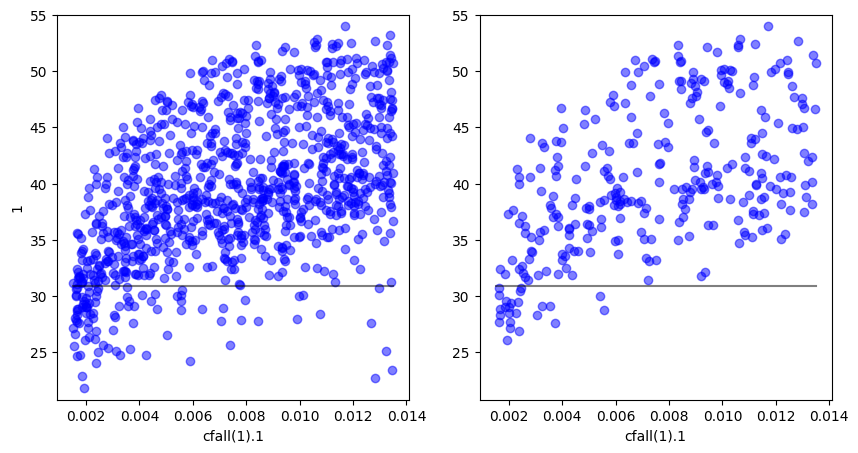

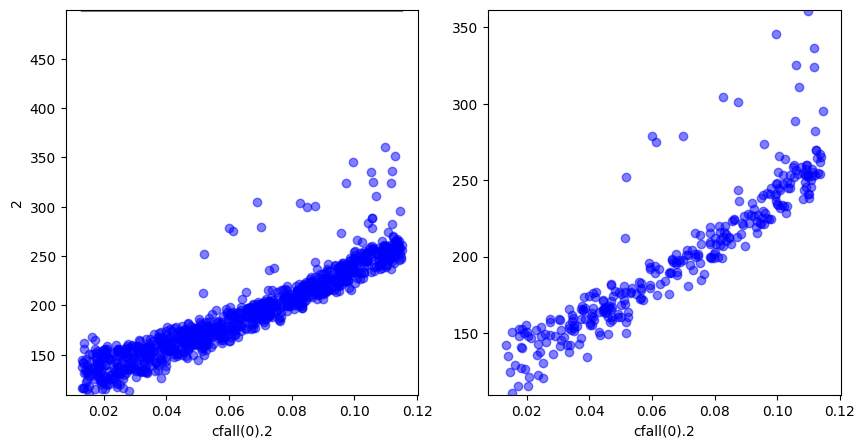

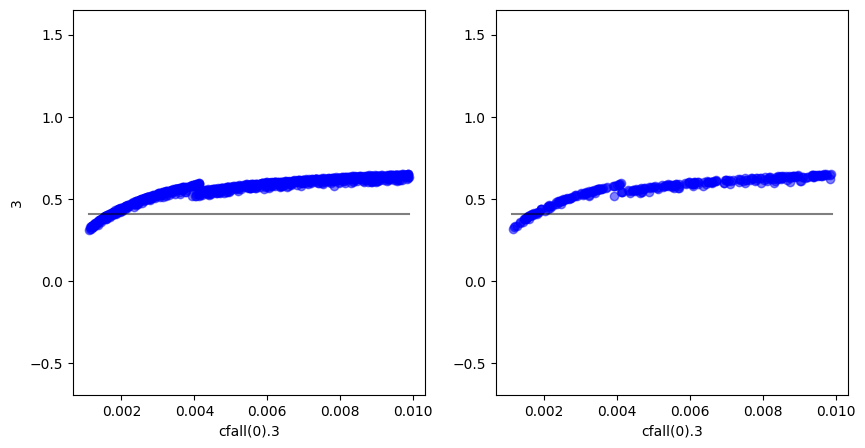

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = 0.50
corr_mask = corr_mp > corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

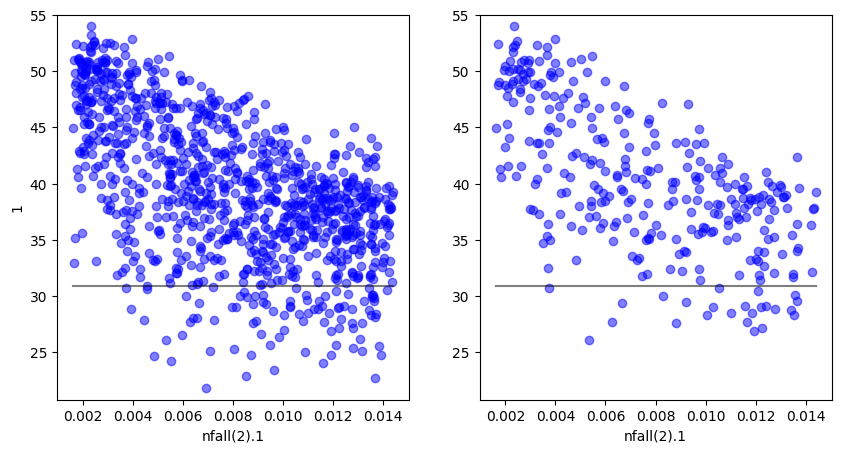

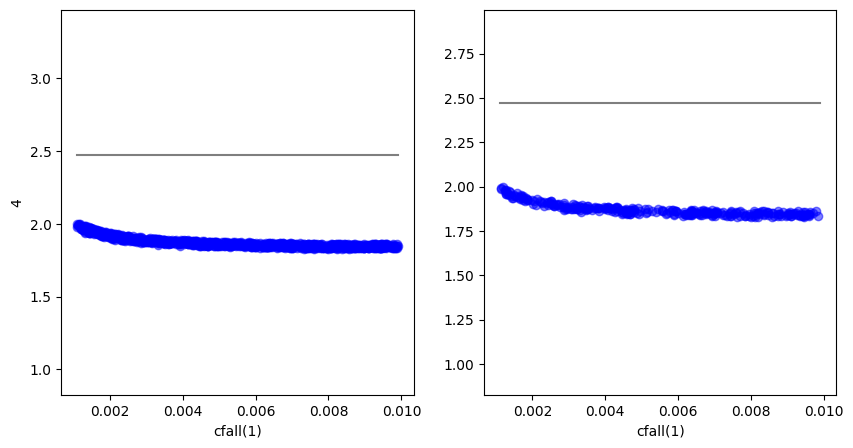

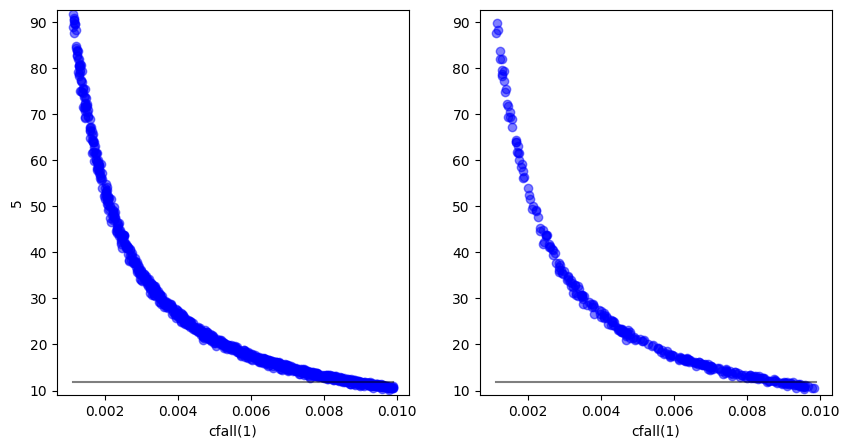

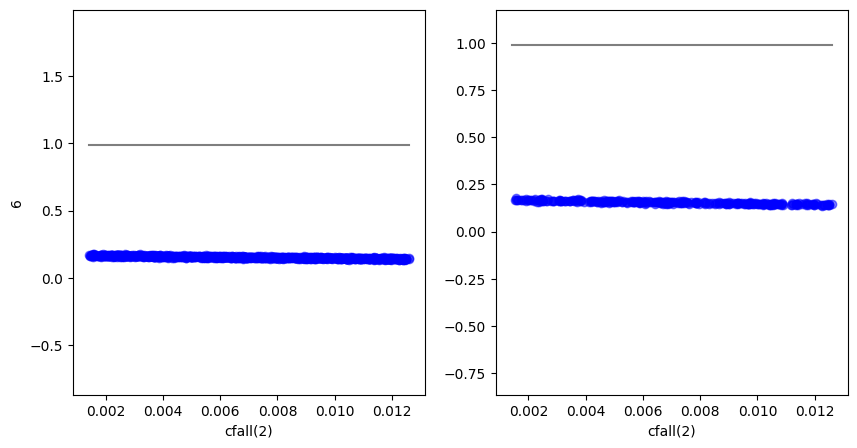

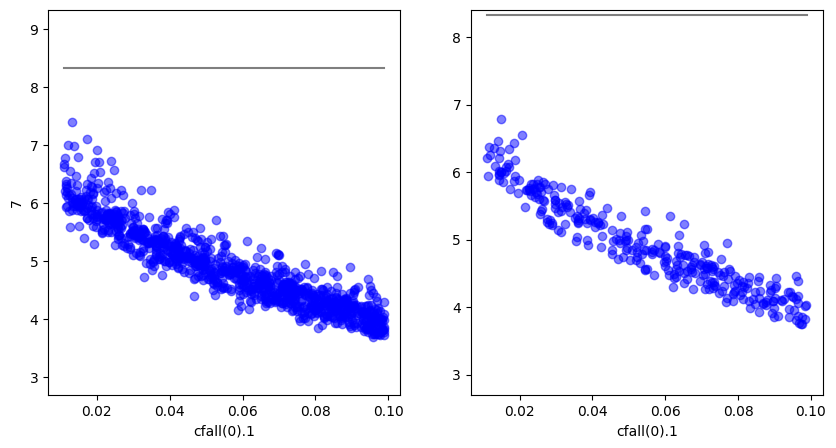

...

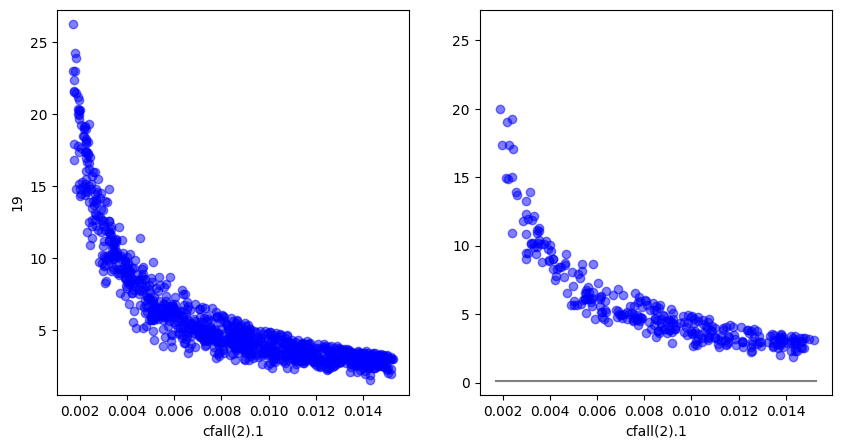

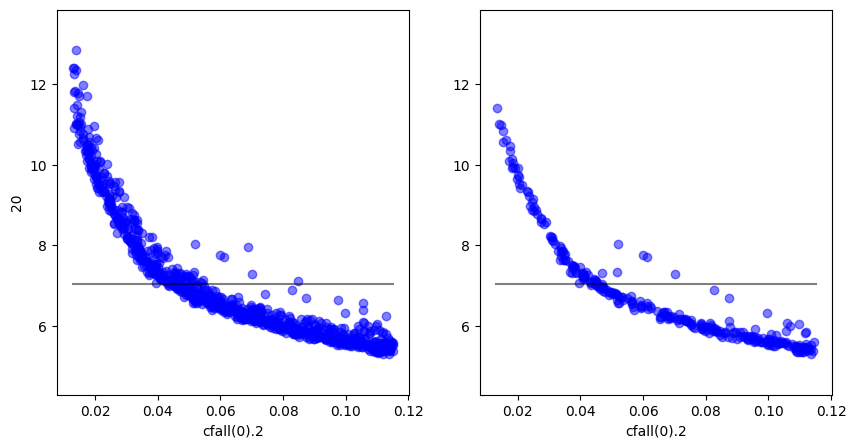

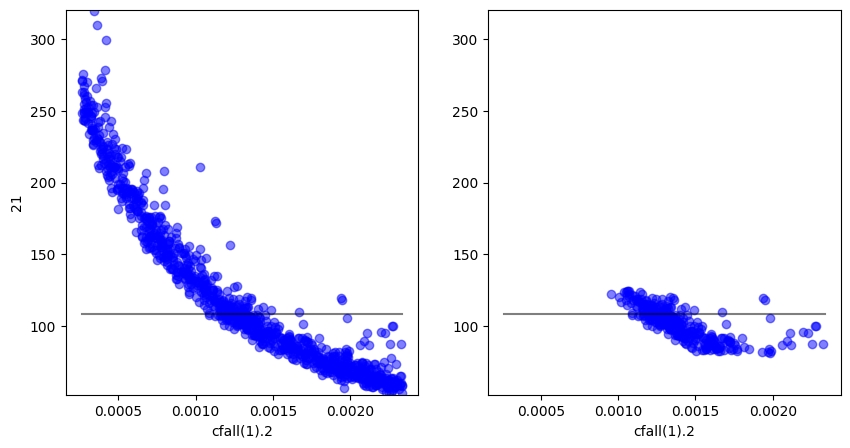

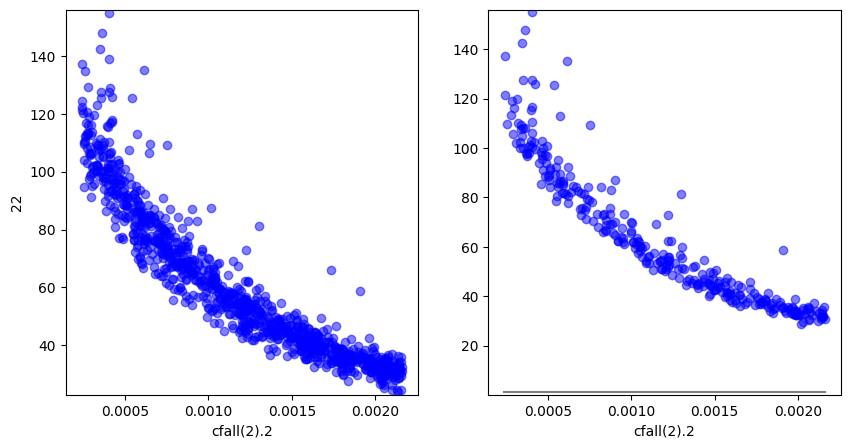

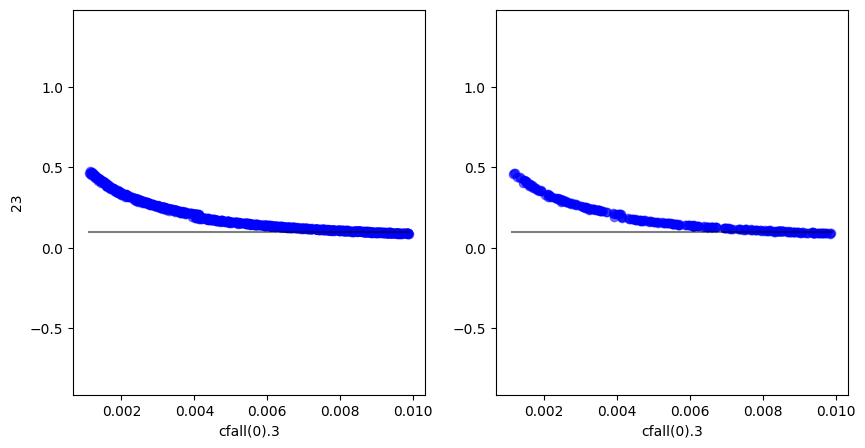

In [ ]:
#automatically plot above scatter plots for relationships above corr threshold (with r2>r2lim)
corr_thresh = -0.50
corr_mask = corr_mp < corr_thresh
x=df_param
y=df_model
tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
            ax1.plot(x[param_col],y.iloc[:-1,model_col],'o',alpha=0.5,color='b')
            ax1.set_xlabel(param_col)
            ax1.set_ylabel(model_col)
            ax1.set_ylim([min(y.iloc[:-1,model_col])-1, max(y.iloc[:,model_col]+1)])
            x1=min(x[param_col])
            x2=max(x[param_col])
            ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')

            ax2.plot(tight_params[param_col],tight_model.iloc[:,model_col],'o',alpha=0.5,color='b')
            ax2.set_xlabel(param_col)
            ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,model_col],alpha=0.5,color='black')
            ax2.set_ylim([min(y.iloc[:,model_col])-1, max(y.iloc[:-1,model_col])+1])

plt.show()

# SA STEP 3 cfall 

In [2]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
params='sample_matrix_STEP3-MD3-CR-cfall.csv'
model='results_STEP3-MD3-CR-cfall.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [3]:
!cat ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP3-MD3-CR-cfall.csv

name,bounds,initial,cmtnum,pftnum
cfall(0),"[0.00035999999999999986, 0.00324]",0.0018,3,0
cfall(0),"[0.010999999999999996, 0.099]",0.055,3,1
cfall(0),"[0.012799999999999999, 0.1152]",0.064,3,2
cfall(0),"[0.0010999999999999994, 0.009899999999999999]",0.0055,3,3
cfall(1),"[0.0010999999999999994, 0.009899999999999999]",0.0055,3,0
cfall(1),"[0.0014999999999999996, 0.0135]",0.0075,3,1
cfall(1),"[0.00026000000000000003, 0.00234]",0.0013,3,2
cfall(2),"[0.0013999999999999993, 0.0126]",0.007,3,0
cfall(2),"[0.0017000000000000001, 0.015300000000000001]",0.0085,3,1
cfall(2),"[0.00023999999999999998, 0.0021599999999999996]",0.0012,3,2


In [10]:
output_name = ['NPP0','NPP1','NPP2','NPP3',\
                'VEGC00','VEGC01','VEGC02','VEGC03','VEGC10','VEGC11','VEGC12',\
               'VEGC20','VEGC21','VEGC22',\
                'VEGN00','VEGN01','VEGN02','VEGN03','VEGN0','VEGN11','VEGN12',\
               'VEGN20','VEGN21','VEGN22']
df_model.columns = output_name

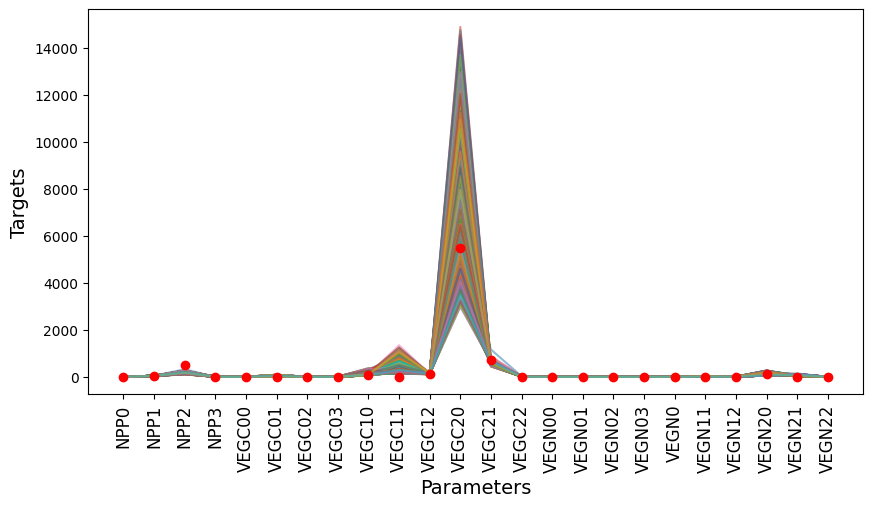

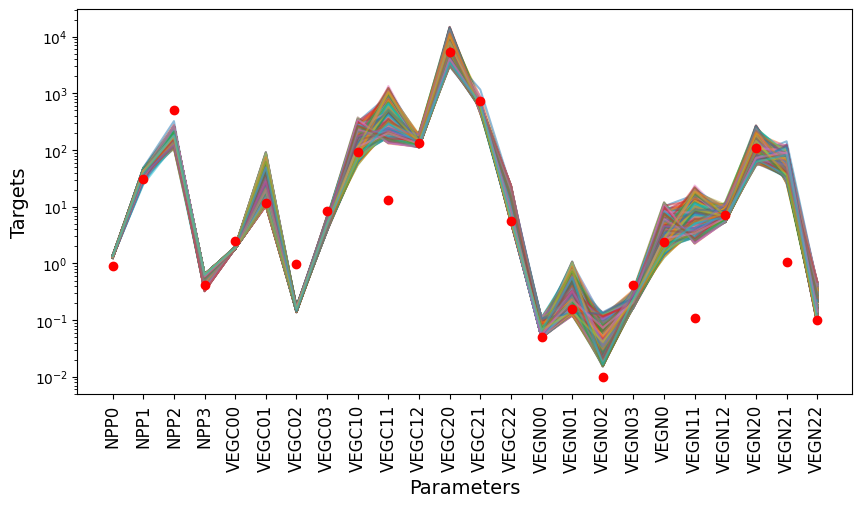

In [4]:
ut.spaghetti_match_plot(df_param,df_model)
ut.spaghetti_match_plot(df_param,df_model,logy=True)

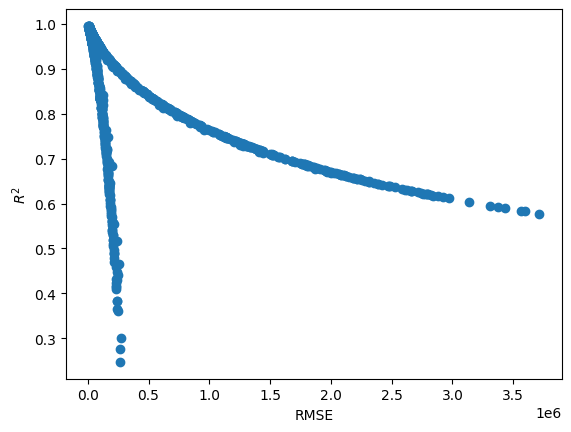

In [6]:
rmse=ut.plot_r2_rmse(df_model)

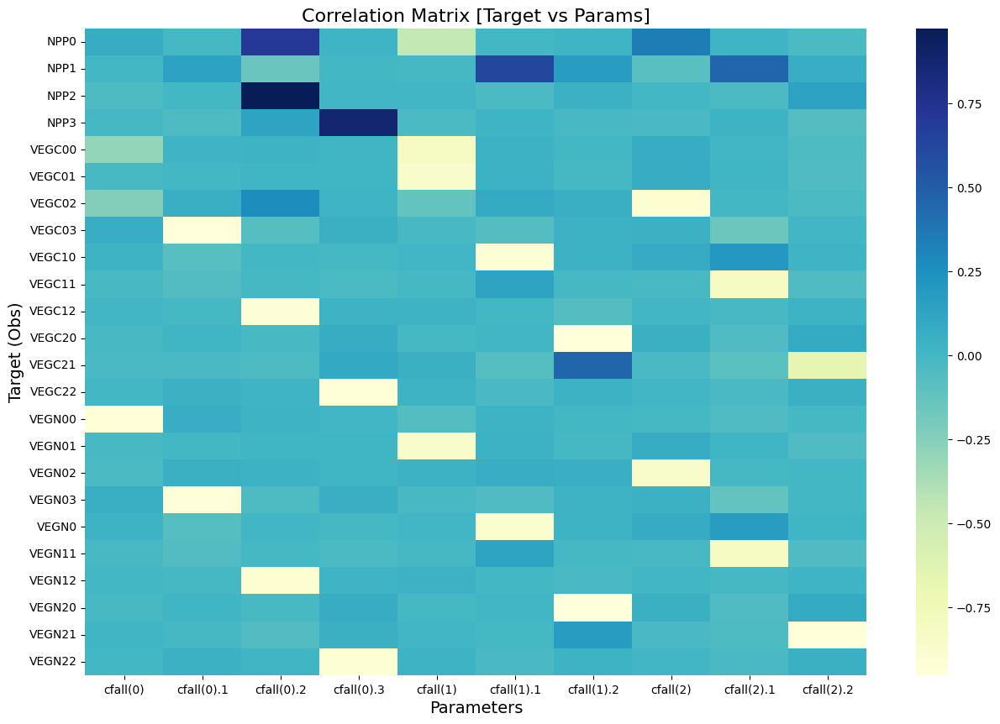

In [14]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

STEP2-CR:NPP/VEGC model score on training data: 0.9998211007905309
STEP2-CR:NPP/VEGC model score on testing data: 0.9991773507592032


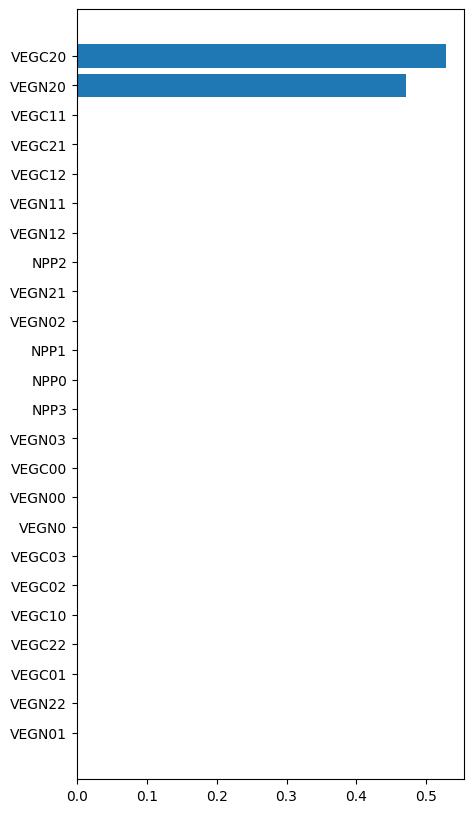

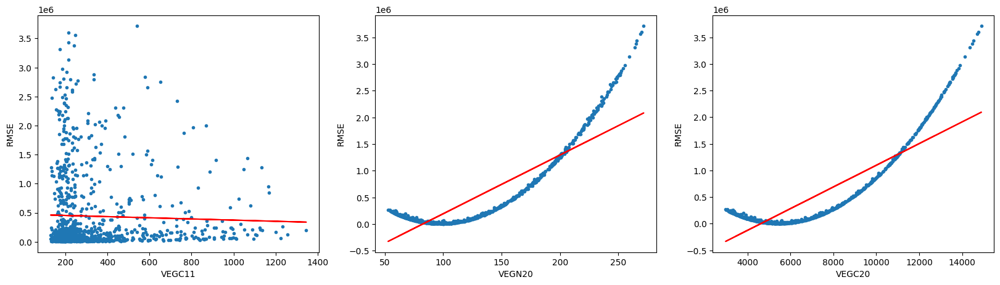

In [15]:
ut.find_important_features(df_model.iloc[0:-1,:],rmse,1,'STEP2-CR:NPP/VEGC')

STEP2-CR:NPP/VEGC model score on training data: 0.9965993488039309
STEP2-CR:NPP/VEGC model score on testing data: 0.9754962397270781


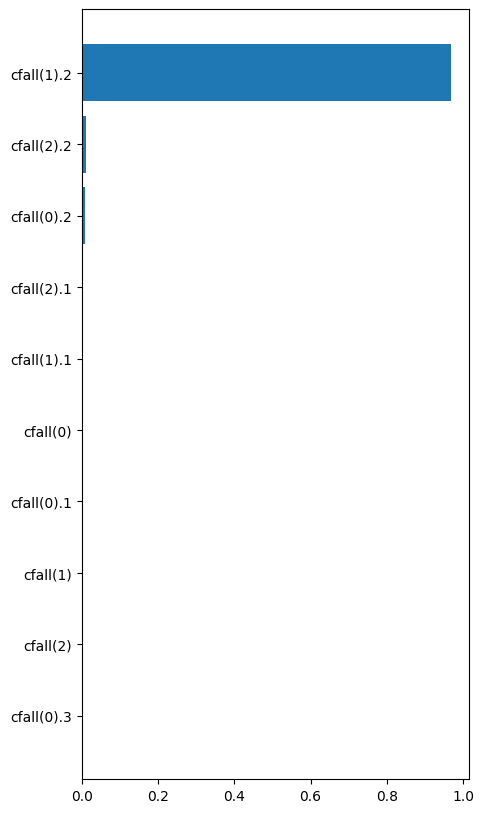

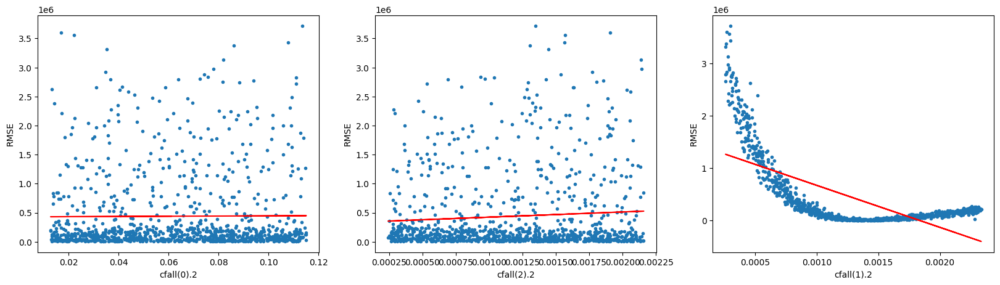

In [16]:
ut.find_important_features(df_param,rmse,1,'STEP2-CR:NPP/VEGC')

/home/akabeer/post_processing_git/MADS-TEM-calibration/utils.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))


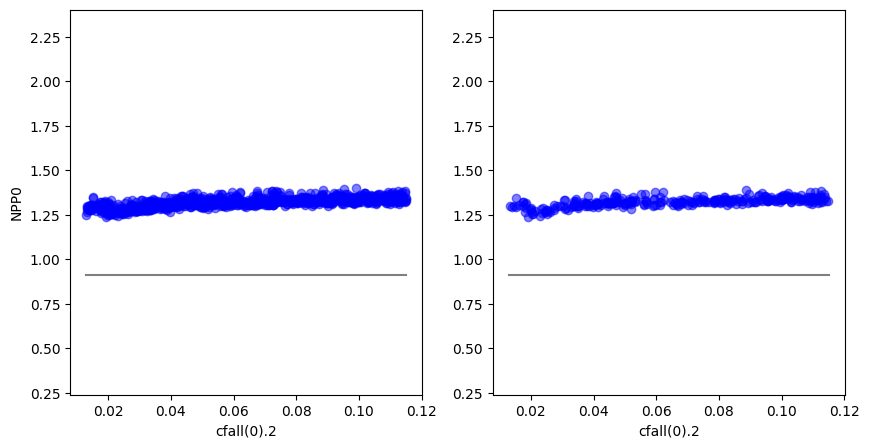

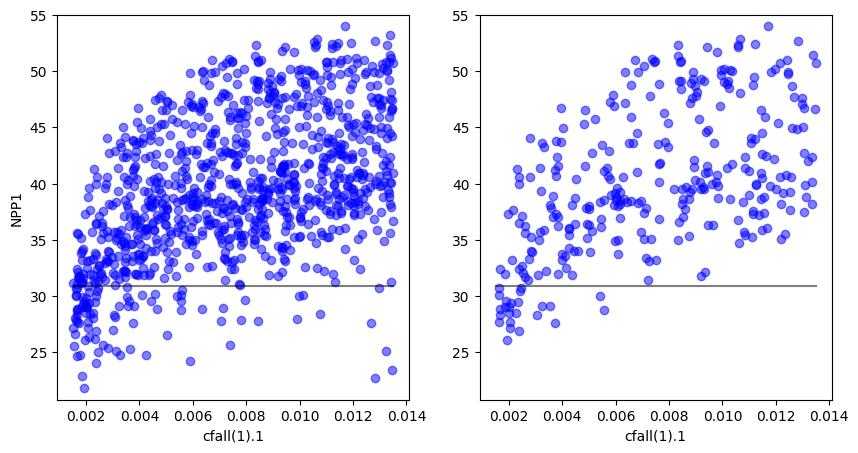

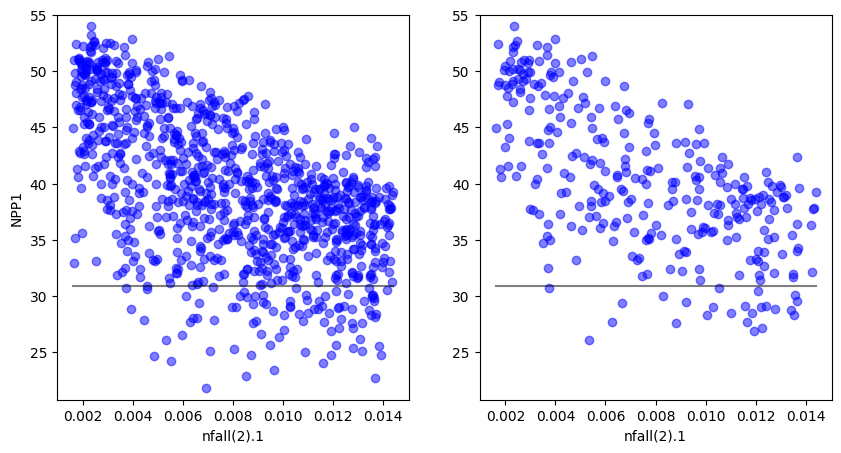

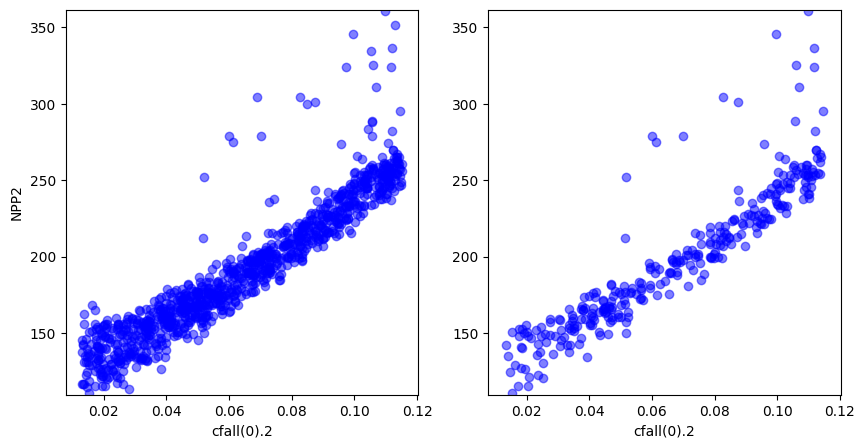

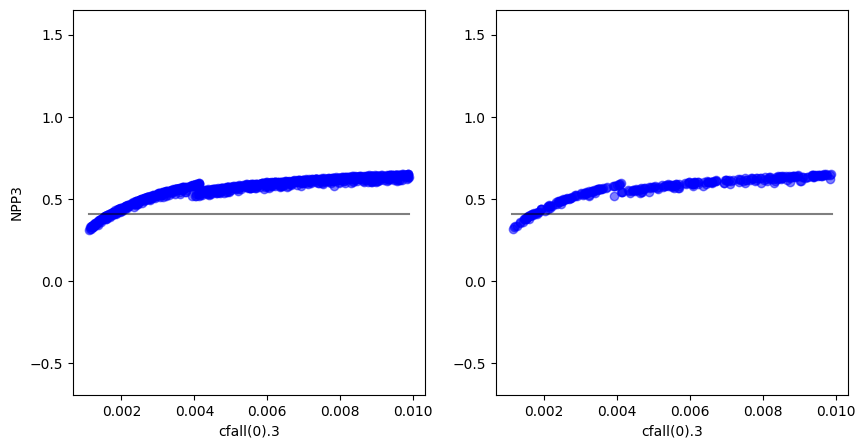

...

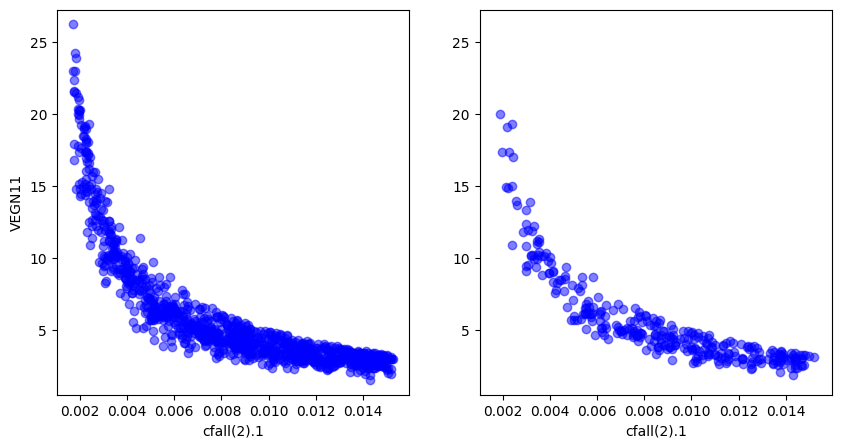

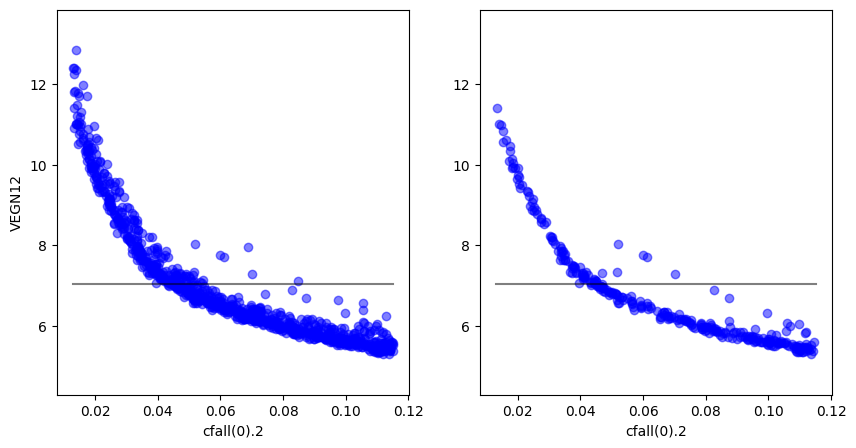

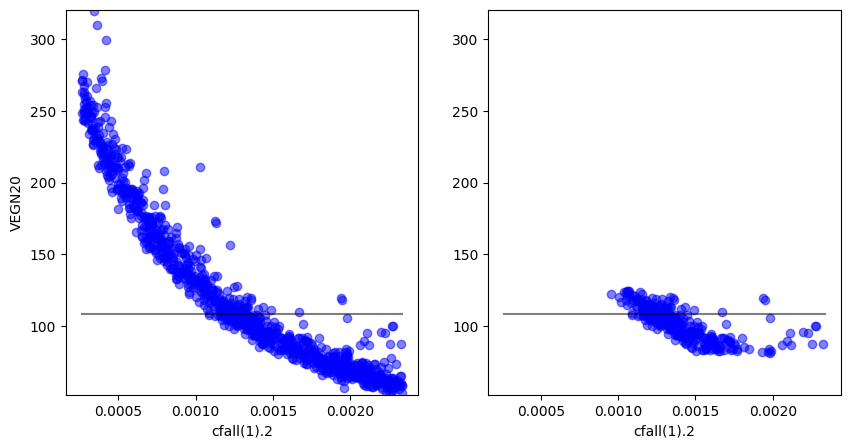

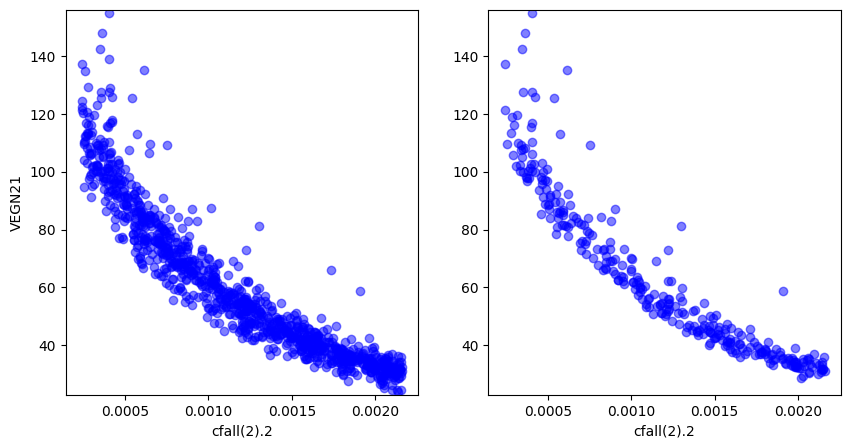

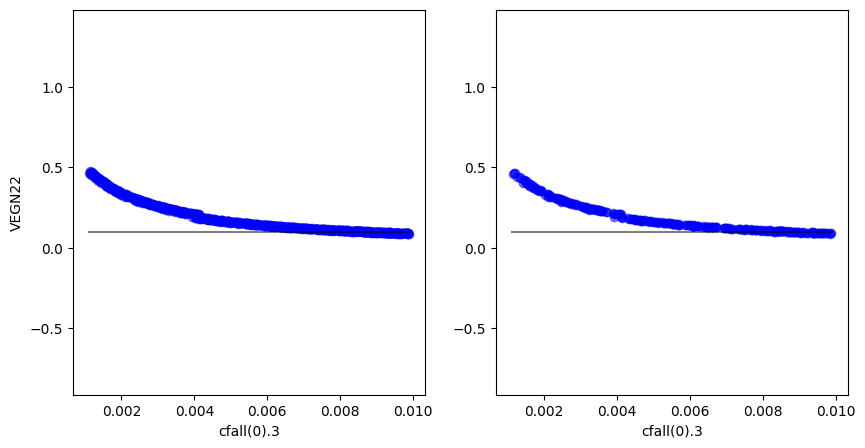

In [18]:
ut.plot_relationships(corr_mp,df_param,df_model,corr_thresh=0.50)

## analysis for results with r2>0.97 (about 206 total)

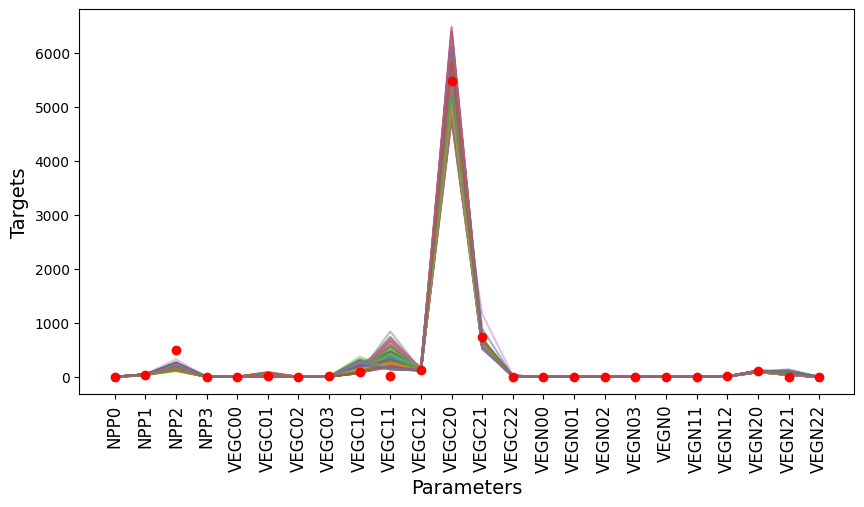

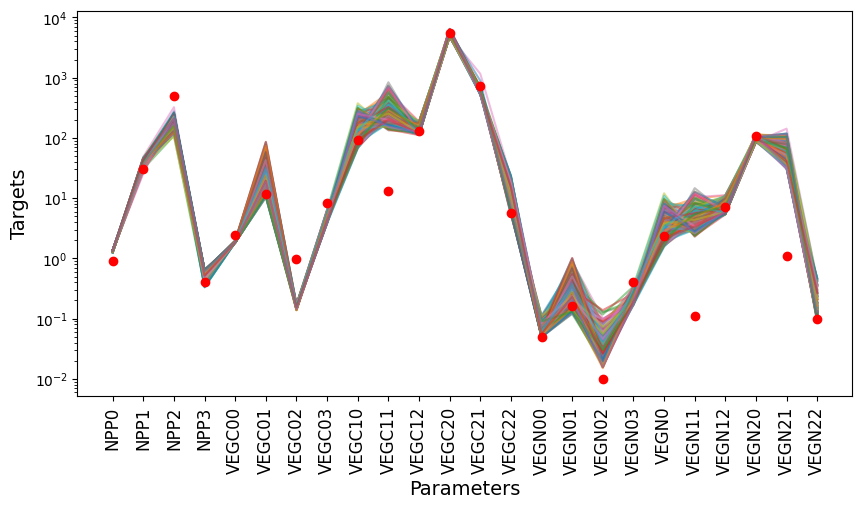

In [11]:
xparams, ymodel = ut.get_params(df_param,df_model,r2lim=.97)
ut.spaghetti_match_plot_r2(df_param,df_model,r2lim=0.97)
ut.spaghetti_match_plot_r2(df_param,df_model,r2lim=0.97, logy=True)

In [5]:
#print bounds of param from best r2 scores
x_max = xparams.max()
x_min = xparams.min()

# Create a list of pairs [x_min, x_max] where x_min and x_max correspond to the same index in xparams
result = [[x_min[i], x_max[i]] for i in range(len(x_max))]

for pair in result:
    print("Uniform({:.5f}, {:.5f})".format(pair[0], pair[1]))


Uniform(0.00038, 0.00323)
Uniform(0.01100, 0.09880)
Uniform(0.01293, 0.11492)
Uniform(0.00116, 0.00990)
Uniform(0.00117, 0.00989)
Uniform(0.00159, 0.01349)
Uniform(0.00107, 0.00228)
Uniform(0.00140, 0.01259)
Uniform(0.00275, 0.01526)
Uniform(0.00026, 0.00216)


In [10]:
#compare best R2 to original bounds used for SA:
!cat ../../dvm-dos-tem/mads_calibration/SA/param_props_STEP3-MD3-CR-cfall.csv

name,bounds,initial,cmtnum,pftnum
cfall(0),"[0.00035999999999999986, 0.00324]",0.0018,3,0
cfall(0),"[0.010999999999999996, 0.099]",0.055,3,1
cfall(0),"[0.012799999999999999, 0.1152]",0.064,3,2
cfall(0),"[0.0010999999999999994, 0.009899999999999999]",0.0055,3,3
cfall(1),"[0.0010999999999999994, 0.009899999999999999]",0.0055,3,0
cfall(1),"[0.0014999999999999996, 0.0135]",0.0075,3,1
cfall(1),"[0.00026000000000000003, 0.00234]",0.0013,3,2
cfall(2),"[0.0013999999999999993, 0.0126]",0.007,3,0
cfall(2),"[0.0017000000000000001, 0.015300000000000001]",0.0085,3,1
cfall(2),"[0.00023999999999999998, 0.0021599999999999996]",0.0012,3,2


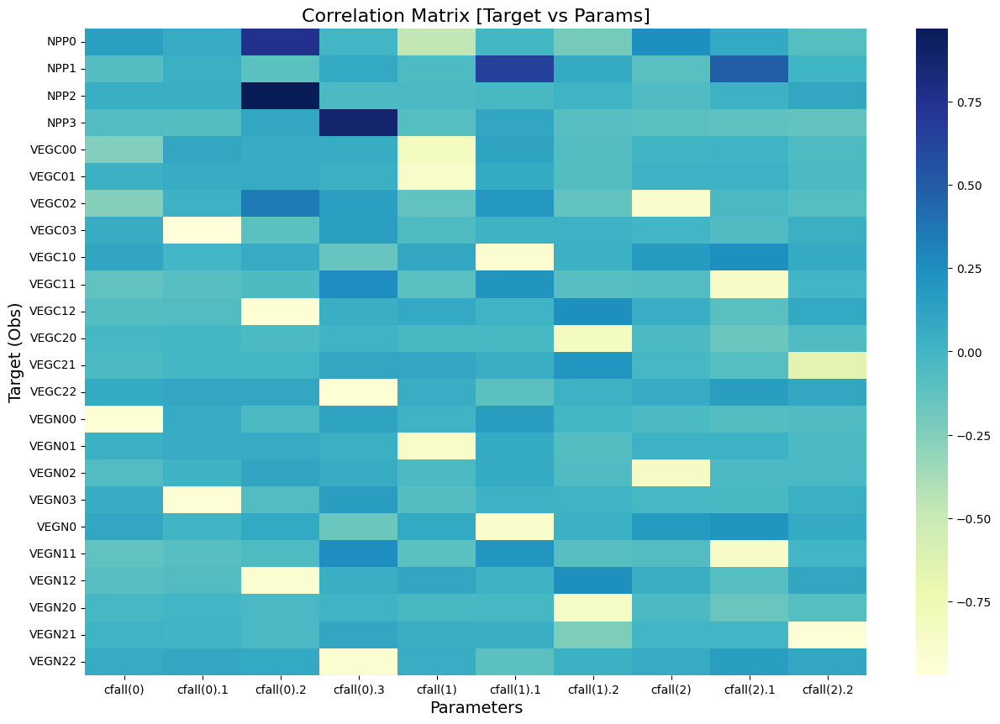

In [12]:
corr_mp=ut.get_output_param_corr(xparams,ymodel)

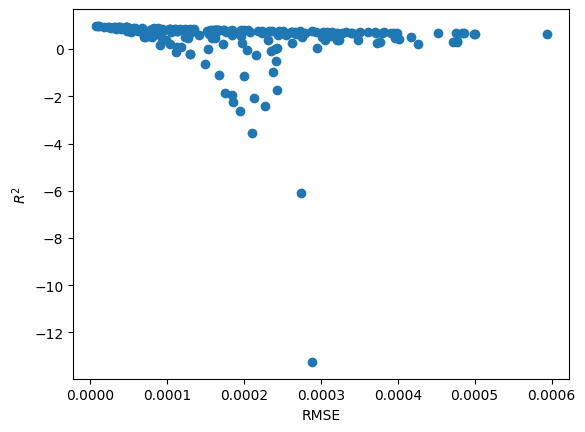

In [8]:
def plot_r2_rmse_thresh(df_y,df_param):
    ''' plots R2 v.s. RMSE, with the condition that last row of the dataframe are targets
        df_y: model output dataframe
    '''
    [n,m]=np.shape(df_y)
    r2=[r2_score(df_y.iloc[i,:], df_param.iloc[-1,:]) for i in range(n)]
    rmse=[mean_squared_error(df_y.iloc[i,:], df_param.iloc[-1,:]) for i in range(n)]
    r2=np.asarray(r2)
    rmse=np.asarray(rmse)
    plt.plot(rmse,r2,'o'), plt.xlabel('RMSE'), plt.ylabel('$R^2$');
    return rmse

rmse=plot_r2_rmse_thresh(xparams, df_param)

STEP2-CR:NPP/VEGC model score on training data: 0.9827704852430512
STEP2-CR:NPP/VEGC model score on testing data: 0.9033082008655269


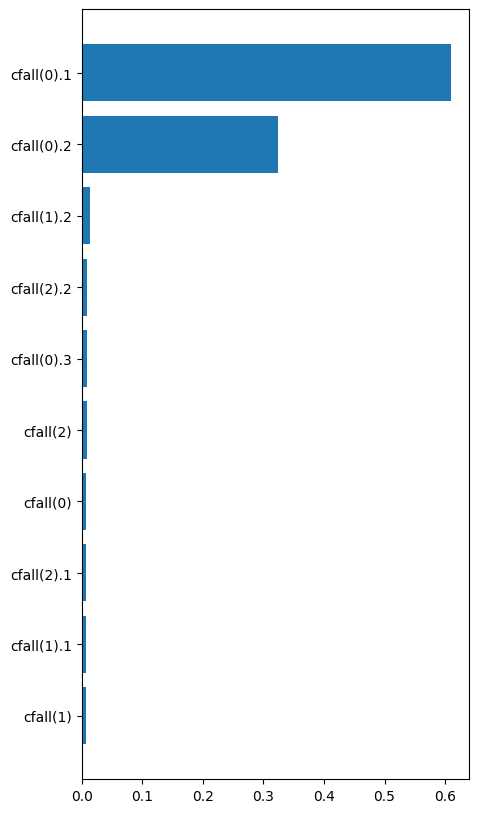

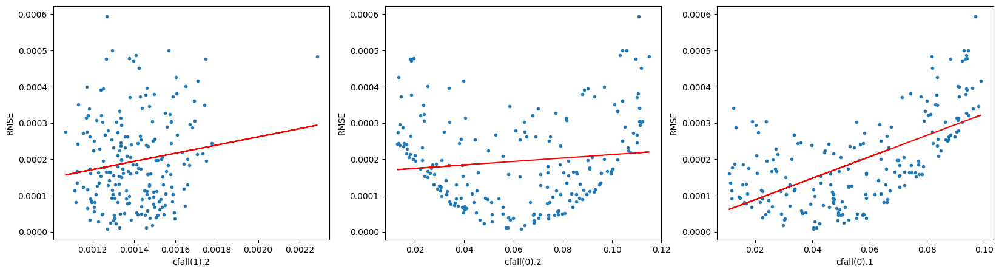

In [49]:
ut.find_important_features(xparams,rmse,1,'STEP3-CR:NPP/VEGC')

STEP3-CR:NPP/VEGC model score on training data: 0.9768815414734053
STEP3-CR:NPP/VEGC model score on testing data: 0.8545568310783496


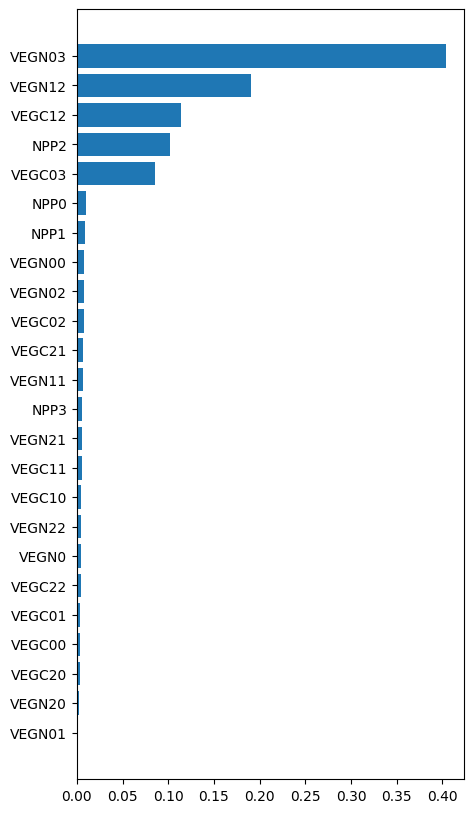

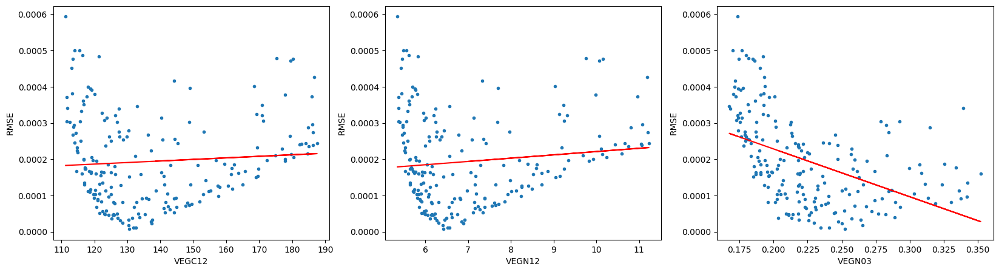

In [13]:
ut.find_important_features(ymodel,rmse,1,'STEP3-CR:NPP/VEGC')

/tmp/ipykernel_79511/1615003032.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))


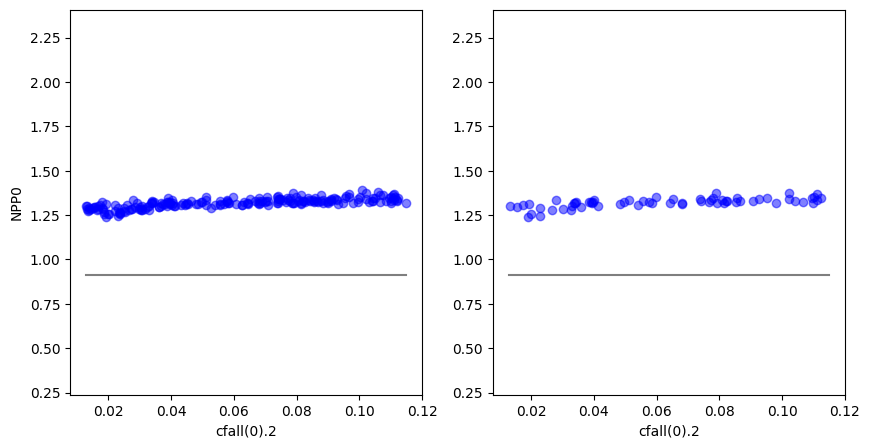

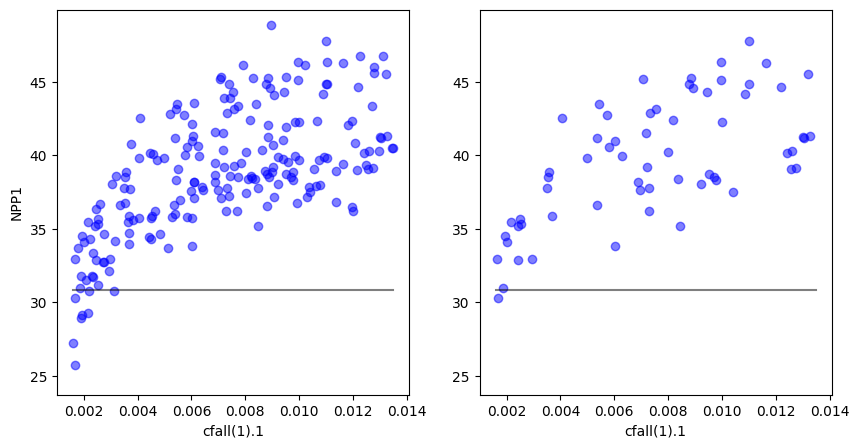

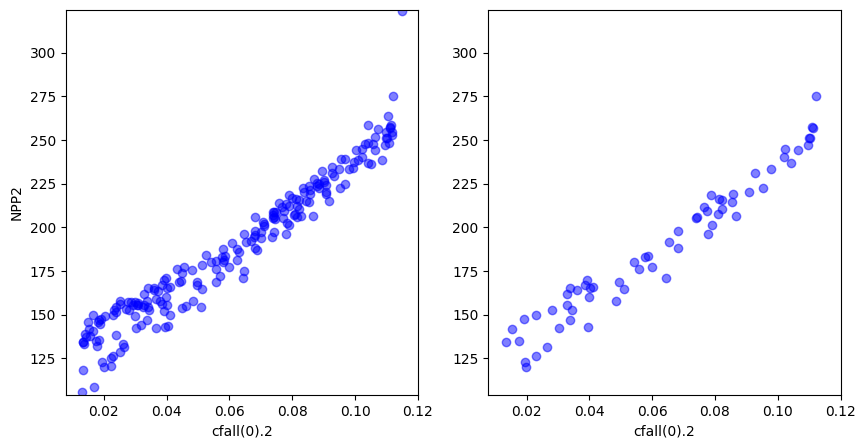

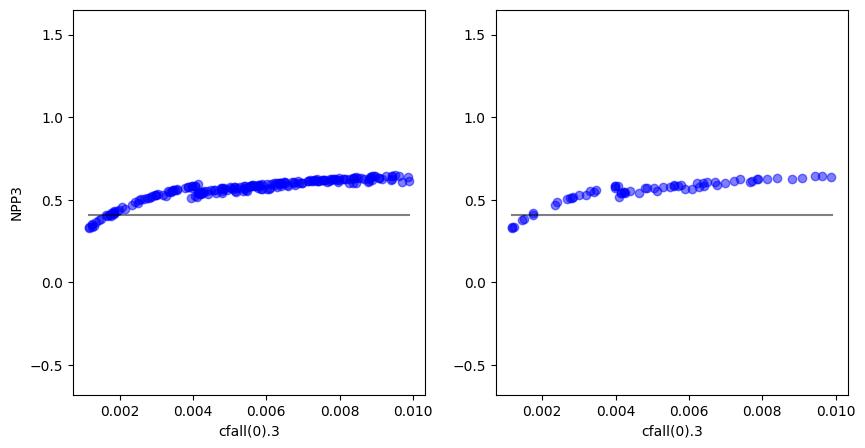

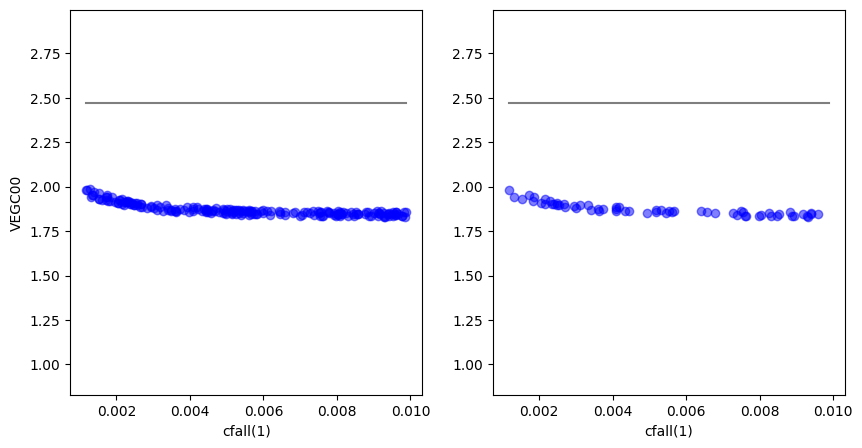

...

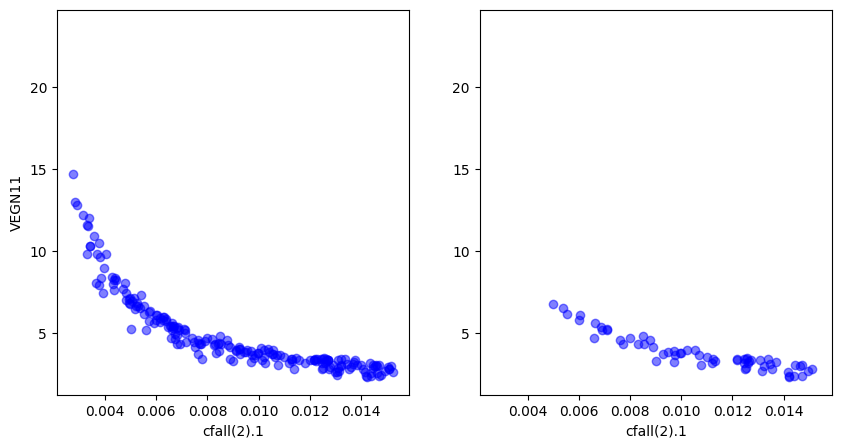

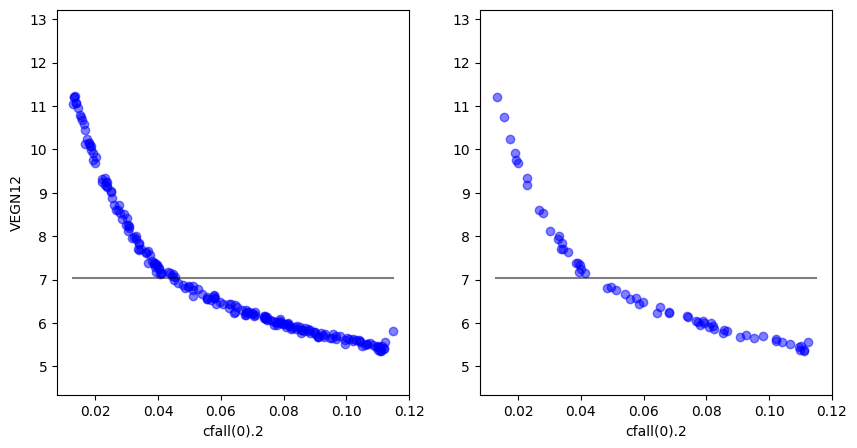

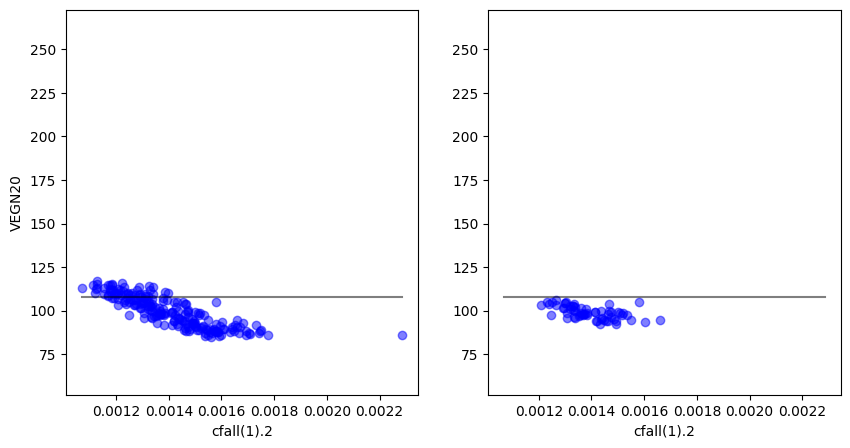

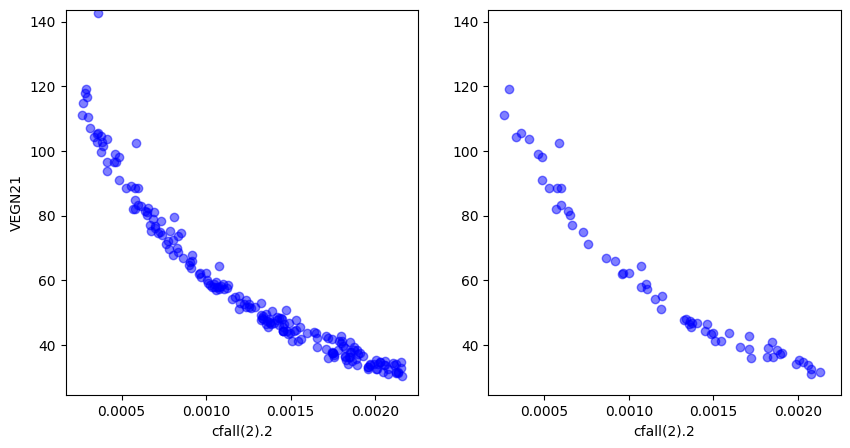

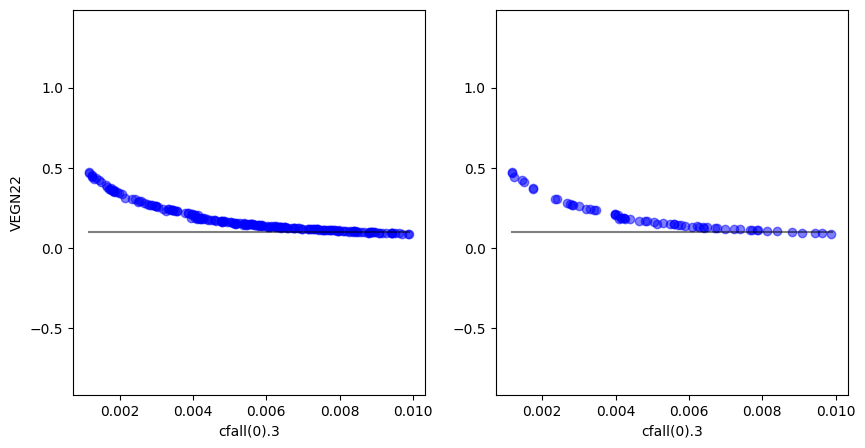

In [14]:
#attempt to look at 0.97 r2 vs 0.99 r2 results - not really useful

def get_params_again(x,y,r2lim=0.95):
    '''
    Inputs:
    x: parameters dataframe 
    y: model outputs dataframe
    r2lim: the R square limit
    
    Outputs:
    xparams: subset of the parameter > r2lim 
    ymodel: subset of the model outputs > r2lim 
    '''
    [n,m]=np.shape(y)
    r2=[r2_score(y.iloc[i,:], df_model.iloc[-1,:]) for i in range(n)]
    r2=np.asarray(r2)
    xparams=x[r2>r2lim]
    ymodel=y[r2>r2lim]
    
    return xparams, ymodel


corr_thresh=0.5
corr_mask = (corr_mp > corr_thresh) | (corr_mp < (-1*corr_thresh))
x=xparams
y=ymodel
tight_params, tight_model = get_params_again(x,y,r2lim=0.99)


for model_col in corr_mask.index:
  for param_col in corr_mask.columns:
      if corr_mask.loc[model_col, param_col]:
          fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
          ax1.plot(x[param_col],y[model_col],'o',alpha=0.5,color='b')
          ax1.set_xlabel(param_col)
          ax1.set_ylabel(model_col)
          ax1.set_ylim([min(df_model[model_col][:-1])-1, max(df_model[model_col][:-1]+1)])
          x1=min(x[param_col])
          x2=max(x[param_col])
          ax1.plot(np.linspace(x1,x2,10),np.ones(10)*df_model[model_col].iloc[-1],alpha=0.5,color='black')

          ax2.plot(tight_params[param_col],tight_model[model_col],'o',alpha=0.5,color='b')
          ax2.set_xlabel(param_col)
          ax2.plot(np.linspace(x1,x2,10),np.ones(10)*df_model[model_col].iloc[-1],alpha=0.5,color='black')
          ax2.set_ylim([min(df_model[model_col][:-1])-1, max(df_model[model_col][:-1])+1])

plt.show()